# Прогнозирование страхового случая по изображениям

### Введение

В данном проекте рассмотрим задачу для страховой компании. В качестве основного источника данных используется датасет [Fast, Furious and Insured](https://www.kaggle.com/datasets/infernape/fast-furious-and-insured). Он содержит изображения автомобилей и табличную разметку. Мы будем рассматривать изображения

С точки зрения машинного обучения задачу на изображениях формулируем следующим образом:

* **Тип задачи:** бинарная классификация изображений
* **Объект наблюдения:** фотография автомобиля
* **Входные данные:** RGB-изображение автомобиля
* **Целевая переменная:** `Condition`
* **Выход модели:** вероятность принадлежности изображения к классу поврежденного автомобиля

В рамках проекта будем интерпретировать целевую переменную следующим образом:

|Значение целевой переменной|Интерпретация|
|----|----|
|`0`|автомобиль без видимых повреждений |
|`1`|автомобиль с видимыми повреждениями|

Перед обучением моделей необходимо проверить фактические значения `Condition` в датасете

Для решения задачи классификации изображений используются сверточные нейронные сети. Это связано с тем, что изображение имеет пространственную структуру, т.к. соседние пиксели образуют локальные визуальные паттерны, например в нашем случая края, контуры, царапины, вмятины и деформации кузова.

В материалах лекций по сверточным нейронным сетям мы рассматриваем изображение рассматривается как тензор размера W на H на C, где W = ширина, H = высота, а C = количество каналов. Для RGB-изображений обычно используется три канала red, green и blue. Также мы помним, что операция свертки позволяет получать карты признаков, т. е. находить локальные паттерны на изображении с помощью обучаемых фильтров.

Поэтому для данной задачи будут использоваться CNN архитектуры, которые лучше подходят для обработки изображений, чем обычные полносвязные сети

### Подготовка

Перед загрузкой данных и обучением моделей зададим общие параметры эксперимента. Все сравниваемые архитектуры должны обучаться в одинаковых условиях

определим где запущен ноутбук

In [1]:
from pathlib import Path
import sys
import subprocess

try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

IN_COLAB

True

In [2]:
def install_packages(packages):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q'] + packages)

if IN_COLAB:
    install_packages(['mlflow', 'dagshub', 'torchinfo', 'opencv-python', 'timm'])

настраиваем путь к данным

In [3]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    DATA_DIR = Path('/content/data/Fast_Furious_Insured')
    if not DATA_DIR.exists():
        !mkdir -p /content/data
        !unzip -q "/content/drive/MyDrive/Fast_Furious_Insured.zip" -d "/content/data"
else:
    DATA_DIR = Path('Fast_Furious_Insured')
    if not DATA_DIR.exists():
        DATA_DIR = Path('data/Fast_Furious_Insured')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Проверяем, что путь правильный

In [4]:
print(DATA_DIR)
print((DATA_DIR / 'train.csv').exists())
print((DATA_DIR / 'trainImages').exists())

/content/data/Fast_Furious_Insured
True
True


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, balanced_accuracy_score
from PIL import Image, ImageOps
from tqdm import tqdm
from torchinfo import summary
import cv2
import hashlib
import random
import mlflow
import time
import dagshub
import timm

Зафиксируем random seed, чтобы разбиение данных, случайные операции и инициализация весов модели были более воспроизводимыми

In [6]:
random_state = 42
random.seed(random_state)
np.random.seed(random_state)
torch.manual_seed(random_state)
if torch.cuda.is_available():
    torch.cuda.manual_seed(random_state)
    torch.cuda.manual_seed_all(random_state)

Наш состав датасета который мы будем использовать:
- train.csv - таблица с обучающей разметкой
- trainImages - папка с обучающими изображениями

Так как задача на изображениях решается как задача компьютерного зрения, нам необходимо связать строки таблицы train.csv с соответствующими файлами из папки trainImages

In [7]:
train_data = pd.read_csv(DATA_DIR / 'train.csv')

In [8]:
train_data.head()

,Image_path,Insurance_company,Cost_of_vehicle,Min_coverage,Expiry_date,Max_coverage,Condition,Amount
0,img_4513976.jpg,BQ,41500.0,1037.5,2026-12-03,36142.68,0,0.0
1,img_7764995.jpg,BQ,50700.0,1267.5,2025-07-10,12753.00,1,6194.0
2,img_451308.jpg,A,49500.0,1237.5,2022-08-11,43102.68,0,0.0
3,img_7768372.jpg,A,33500.0,837.5,2022-08-02,8453.00,1,7699.0
4,img_7765274.jpg,AC,27600.0,690.0,2026-05-01,6978.00,1,8849.0


In [9]:
train_data.shape

(1399, 8)

In [10]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Image_path         1399 non-null   object 
 1   Insurance_company  1399 non-null   object 
 2   Cost_of_vehicle    1310 non-null   float64
 3   Min_coverage       1310 non-null   float64
 4   Expiry_date        1399 non-null   object 
 5   Max_coverage       1310 non-null   float64
 6   Condition          1399 non-null   int64  
 7   Amount             1388 non-null   float64
dtypes: float64(4), int64(1), object(3)
memory usage: 87.6+ KB


In [11]:
train_data.isna().sum()

,0
Image_path,0
Insurance_company,0
Cost_of_vehicle,89
Min_coverage,89
Expiry_date,0
Max_coverage,89
Condition,0
Amount,11


In [12]:
train_data.duplicated().sum()

np.int64(0)

После загрузки таблиц видно, что обучающая выборка содержит 1399 объектов и 8 столбцов.

В обучающей таблице присутствуют следующие столбцы:

- `Image_path` - имя файла изображения автомобиля
- `Insurance_company` - страховая компания
- `Cost_of_vehicle` - стоимость автомобиля
- `Min_coverage` - минимальное покрытие
- `Expiry_date` - дата окончания страхового покрытия
- `Max_coverage` - максимальное покрытие
- `Condition` - состояние автомобиля
- `Amount` - сумма страховой выплаты

Для задачи компьютерного зрения используем два ключевых столбца:

- `Image_path`, так как он связывает строку таблицы с изображением из папки `trainImages`
- `Condition`, так как эта переменная будет использоваться как целевая переменная для классификации изображения

В столбцах `Cost_of_vehicle`, `Min_coverage`, `Max_coverage` и `Amount` есть пропуски. Однако для текущей CV задачи это нам не является критичным, потому что столбцы `Image_path` и `Condition` не содержат пропущенных значений

### Разведочный анализ данных

#### Анализ целевой переменной

Перед нами задача - `Image Classification`, то есть определение класса изображения. В нашем случае класс изображения задается переменной `Condition`.

Перед обучением модели необходимо проверить:
- какие значения принимает `Condition`
- сколько объектов относится к каждому классу
- есть ли дисбаланс классов
- как классы связаны с изображениями и страховой выплатой

Проверим уникальные значения переменной `Condition`, чтобы убедиться, что задача действительно является бинарной классификацией

In [13]:
train_data['Condition'].unique()

array([0, 1])

Посчитаем количество объектов в каждом классе, посмотрим на сбалансированность

In [14]:
train_data['Condition'].value_counts()

,count
Condition,
1,1300
0,99


In [15]:
train_data['Condition'].value_counts(normalize=True)

,proportion
Condition,
1,0.929235
0,0.070765


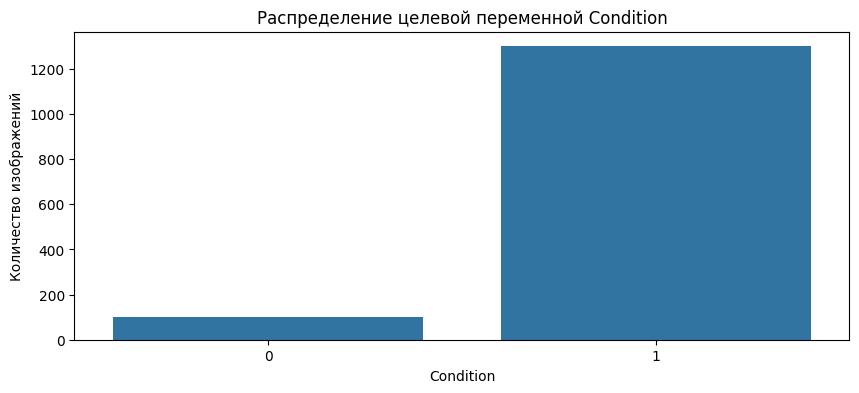

In [16]:
plt.figure(figsize=(10, 4))
sns.countplot(data=train_data, x='Condition')
plt.title('Распределение целевой переменной Condition')
plt.xlabel('Condition')
plt.ylabel('Количество изображений')
plt.show()

Да, видим, что переменная `Condition` принимает все же два значения: `0` и `1`, поэтому задачу на изображениях можно формулировать как задачу бинарной классификации.

Распределение классов оказалось все же несбалансированным:

- `Condition = 1`: 1300 изображений, около 92.9% выборки
- `Condition = 0`: 99 изображений, около 7.1% выборки

Классы явно представлены в данных неравномерно. Если модель будет всегда предсказывать класс `1`, она уже получит accuracy около 92.9%, но такая модель не будет полезной, потому что она не научится различать оба состояния автомобиля.

Поэтому в дальнейшем accuracy нельзя нам будет использовать как единственную метрику качества. Для оценки моделей дополнительно будем использовать precision, recall, F1-score, ROC-AUC и confusion matrix. Особенно важно будет анализировать качество по классу `Condition = 0`

Также не забудем, при разбиении данных на train/validation/test нужно использовать стратификацию по `Condition`, чтобы доли классов в подвыборках оставались похожими на исходное распределение

#### Визуальная проверка классов

Теперь проверим, что именно означают значения `Condition = 0` и `Condition = 1` на изображениях. Откроем несколько изображений из каждого класса и визуально проверим, отличаются ли они по наличию повреждений

Посмотрим на первое изображение датасета

In [17]:
example_image = plt.imread(DATA_DIR / 'trainImages' / train_data.iloc[0, 0])

In [18]:
example_image.shape

(418, 630, 3)

In [19]:
example_image.dtype

dtype('uint8')

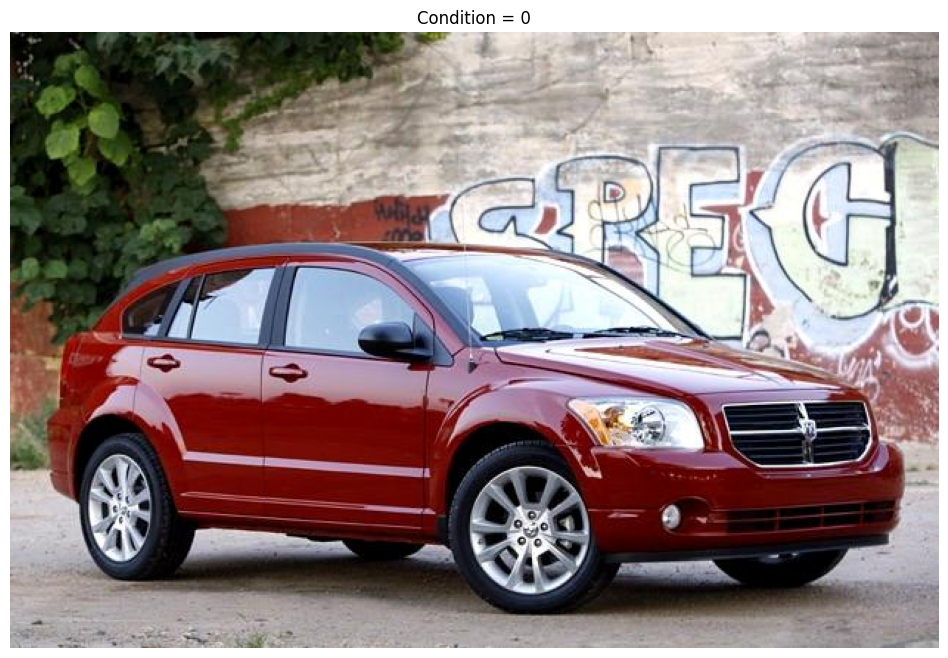

In [20]:
plt.figure(figsize=(12, 8))
plt.imshow(example_image)
plt.title(f'Condition = {train_data.iloc[0, -2]}')
plt.axis('off')
plt.show()

Да, видно, что нет каких-то повреждений

Напишем функцию для вывода примеров

In [21]:
def show_images_by_condition(data, condition_value, n_images=6, random_state=random_state):
    sample_cond = data[data['Condition'] == condition_value].sample(n_images, random_state=random_state)
    image_paths = sample_cond['Image_path'].tolist()
    plt.figure(figsize=(12, 8))
    for i in range(len(image_paths)):
        image = plt.imread(DATA_DIR / 'trainImages' / image_paths[i])
        plt.subplot(2, 3, i+1)
        plt.imshow(image)
        plt.title(f'{image_paths[i]}.Condition = {condition_value}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

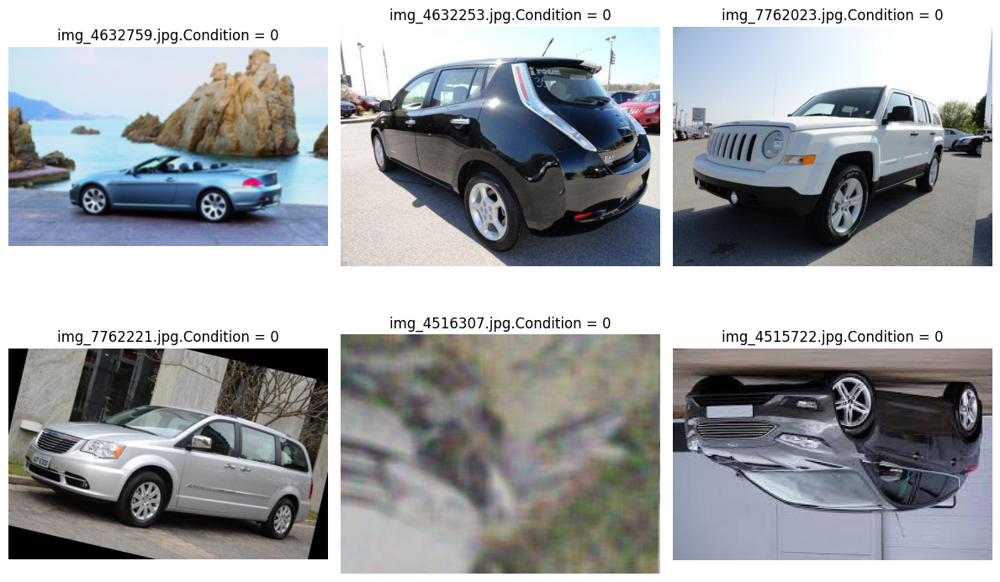

In [22]:
show_images_by_condition(train_data, condition_value=0, n_images=6)

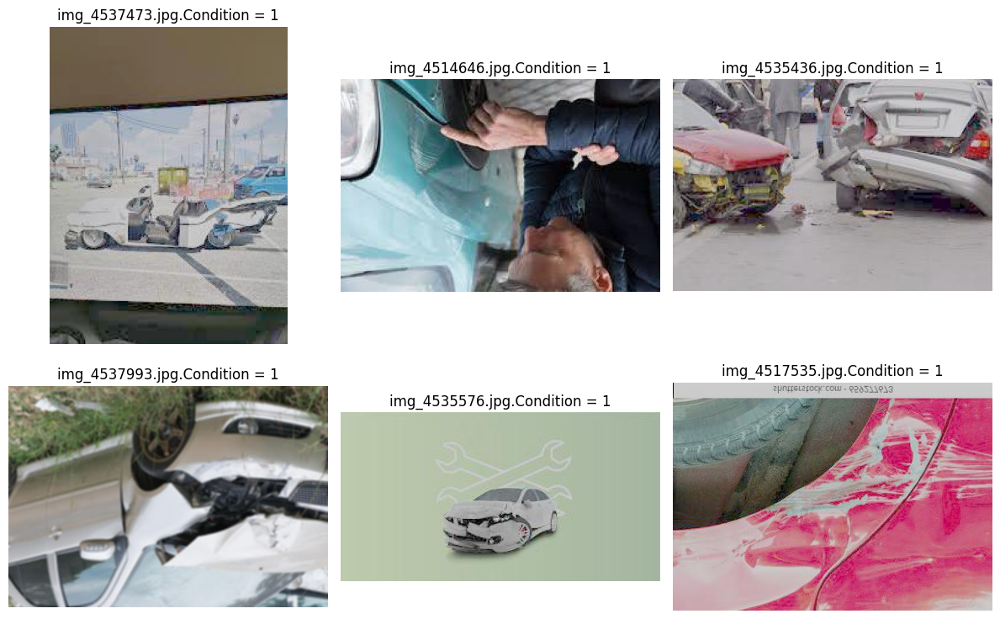

In [23]:
show_images_by_condition(train_data, condition_value=1, n_images=6)

Видно, что переменная `Condition` связана с наличием повреждений автомобиля.

Для класса `Condition = 0` в выборке в основном представлены автомобили без заметных повреждений. Для класса `Condition = 1` в большинстве примеров видны повреждения автомобиля, по типу деформация кузова, следы аварии, вмятины или другие визуальные признаки страхового случая.

Переменную `Condition` можно использовать как целевую переменную для наших задач.

При этом мы видим некоторые проблемы качества данных:
- часть изображений имеет нестандартную ориентацию
- некоторые изображения размыты или плохо различимы
- фотографии отличаются по масштабу, ракурсу, освещению и фону

Эти особенности важно учитывать при дальнейшем обучении модели

#### Проверка изображений

Нам необходимо убедиться, что все изображения из столбца `Image_path` действительно существуют в папке `trainImages`. Это важно, потому что при обучении модели `Dataset` будет по каждой строке таблицы открывать соответствующее изображение. Если хотя бы часть файлов отсутствует или указана неверно, обучение прервется с ошибкой

In [24]:
image_data = train_data[['Image_path', 'Condition']].copy()
image_data.head()

,Image_path,Condition
0,img_4513976.jpg,0
1,img_7764995.jpg,1
2,img_451308.jpg,0
3,img_7768372.jpg,1
4,img_7765274.jpg,1


In [25]:
image_data['full_image_path'] = image_data['Image_path'].apply(lambda x: DATA_DIR / 'trainImages' / x)
image_data.head()

,Image_path,Condition,full_image_path
0,img_4513976.jpg,0,/content/data/Fast_Furious_Insured/trainImages...
1,img_7764995.jpg,1,/content/data/Fast_Furious_Insured/trainImages...
2,img_451308.jpg,0,/content/data/Fast_Furious_Insured/trainImages...
3,img_7768372.jpg,1,/content/data/Fast_Furious_Insured/trainImages...
4,img_7765274.jpg,1,/content/data/Fast_Furious_Insured/trainImages...


In [26]:
image_data['file_exists'] = image_data['full_image_path'].apply(lambda x: x.exists())
image_data['file_exists'].value_counts()

,count
file_exists,
True,1399


Все изображения, указанные в столбце `Image_path`, найдены в папке `trainImages`. Значит, таблица с разметкой корректно связана с файлами изображений, и можно переходить к проверке размеров и форматов изображений

Перед обучением CNN необходимо проверить размеры изображений. В датасете изображения могут иметь разную ширину и высоту, но нейронная сеть обычно получает батчи тензоров одинакового размера Поэтому перед подачей в модель изображения будут приводиться к единому размеру. Однако сначала нужно посмотреть исходное распределение размеров, чтобы понимать, насколько изображения отличаются между собой

Посмотрим на второе изображение

In [27]:
image2 = plt.imread(image_data.loc[0, 'full_image_path'])

In [28]:
image2.shape

(418, 630, 3)

In [29]:
image2.dtype

dtype('uint8')

Как и ожидалось, у нас изображение цветное, получили формат `(height, width, 3)`, где:
- `height` - высота изображения
- `width` - ширина изображения
- `3` - количество цветовых каналов RGB

`dtype` нам показал тип данных пикселей `uint8`, где значения пикселей находятся в диапазоне от 0 до 255

Пройдемся по всем изображениям и сохраним их размеры в список

In [30]:
image_shapes = []
for path in image_data['full_image_path']:
    image = plt.imread(path)
    image_shapes.append(image.shape)

In [31]:
image_shapes[:5]

[(418, 630, 3), (183, 276, 3), (563, 750, 3), (682, 1024, 3), (381, 678, 3)]

In [32]:
image_size_data = pd.DataFrame(image_shapes, columns=['height', 'width', 'channels'])
image_size_data.head()

,height,width,channels
0,418,630,3
1,183,276,3
2,563,750,3
3,682,1024,3
4,381,678,3


In [33]:
image_size_data.describe()

,height,width,channels
count,1399.000000,1399.000000,1399.0
mean,396.537527,599.487491,3.0
std,381.151273,529.688154,0.0
min,69.000000,92.000000,3.0
25%,183.000000,275.000000,3.0
50%,200.000000,311.000000,3.0
75%,510.000000,800.000000,3.0
max,4032.000000,4500.000000,3.0


In [34]:
image_size_data['channels'].value_counts()

,count
channels,
3,1399


Все изображения имеют 3 канала, значит датасет полностью RGB

построим графики распределения ширины и высоты

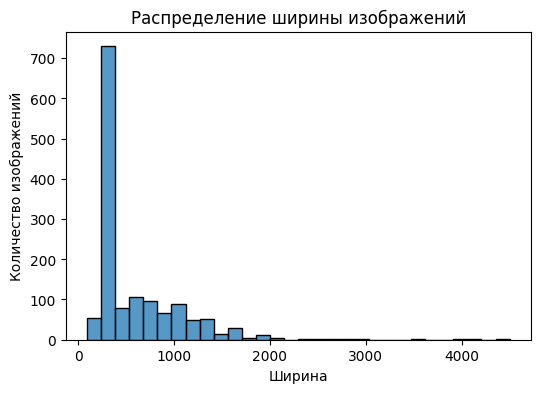

In [35]:
plt.figure(figsize=(6, 4))
sns.histplot(image_size_data['width'], bins=30)
plt.title('Распределение ширины изображений')
plt.xlabel('Ширина')
plt.ylabel('Количество изображений')
plt.show()

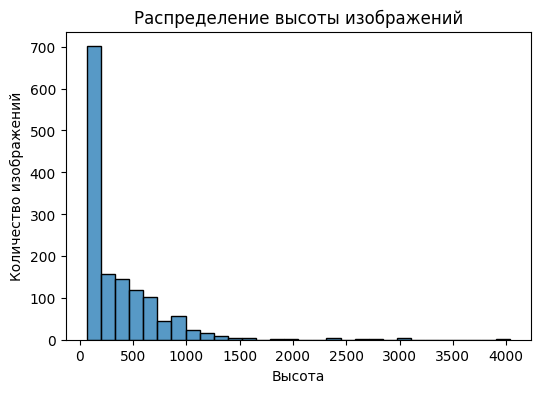

In [36]:
plt.figure(figsize=(6, 4))
sns.histplot(image_size_data['height'], bins=30)
plt.title('Распределение высоты изображений')
plt.xlabel('Высота')
plt.ylabel('Количество изображений')
plt.show()

Размеры файлов сильно различаются. Большая часть изображений имеет относительно небольшой размер, но также присутствуют изображения с очень большой шириной или высотой. Перед обучением CNN изображения нам необходимо привести к единому размеру

Дополнительно посмотрим не только на ширину и высоту изображений, но и на их пропорции.
Для CNN это важно, потому что при обычном Resize((224, 224)) изображение принудительно сжимается в квадрат. Если исходная фотография была сильно горизонтальной или вертикальной, такое преобразование может исказить форму автомобиля и визуальные признаки повреждений.

Посчитаем:
- aspect_ratio - отношение ширины к высоте
- image_area - площадь изображения в пикселях
- orientation - ориентация изображения, горизонтальная, вертикальная или почти квадратная

In [37]:
image_eda_data = image_data.copy()

In [38]:
image_eda_data['height'] = image_size_data['height'].values
image_eda_data['width'] = image_size_data['width'].values
image_eda_data['channels'] = image_size_data['channels'].values

In [39]:
image_eda_data['aspect_ratio'] = image_eda_data['width'] / image_eda_data['height']
image_eda_data['image_area'] = image_eda_data['width'] * image_eda_data['height']

In [40]:
def get_orientation(aspect_ratio):
    if aspect_ratio > 1.15:
        return 'horizontal'
    elif aspect_ratio < 0.85:
        return 'vertical'
    else:
        return 'near_square'

In [41]:
image_eda_data['orientation'] = image_eda_data['aspect_ratio'].apply(get_orientation)

In [42]:
image_eda_data.head()

,Image_path,Condition,full_image_path,file_exists,height,width,channels,aspect_ratio,image_area,orientation
0,img_4513976.jpg,0,/content/data/Fast_Furious_Insured/trainImages...,True,418,630,3,1.507177,263340,horizontal
1,img_7764995.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,183,276,3,1.508197,50508,horizontal
2,img_451308.jpg,0,/content/data/Fast_Furious_Insured/trainImages...,True,563,750,3,1.332149,422250,horizontal
3,img_7768372.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,682,1024,3,1.501466,698368,horizontal
4,img_7765274.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,381,678,3,1.779528,258318,horizontal


In [43]:
image_eda_data[['height', 'width', 'aspect_ratio', 'image_area']].describe()

,height,width,aspect_ratio,image_area
count,1399.000000,1399.000000,1399.000000,1.399000e+03
mean,396.537527,599.487491,1.568142,4.289272e+05
std,381.151273,529.688154,0.362607,1.194865e+06
min,69.000000,92.000000,0.560000,6.348000e+03
25%,183.000000,275.000000,1.364583,5.032500e+04
50%,200.000000,311.000000,1.502732,5.055000e+04
75%,510.000000,800.000000,1.714286,4.156000e+05
max,4032.000000,4500.000000,3.379538,1.350000e+07


In [44]:
image_eda_data['orientation'].value_counts()

,count
orientation,
horizontal,1317
near_square,55
vertical,27


In [45]:
image_eda_data['orientation'].value_counts(normalize=True)

,proportion
orientation,
horizontal,0.941387
near_square,0.039314
vertical,0.019299


Видно, что в датасете почти все изображения имеют горизонтальную ориентацию. Всего горизонтальных изображений 1317 из 1399, то есть около 94% выборки. Это ожидаемо для фотографий автомобилей, потому что машину чаще снимают сбоку или спереди в горизонтальном формате

Построим распределение ориентации изображений, насколько часто в данных встречаются фотографии нестандартного формата

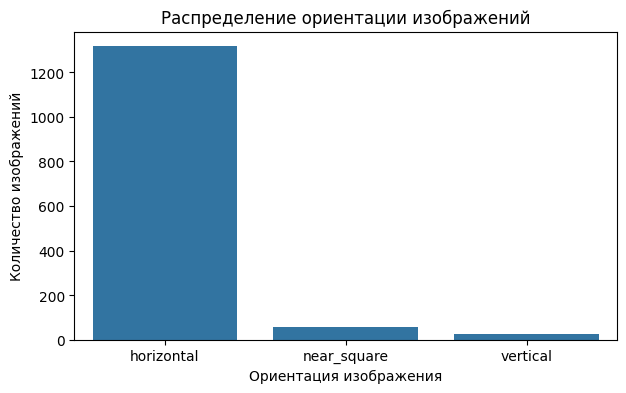

In [46]:
plt.figure(figsize=(7, 4))
sns.countplot(data=image_eda_data, x='orientation')
plt.title('Распределение ориентации изображений')
plt.xlabel('Ориентация изображения')
plt.ylabel('Количество изображений')
plt.show()

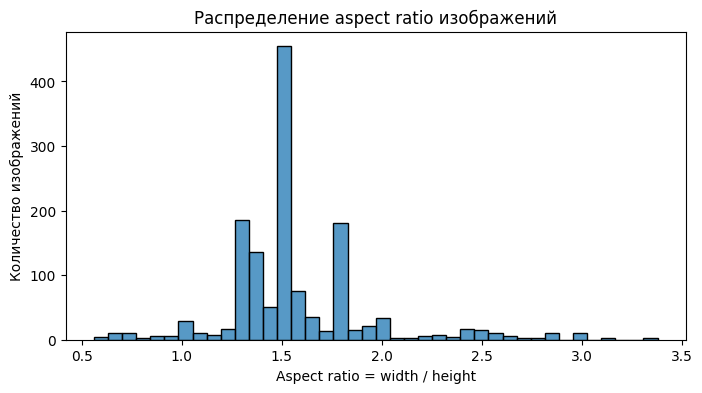

In [47]:
plt.figure(figsize=(8, 4))
sns.histplot(data=image_eda_data, x='aspect_ratio', bins=40)
plt.title('Распределение aspect ratio изображений')
plt.xlabel('Aspect ratio = width / height')
plt.ylabel('Количество изображений')
plt.show()

Теперь посмотрим, отличается ли распределение пропорций между классами.
Если один класс чаще представлен нестандартными фото, модель может частично учиться не на повреждениях, а на технических особенностях изображения

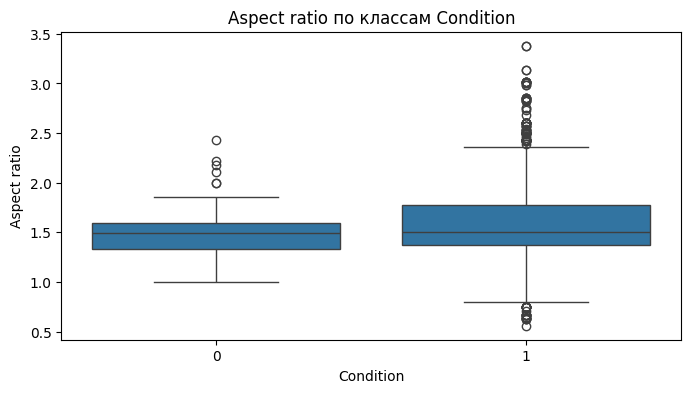

In [48]:
plt.figure(figsize=(8, 4))
sns.boxplot(data=image_eda_data, x='Condition', y='aspect_ratio')
plt.title('Aspect ratio по классам Condition')
plt.xlabel('Condition')
plt.ylabel('Aspect ratio')
plt.show()

Распределение aspect ratio показывает, что большинство изображений сосредоточено около значений 1.4-1.7. Медианное значение aspect ratio равно примерно 1.5, то есть типичное изображение шире, чем выше. Но мы видим что в данных есть заметные выбросы. Такие изображения сильно отличаются от стандартного формата и при обычном Resize((224, 224)) могут заметно искажаться

Также заметим, Condition = 1 разброс aspect ratio больше, чем у Condition = 0. Особенно видно большее количество выбросов у поврежденных автомобилей, встречаются как слишком широкие, так и относительно вертикальные изображения. Для дальнейшего обучения это важно, потому что модель может получать изображения с разной геометрией объекта, разным масштабом автомобиля и разным положением повреждений в кадре

In [49]:
orientation_by_condition = pd.crosstab(image_eda_data['Condition'], image_eda_data['orientation'], normalize='index')
orientation_by_condition

orientation,horizontal,near_square,vertical
Condition,,,
0,0.979798,0.020202,0.000000
1,0.938462,0.040769,0.020769


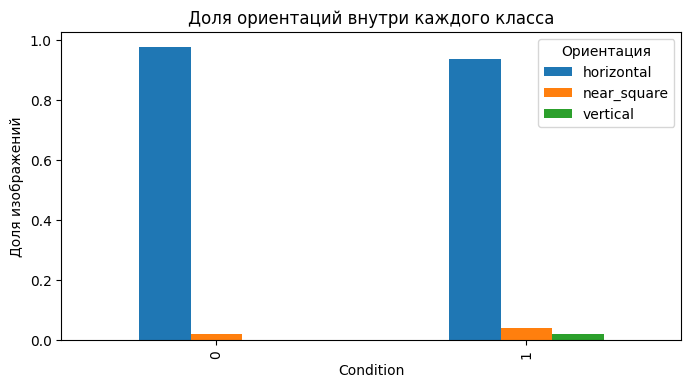

In [50]:
orientation_by_condition.plot(kind='bar', figsize=(8, 4))
plt.title('Доля ориентаций внутри каждого класса')
plt.xlabel('Condition')
plt.ylabel('Доля изображений')
plt.legend(title='Ориентация')
plt.show()

Распределение ориентаций по классам в целом похоже. Ориентация сама по себе, скорее всего, не является сильным признаком класса и не должна создавать явную утечку в модель. При этом у класса Condition = 1 немного больше нестандартных изображений, есть как near_square, так и vertical форматы. Это может быть связано с тем, что поврежденные автомобили чаще фотографируют крупным планом, с необычного ракурса или в условиях аварии

Обычный Resize до 224 на 224 подходит как базовый вариант, но он может искажать изображения с нестандартными пропорциями. Поэтому для следующих экспериментов имеет смысл добавить альтернативную предобработку Resize с сохранением пропорций и padding. Такой подход позволит проверить, улучшится ли качество модели за счет сохранения геометрии автомобиля и повреждений

#### Примеры изображений с нестандартными пропорциями

Посмотрим на изображения с самыми нестандартными пропорциями. Нам лучше проверить, являются ли такие наблюдения реальными фотографиями автомобилей или потенциально проблемными объектами для обучения

In [51]:
def show_image_examples(data, n_images=6):
    sample_data = data.head(n_images)
    image_paths = sample_data['Image_path'].tolist()
    plt.figure(figsize=(12, 8))
    for i in range(len(image_paths)):
        row = sample_data.iloc[i]
        image = plt.imread(DATA_DIR / 'trainImages' / image_paths[i])
        plt.subplot(2, 3, i+1)
        plt.imshow(image)
        plt.title(f"{row['Image_path']}\n"
            f"Condition={row['Condition']}, ratio={row['aspect_ratio']:.2f}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

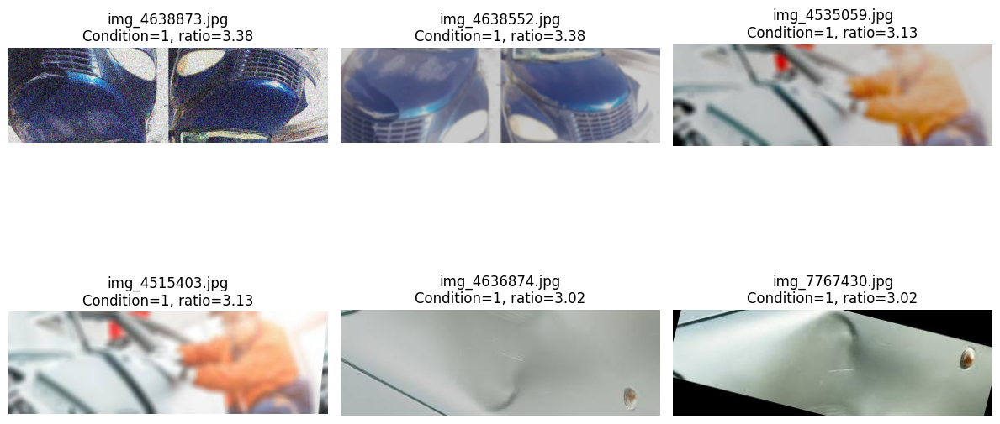

In [52]:
wide_images = image_eda_data.sort_values('aspect_ratio', ascending=False)
show_image_examples(wide_images, n_images=6)

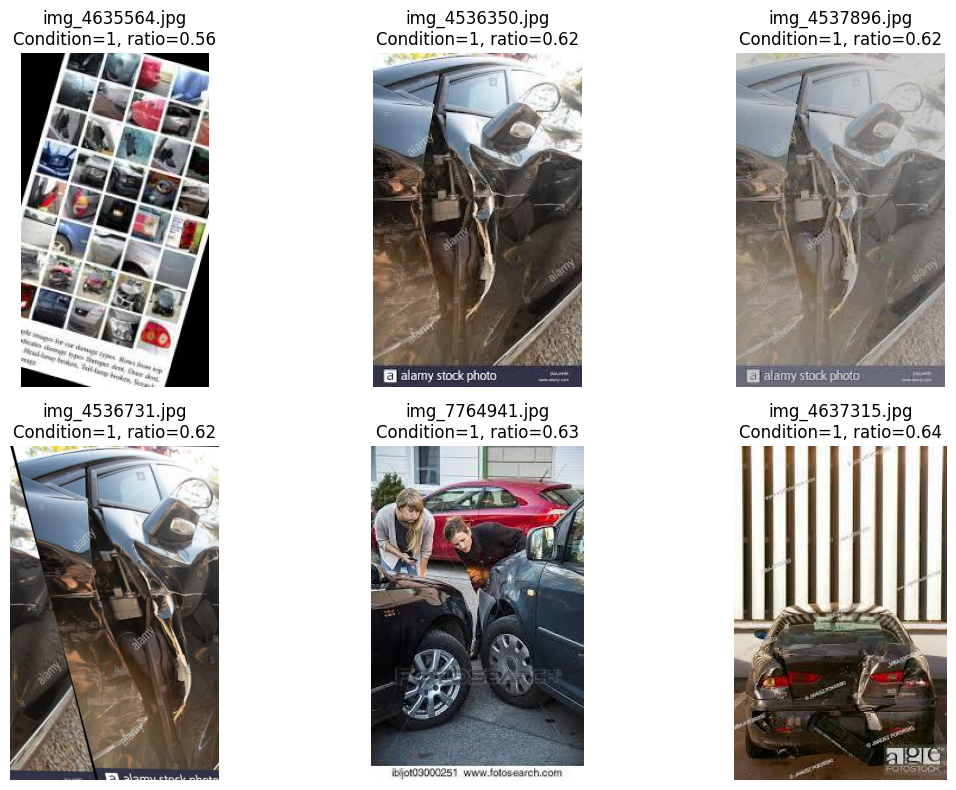

In [53]:
tall_images = image_eda_data.sort_values('aspect_ratio', ascending=True)
show_image_examples(tall_images, n_images=6)

Видим по фоткам, что да, выбросы по aspect ratio действительно связаны с нетипичным форматом фотографий. Среди самых широких изображений встречаются сильно обрезанные фрагменты автомобиля, крупные планы деталей, размытые фото, а также изображения, где автомобиль занимает не весь кадр. Среди самых вертикальных изображений встречаются фото аварий с необычного ракурса, изображения со стоковыми водяными знаками, а также коллаж или скриншот с несколькими маленькими фотографиями автомобилей внутри одного изображения.

Формально такие изображения относятся к классу Condition = 1, но визуально они отличаются от обычной фотографии автомобиля. Модель может учиться еще и по побочным паттернам. Такие признаки могут ухудшать обобщающую способность модели на новых фотографиях

#### Анализ качества изображений (размытие, яркость, контраст)

Теперь добавим более продвинутый анализ качества изображений. Для модели важно допом визуальное качество, а именно например азмытость, яркость, контрастность и цветность.

Посчитаем несколько простых признаков:
- brightness - средняя яркость изображения
- contrast - стандартное отклонение яркости
- blur_score - оценка резкости через дисперсию лапласиана
- colorfulness - грубая оценка насыщенности цветовой информации

Чем ниже blur_score, тем более размытым считается изображение. Если в данных много размытых или темных фото, это может ухудшать качество модели, особенно на редком классе

In [54]:
def get_image_quality_features(image_path):
    image = Image.open(image_path)
    image = ImageOps.exif_transpose(image)
    image = image.convert('RGB')
    image_np = np.array(image)
    gray_image = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    brightness = gray_image.mean()
    contrast = gray_image.std()
    blur_score = cv2.Laplacian(gray_image, cv2.CV_64F).var()
    red_channel = image_np[:, :, 0].astype(float)
    green_channel = image_np[:, :, 1].astype(float)
    blue_channel = image_np[:, :, 2].astype(float)
    rg = red_channel-green_channel
    yb = 0.5*(red_channel+green_channel)-blue_channel
    colorfulness = np.sqrt(rg.std()**2+yb.std()**2)+0.3*np.sqrt(rg.mean()**2+yb.mean()**2)
    return {'brightness': brightness, 'contrast': contrast, 'blur_score': blur_score, 'colorfulness': colorfulness}

In [55]:
quality_features = []

In [56]:
for image_path in tqdm(image_eda_data['full_image_path']):
    quality_features.append(get_image_quality_features(image_path))

100%|██████████| 1399/1399 [00:24<00:00, 57.16it/s]


In [57]:
quality_data = pd.DataFrame(quality_features)
quality_data.head()

,brightness,contrast,blur_score,colorfulness
0,125.216754,78.065714,1656.370455,46.077429
1,145.680486,65.410026,82.206624,12.962519
2,115.259074,60.638926,16.467838,36.708493
3,100.824326,64.587314,445.273710,25.311525
4,135.000736,35.841195,249.831100,13.235529


In [58]:
image_eda_data = pd.concat([image_eda_data.reset_index(drop=True), quality_data.reset_index(drop=True)], axis=1)
image_eda_data.head()

,Image_path,Condition,full_image_path,file_exists,height,width,channels,aspect_ratio,image_area,orientation,brightness,contrast,blur_score,colorfulness
0,img_4513976.jpg,0,/content/data/Fast_Furious_Insured/trainImages...,True,418,630,3,1.507177,263340,horizontal,125.216754,78.065714,1656.370455,46.077429
1,img_7764995.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,183,276,3,1.508197,50508,horizontal,145.680486,65.410026,82.206624,12.962519
2,img_451308.jpg,0,/content/data/Fast_Furious_Insured/trainImages...,True,563,750,3,1.332149,422250,horizontal,115.259074,60.638926,16.467838,36.708493
3,img_7768372.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,682,1024,3,1.501466,698368,horizontal,100.824326,64.587314,445.273710,25.311525
4,img_7765274.jpg,1,/content/data/Fast_Furious_Insured/trainImages...,True,381,678,3,1.779528,258318,horizontal,135.000736,35.841195,249.831100,13.235529


In [59]:
image_eda_data[['brightness', 'contrast', 'blur_score', 'colorfulness']].describe()

,brightness,contrast,blur_score,colorfulness
count,1399.000000,1399.000000,1399.000000,1399.000000
mean,121.376994,60.719117,2136.307832,31.601443
std,29.571083,15.628506,5081.338598,20.746139
min,29.396411,15.383804,2.804591,0.000000
25%,102.659424,49.945988,140.639215,17.442918
50%,120.833383,62.675600,766.504337,27.063165
75%,139.097176,72.158974,1996.231720,40.419509
max,222.580694,110.137569,42706.696312,164.771036


Сравним признаки качества между классами. Посмотрим, не отличается ли техническое качество изображений у поврежденных и неповрежденных автомобилей

In [60]:
image_eda_data.groupby('Condition')[['brightness', 'contrast', 'blur_score', 'colorfulness']].agg(['mean', 'median', 'std'])

brightness                          contrast                       \
                 mean      median        std       mean     median       std   
Condition                                                                      
0          120.296075  123.305656  27.425339  61.365985  60.663753  15.97913   
1          121.459310  120.533442  29.736390  60.669856  62.723885  15.60666   

            blur_score                          colorfulness             \
                  mean      median          std         mean     median   
Condition                                                                 
0          1897.203882  589.611043  5459.114815    33.435441  29.154699   
1          2154.516518  798.389619  5053.195257    31.461777  27.027935   

                      
                 std  
Condition             
0          25.598528  
1          20.334503

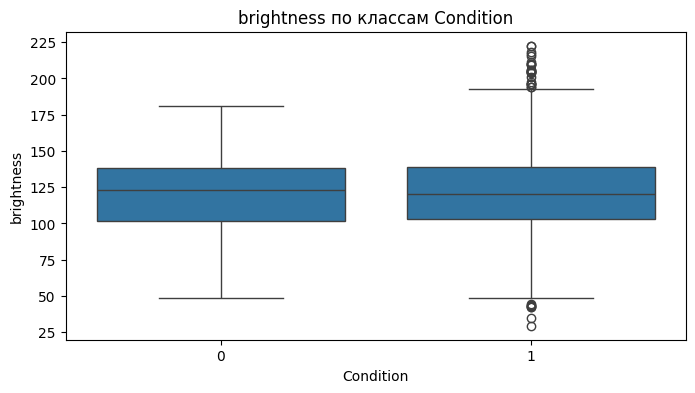

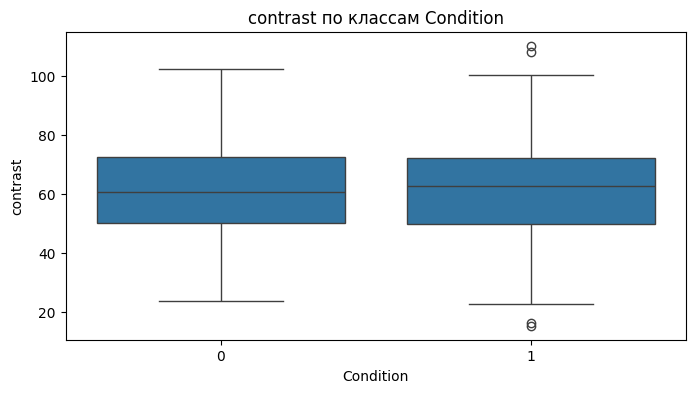

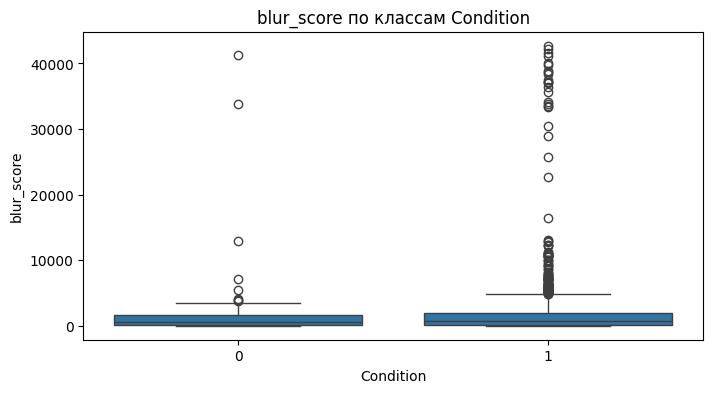

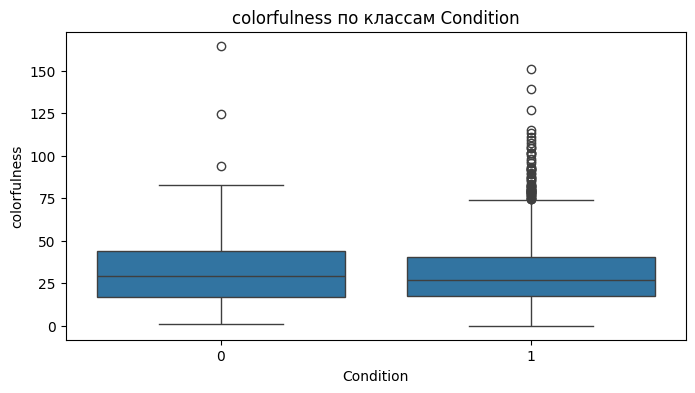

In [61]:
quality_columns = ['brightness', 'contrast', 'blur_score', 'colorfulness']
for column in quality_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=image_eda_data, x='Condition', y=column)
    plt.title(f'{column} по классам Condition')
    plt.xlabel('Condition')
    plt.ylabel(column)
    plt.show()

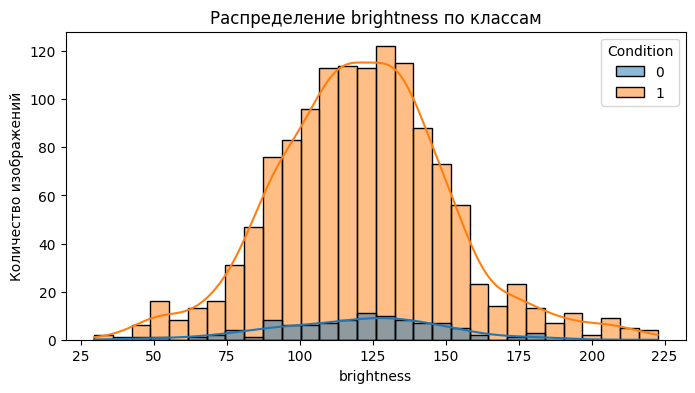

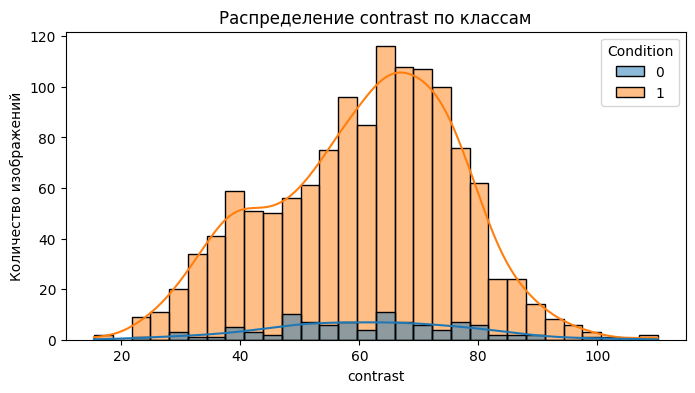

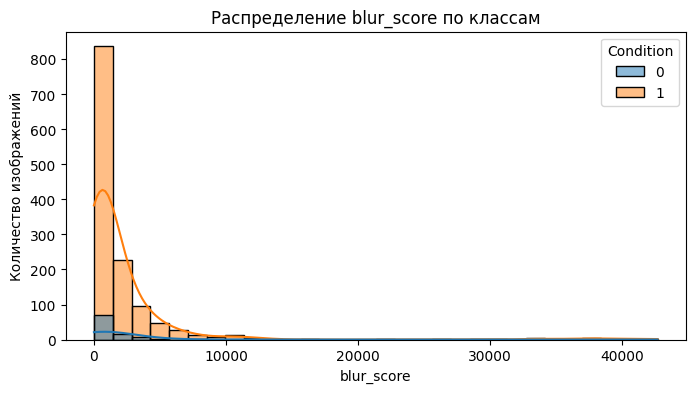

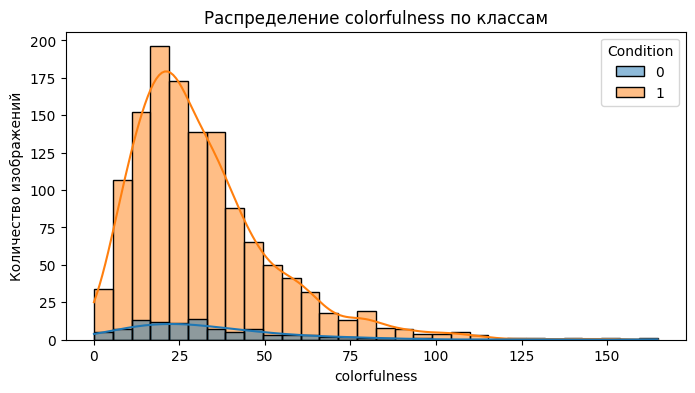

In [62]:
for column in quality_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=image_eda_data, x=column, hue='Condition', bins=30, kde=True)
    plt.title(f'Распределение {column} по классам')
    plt.xlabel(column)
    plt.ylabel('Количество изображений')
    plt.show()

По яркости и контрастности классы в целом похожи. Классы не разделяются очевидно по общей яркости изображения. По контрастности ситуация похожая.

При этом по графикам видно, что у класса Condition = 1 больше выбросов все также. В поврежденном классе встречаются очень светлые, очень темные, очень контрастные и очень резкие изображения. Это согласуется с предыдущим анализом нестандартных пропорций.

Особенно важен показатель blur_score. Его распределение сильно скошено вправо, у большинства изображений blur_score относительно небольшой, но есть отдельные изображения с очень высокими значениями. В поврежденном классе также чаще встречаются более резкие крупные планы деталей или повреждений. Показатель colorfulness также в среднем близок между классами

#### Выделение потенциально проблемных изображений

На предыдущем шаге мы посчитали признаки качества изображений. Теперь на их основе выделим потенциально проблемные изображения

Создадим несколько флагов качества изображения. Пороговые значения возьмем через квантили внутри датасета

In [63]:
blur_threshold = image_eda_data['blur_score'].quantile(0.1)
dark_threshold = image_eda_data['brightness'].quantile(0.1)
low_contrast_threshold = image_eda_data['contrast'].quantile(0.1)
small_area_threshold = image_eda_data['image_area'].quantile(0.1)
blur_threshold, dark_threshold, low_contrast_threshold, small_area_threshold

(np.float64(14.561352513781053),
 np.float64(86.12270161533817),
 np.float64(38.22756003081627),
 np.float64(50246.0))

In [64]:
image_eda_data['is_blurry'] = image_eda_data['blur_score']<=blur_threshold
image_eda_data['is_dark'] = image_eda_data['brightness']<=dark_threshold
image_eda_data['is_low_contrast'] = image_eda_data['contrast']<=low_contrast_threshold
image_eda_data['is_small_image'] = image_eda_data['image_area']<=small_area_threshold

In [65]:
image_eda_data['is_unusual_ratio'] = (image_eda_data['aspect_ratio'] < 0.60) | (image_eda_data['aspect_ratio'] > 2.50)

In [66]:
image_eda_data['problem_flags_count'] = image_eda_data[['is_blurry', 'is_dark', 'is_low_contrast', 'is_small_image', 'is_unusual_ratio']].sum(axis=1)

In [67]:
image_eda_data[['is_blurry', 'is_dark', 'is_low_contrast', 'is_small_image', 'is_unusual_ratio', 'problem_flags_count']].head()

,is_blurry,is_dark,is_low_contrast,is_small_image,is_unusual_ratio,problem_flags_count
0,False,False,False,False,False,0
1,False,False,False,False,False,0
2,False,False,False,False,False,0
3,False,False,False,False,False,0
4,False,False,True,False,False,1


In [68]:
image_eda_data[['is_blurry', 'is_dark', 'is_low_contrast', 'is_small_image', 'is_unusual_ratio']].mean().sort_values(ascending=False)

,0
is_small_image,0.118656
is_low_contrast,0.100786
is_blurry,0.100071
is_dark,0.100071
is_unusual_ratio,0.035025


In [69]:
problem_summary_by_condition = image_eda_data.groupby('Condition')[['is_blurry', 'is_dark', 'is_low_contrast', 'is_small_image', 'is_unusual_ratio']].mean()
problem_summary_by_condition

,is_blurry,is_dark,is_low_contrast,is_small_image,is_unusual_ratio
Condition,,,,,
0,0.111111,0.10101,0.060606,0.10101,0.000000
1,0.099231,0.10000,0.103846,0.12000,0.037692


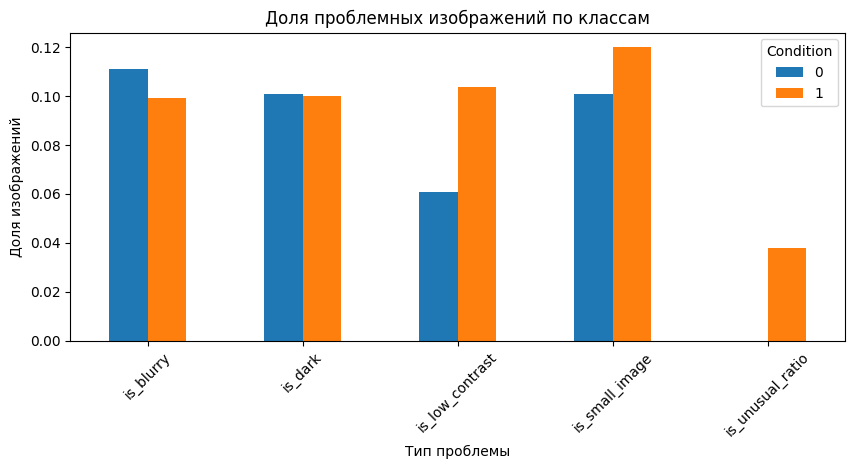

In [70]:
problem_summary_by_condition.T.plot(kind='bar', figsize=(10, 4))
plt.title('Доля проблемных изображений по классам')
plt.xlabel('Тип проблемы')
plt.ylabel('Доля изображений')
plt.legend(title='Condition')
plt.xticks(rotation=45)
plt.show()

Мы видим, что в датасете есть несколько типов потенциально сложных наблюдений. Чаще всего встречаются маленькие изображения. Изображения с необычными пропорциями встречаются реже. Если сравнивать классы, то доля размытых и темных изображений примерно одинаковая.
Более заметные различия видны для низкоконтрастных, маленьких и нестандартных по пропорциям изображений. В классе Condition = 1 доля таких фоток выше. Кстати изображения с необычными пропорциями встречаются только в классе Condition = 1, около 3.8% поврежденных изображений и 0% в классе Condition = 0. Это согласуется с нашим визуальным анализом.

Качество изображений в датасете неоднородное. Проблемные изображения не нужно автоматически удалять, потому что они отражают реальные условия пользовательских фото. Но их нужно учитывать при обучении и интерпретации моделей

#### Визуальная проверка проблемных изображений

После того как мы выделили потенциально проблемные изображения с помощью числовых признаков, посмотрим на них визуально

Самые размытые изображения


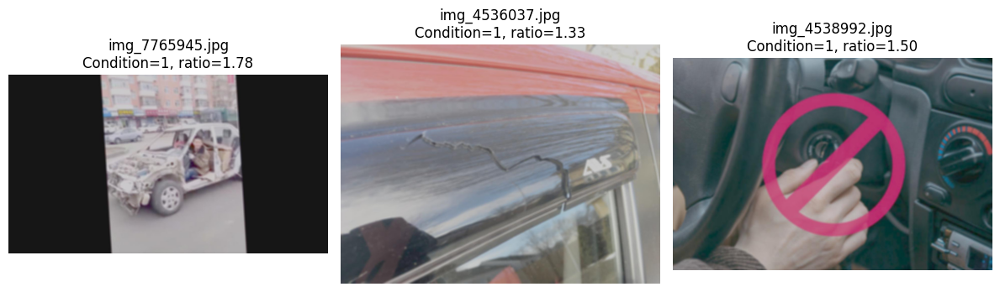

In [71]:
blurry_images = image_eda_data.sort_values('blur_score', ascending=True)
print('Самые размытые изображения')
show_image_examples(blurry_images, n_images=3)

Самые темные изображения


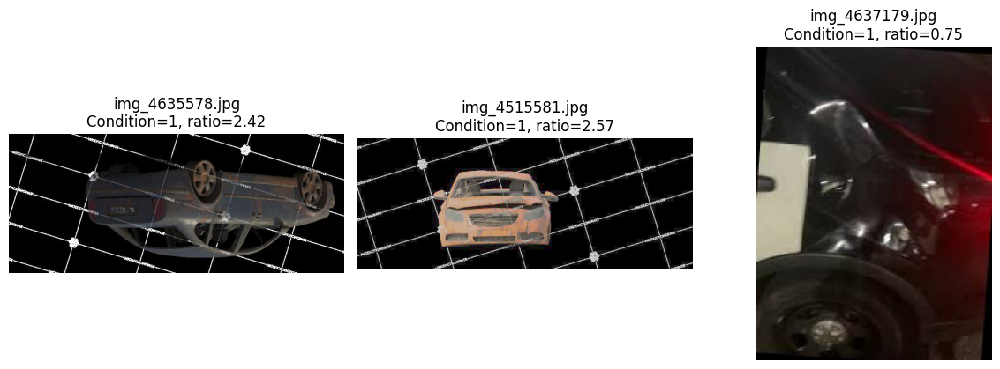

In [72]:
dark_images = image_eda_data.sort_values('brightness', ascending=True)
print('Самые темные изображения')
show_image_examples(dark_images, n_images=3)

Изображения с самым низким контрастом


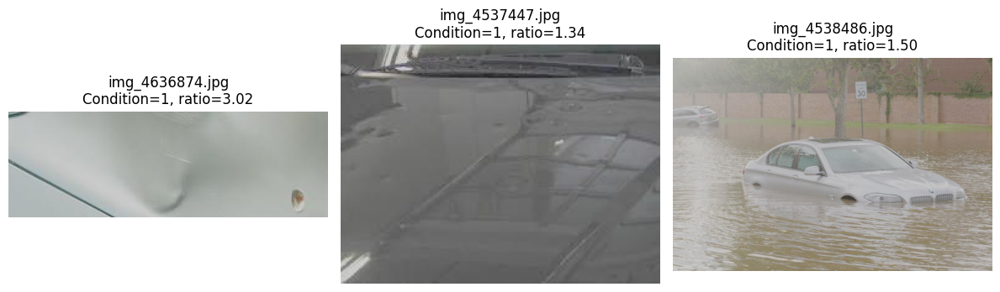

In [73]:
low_contrast_images = image_eda_data.sort_values('contrast', ascending=True)
print('Изображения с самым низким контрастом')
show_image_examples(low_contrast_images, n_images=3)

Самые маленькие изображения


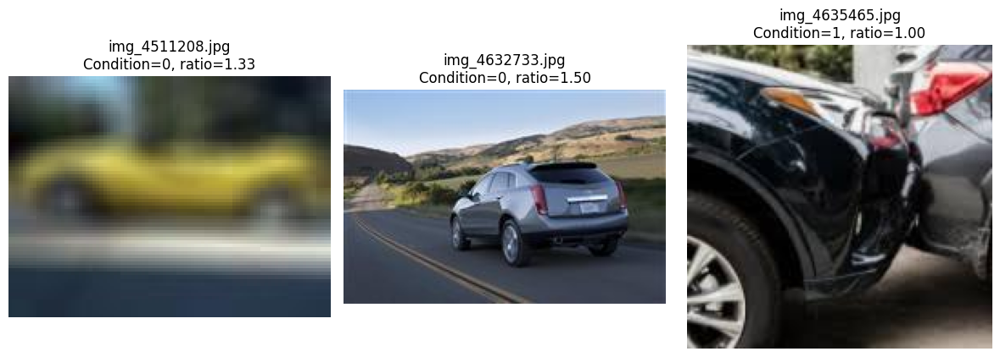

In [74]:
small_images = image_eda_data.sort_values('image_area', ascending=True)
print('Самые маленькие изображения')
show_image_examples(small_images, n_images=3)

Изображения с наибольшим количеством проблемных флагов


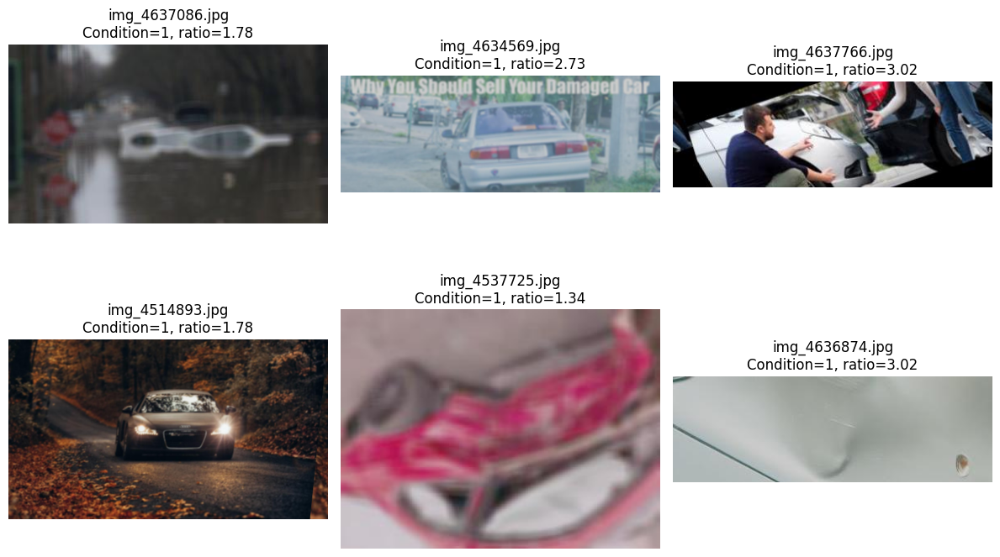

In [75]:
most_problem_images = image_eda_data.sort_values('problem_flags_count', ascending=False)
print('Изображения с наибольшим количеством проблемных флагов')
show_image_examples(most_problem_images, n_images=6)

Потенциально проблемные изображения класса Condition = 0


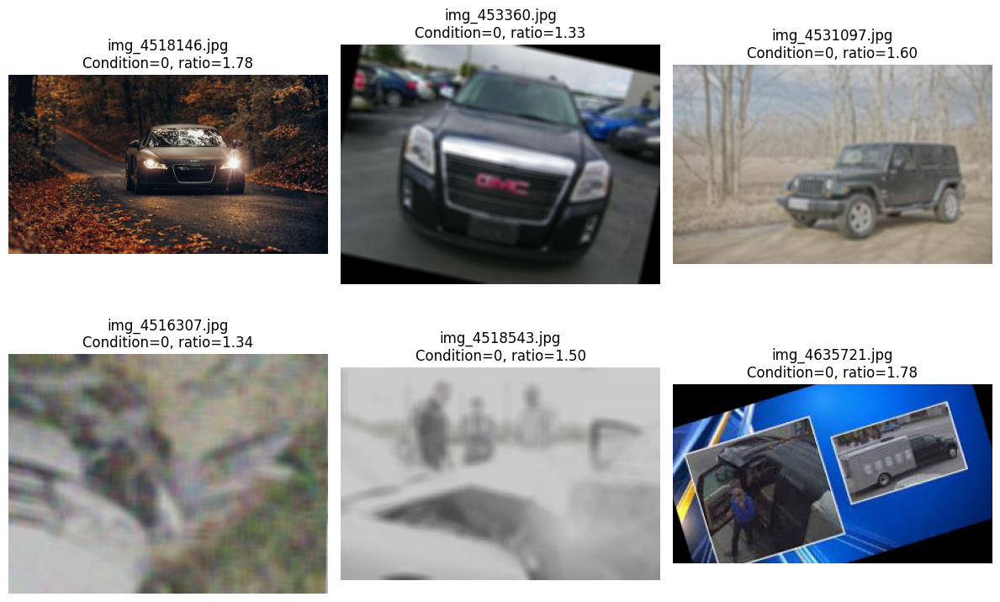

In [76]:
problem_class_0_images = image_eda_data[image_eda_data['Condition'] == 0].sort_values('problem_flags_count', ascending=False)
print('Потенциально проблемные изображения класса Condition = 0')
show_image_examples(problem_class_0_images, n_images=6)

автоматические флаги действительно находят сложные случаи для модели

Наши галереи подтвердили, что проблемные флаги имеют содержательный смысл. Они находят реально сложные изображения. Поэтому дальше при оценке моделей важно смотреть не только общие метрики, но и ошибки на таких сложных случаях

#### Проверка точных дубликатов изображений и риска утечки данных

Дополнительно проверим, есть ли в датасете точные дубликаты изображений. Это важно сделать до разбиения данных на train, validation и test.

Если одно и то же изображение попадет одновременно в train и test, возникнет утечка данных, модель фактически увидит объект на обучении, а затем будет оцениваться на его копии. В таком случае качество на test может быть завышено и не будет честно отражать способность модели обобщаться на новые изображения.

Для проверки точных дубликатов посчитаем hash каждого файла изображения. Если у двух строк одинаковый hash, значит файлы полностью совпадают

In [77]:
def get_file_hash(path):
    with open(path, 'rb') as file:
        return hashlib.md5(file.read()).hexdigest()

In [78]:
image_eda_data['file_hash'] = image_eda_data['full_image_path'].apply(get_file_hash)

In [79]:
duplicate_count = image_eda_data['file_hash'].duplicated().sum()
duplicate_count

np.int64(42)

В таблицу duplicate_images попадают все строки, участвующие в дублировании и исходные изображения, и их копии

In [80]:
duplicate_images = image_eda_data[image_eda_data['file_hash'].duplicated(keep=False)].sort_values('file_hash')
duplicate_images[['Image_path', 'Condition', 'file_hash']]

,Image_path,Condition,file_hash
745,img_7764604.jpg,1,0691e99c70bf917f1821b34d61842539
498,img_4535758.jpg,1,0691e99c70bf917f1821b34d61842539
309,img_7764962.jpg,1,110a90ec0faef7ce56faae181300ed6d
480,img_7767445.jpg,1,110a90ec0faef7ce56faae181300ed6d
959,img_7766536.jpg,1,18cfb972eedffaf51b59d4db8400c232
...,...,...,...
291,img_4638566.jpg,1,e3c8c649e5c51852a353ef3e1069b1a3
1327,img_4517320.jpg,1,f02170eda0a1a5b32b75050dfa5dd6d8
1336,img_7768183.jpg,1,f02170eda0a1a5b32b75050dfa5dd6d8
292,img_4514751.jpg,1,f58f5c2dce634fd7d2bec1b5dec24d50


Проверим на конлфиктующие метки

In [81]:
duplicate_check = duplicate_images.groupby('file_hash').agg(n_images=('Image_path', 'count'), n_labels=('Condition', 'nunique'), labels=('Condition', lambda x: sorted(x.unique().tolist()))).sort_values(['n_labels', 'n_images'], ascending=False)
duplicate_check.head(10)

,n_images,n_labels,labels
file_hash,,,
29ad3e38acf33f751c5822d0aba95113,2,2,"[0, 1]"
1d71c596c3fb8aaebffcbd90dfa353f9,3,1,[1]
38a62df52db67f11853ea551e4659267,3,1,[1]
7d5cfa391338fe24c7c9ad47a149fe7c,3,1,[1]
91cdc29d6976743fb3ea39fc209934f6,3,1,[1]
0691e99c70bf917f1821b34d61842539,2,1,[1]
110a90ec0faef7ce56faae181300ed6d,2,1,[1]
18cfb972eedffaf51b59d4db8400c232,2,1,[1]
1a0e420c309cdbcdee2258cc998d18aa,2,1,[1]


In [82]:
duplicate_check['n_labels'].value_counts()

,count
n_labels,
1,37
2,1


Попались

Визуально конечно же проверим наши группы дубликатов

In [83]:
def show_duplicate_groups(duplicate_images, n_groups=5, max_images_per_group=4):
    duplicate_hashes = duplicate_images['file_hash'].unique()[:n_groups]
    for file_hash in duplicate_hashes:
        group = duplicate_images[duplicate_images['file_hash'] == file_hash].head(max_images_per_group)
        image_paths = group['Image_path'].tolist()
        conditions = group['Condition'].tolist()
        plt.figure(figsize=(4*len(image_paths), 4))
        for i in range(len(image_paths)):
            image = plt.imread(DATA_DIR / 'trainImages' / image_paths[i])
            plt.subplot(1, len(image_paths), i + 1)
            plt.imshow(image)
            plt.title(f"{image_paths[i]}\nCondition={conditions[i]}")
            plt.axis('off')
        plt.suptitle(f'Группа дубликатов: {file_hash[:12]}...')
        plt.tight_layout()
        plt.show()

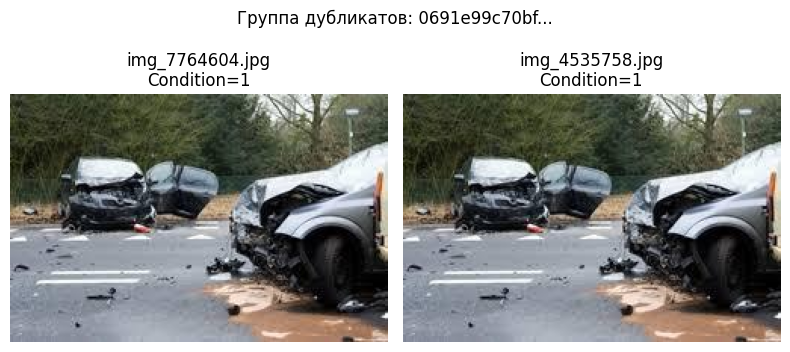

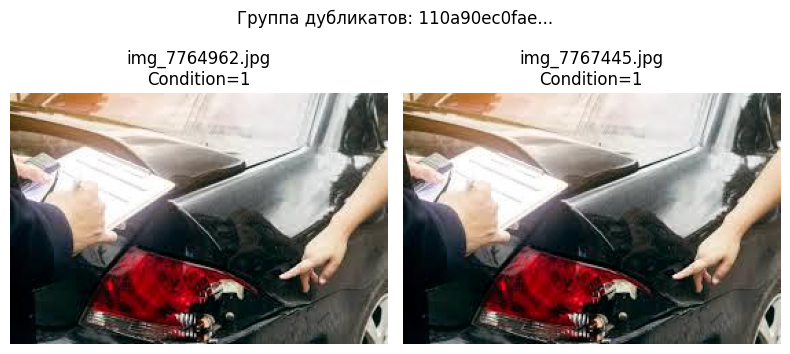

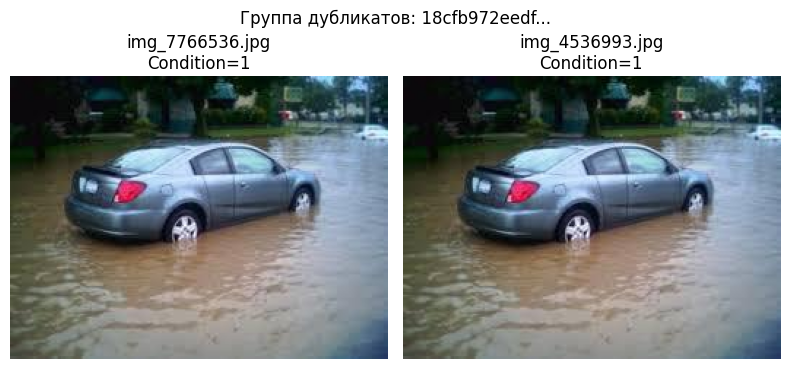

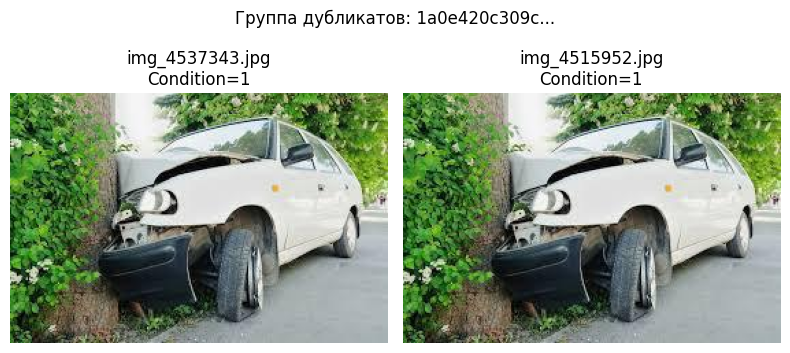

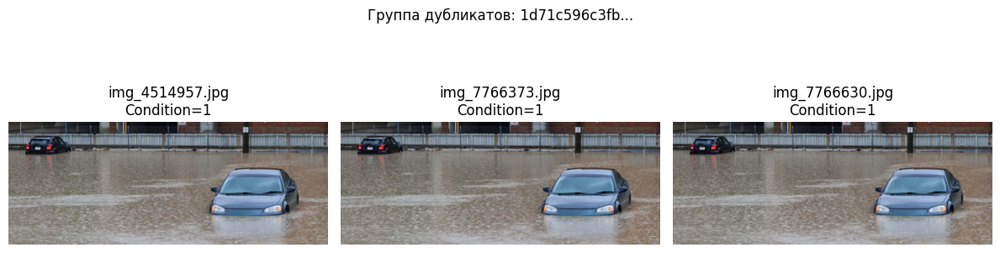

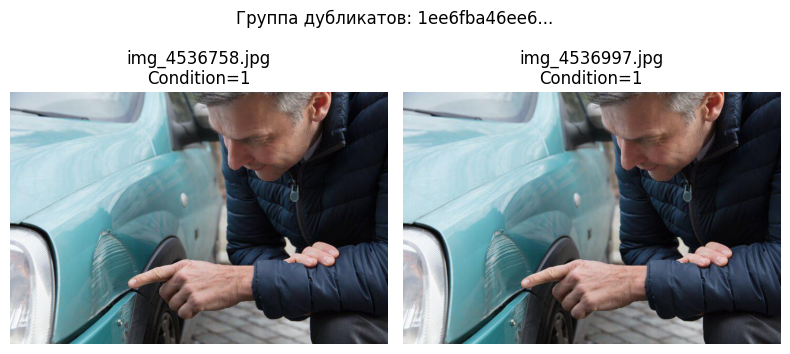

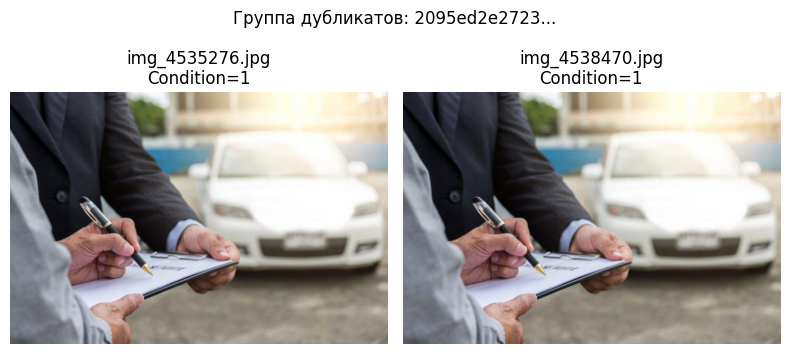

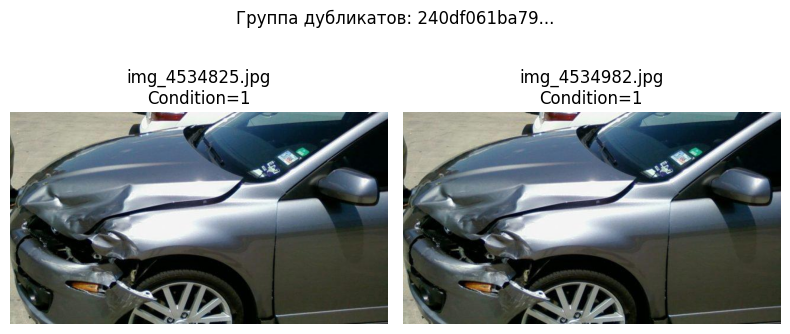

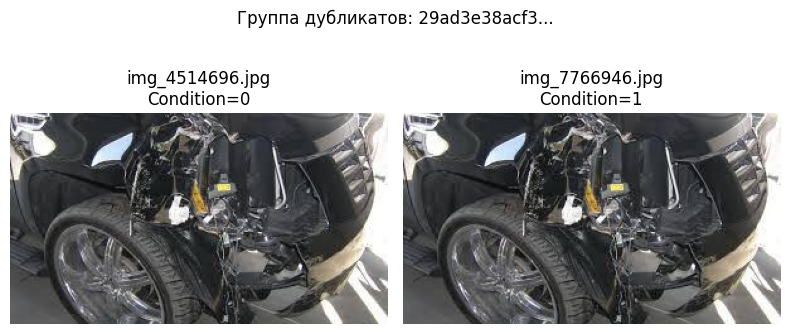

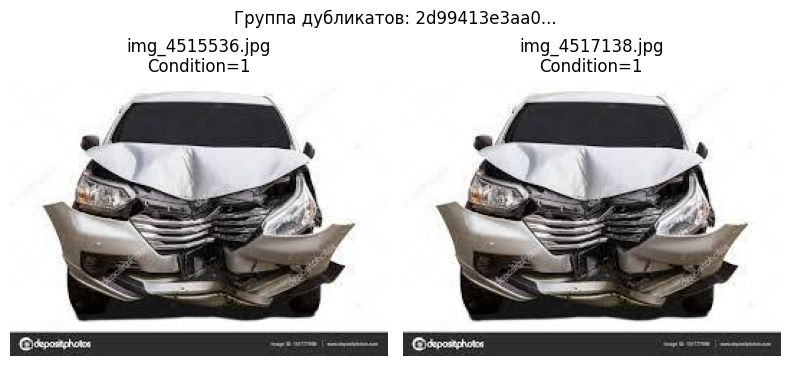

In [84]:
show_duplicate_groups(duplicate_images=duplicate_images, n_groups=10, max_images_per_group=4)

Выведим отдельно именно конфликтующие метки

In [85]:
conflict_hashes = duplicate_check[duplicate_check['n_labels'] > 1].index
conflict_duplicate_images = duplicate_images[duplicate_images['file_hash'].isin(conflict_hashes)].copy()
conflict_duplicate_images[['Image_path', 'Condition', 'file_hash']]

,Image_path,Condition,file_hash
421,img_4514696.jpg,0,29ad3e38acf33f751c5822d0aba95113
1213,img_7766946.jpg,1,29ad3e38acf33f751c5822d0aba95113


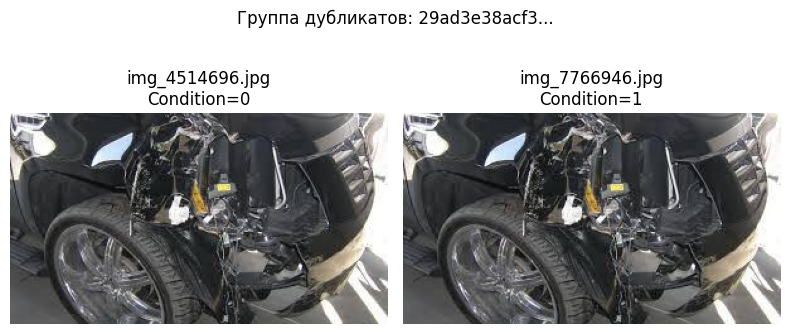

In [86]:
show_duplicate_groups(duplicate_images=conflict_duplicate_images, n_groups=10, max_images_per_group=6)

удаляем конфликтующие группы полностью

In [87]:
image_data_without_conflicts = image_eda_data[~image_eda_data['file_hash'].isin(conflict_hashes)].copy()
image_data_without_conflicts.shape

(1397, 21)

Теперь удаляем обычные точные дубли, где метки не конфликтуют:

In [88]:
image_data = image_data_without_conflicts.drop_duplicates(subset='file_hash', keep='first').copy()
image_data = image_data[['Image_path', 'Condition', 'full_image_path', 'file_hash']].copy()

image_data.shape

(1356, 4)

In [89]:
image_data['Condition'].value_counts(normalize=True)

,proportion
Condition,
1,0.927729
0,0.072271


In [90]:
print('Было изображений:', len(image_eda_data))
print('После удаления конфликтующих групп:', len(image_data_without_conflicts))
print('Стало изображений после очистки:', len(image_data))
print('Точных дублей после очистки:', image_data['file_hash'].duplicated().sum())

Было изображений: 1399
После удаления конфликтующих групп: 1397
Стало изображений после очистки: 1356
Точных дублей после очистки: 0


При проверке точных дубликатов была найдена одна группа изображений с конфликтующей разметкой, одинаковый файл встречался в датасете с двумя разными значениями Condition 0 и 1.Такую группу нельзя просто оставить через `keep='first'`, потому что в этом случае мы случайно сохраняем одну из меток, не зная, какая из них корректная. Поэтому конфликтующие дубликаты были удалены полностью. Для остальных точных дубликатов, у которых метка Condition совпадает внутри группы, была оставлена только одна копия изображения. Это позволит снизить риск утечки данных между train, validation и test, а также убрать повторяющиеся объекты из обучающей выборки


### Разбиение данных

Перед обучением моделей разделим данные на три части:

- `train` - используется для обучения модели
- `validation` - используется для выбора гиперпараметров и контроля переобучения
- `test` - используется только для финальной оценки качества модели

Т.к. распределение целевой переменной `Condition` сильно несбалансировано, разбиение нужно выполнять со стратификацией. Т.е. доли классов `0` и `1` будут примерно одинаковыми в train, validation и test

In [91]:
train_val_data, test_image_data = train_test_split(image_data, test_size=0.15, random_state=random_state, stratify=image_data['Condition'])

In [92]:
train_image_data, val_image_data = train_test_split(train_val_data, test_size=0.15, random_state=random_state, stratify=train_val_data['Condition'])

In [93]:
len(train_image_data)

979

In [94]:
len(val_image_data)

173

In [95]:
len(test_image_data)

204

Так как целевая переменная сильно несбалансирована, после разбиения данных нужно отдельно проверить, как классы распределились в train, validation и test

In [96]:
train_image_data['Condition'].value_counts(normalize=True).sort_index()

,proportion
Condition,
0,0.072523
1,0.927477


In [97]:
test_image_data['Condition'].value_counts(normalize=True).sort_index()

,proportion
Condition,
0,0.073529
1,0.926471


In [98]:
val_image_data['Condition'].value_counts(normalize=True).sort_index()

,proportion
Condition,
0,0.069364
1,0.930636


Стратификация сработала корректно. Дополнительно сохраним разбиение выборки в отдельные CSV

In [99]:
split_artifacts_dir = Path('cv_split_artifacts')
split_artifacts_dir.mkdir(exist_ok=True)

In [100]:
split_columns = ['Image_path', 'Condition']
train_split_path = split_artifacts_dir / 'train_split.csv'
val_split_path = split_artifacts_dir / 'val_split.csv'
test_split_path = split_artifacts_dir / 'test_split.csv'

In [101]:
train_image_data[split_columns].to_csv(train_split_path, index=False)
val_image_data[split_columns].to_csv(val_split_path, index=False)
test_image_data[split_columns].to_csv(test_split_path, index=False)

In [102]:
print(train_split_path)
print(val_split_path)
print(test_split_path)

cv_split_artifacts/train_split.csv
cv_split_artifacts/val_split.csv
cv_split_artifacts/test_split.csv


### Выбор способа изменения размера изображений на основе EDA

По результатам EDA видно, что изображения имеют разные пропорции. Большинство фотографий горизонтальные, но также встречаются очень широкие и вертикальные изображения. Если просто применить Resize((224, 224)), то исходное изображение принудительно сжимается в квадрат. Из за этого может искажаться форма автомобиля и локальные признаки повреждений. Поэтому добавим альтернативный preprocessing = Resize с сохранением пропорций и padding. В этом случае изображение масштабируется с сохранением aspect ratio, а пустые области заполняются нейтральной рамкой. Попробуем с помощью такого подхода меньше искажать геометрию автомобиля

In [103]:
class ResizeWithPadding:
    def __init__(self, size=(224, 224), fill=(124, 116, 104)):
        self.size = size
        self.fill = fill
    def __call__(self, image):
        if not isinstance(image, Image.Image):
            image = Image.fromarray(image)
        image = ImageOps.exif_transpose(image)
        image = image.convert('RGB')
        image_copy = image.copy()
        try:
            resample_method = Image.Resampling.BILINEAR
        except AttributeError:
            resample_method = Image.BILINEAR
        image_copy.thumbnail(self.size, resample_method)
        padded_image = Image.new('RGB', self.size, self.fill)
        left = (self.size[0]-image_copy.width)//2
        top = (self.size[1]-image_copy.height)//2
        padded_image.paste(image_copy, (left, top))
        return padded_image

Тут fill=(124, 116, 104) это примерно средние значения ImageNet в RGB. После нормализации такая рамка будет ближе к нейтральному фону, чем полностью черная рамка

Напишем функцию для визуального сравнения

In [104]:
def compare_resize_and_padding(image_path):
    original_image = Image.open(image_path)
    original_image = ImageOps.exif_transpose(original_image)
    original_image = original_image.convert('RGB')
    resize_transform = transforms.Resize((224, 224))
    padding_transform = ResizeWithPadding(size=(224, 224))
    resized_image = resize_transform(original_image)
    padded_image = padding_transform(original_image)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f'Исходное изображение\n{original_image.size}')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(resized_image)
    plt.title('Обычный Resize\n224 x 224')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(padded_image)
    plt.title('Resize + Padding\n224 x 224')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Сравним на широком изображении

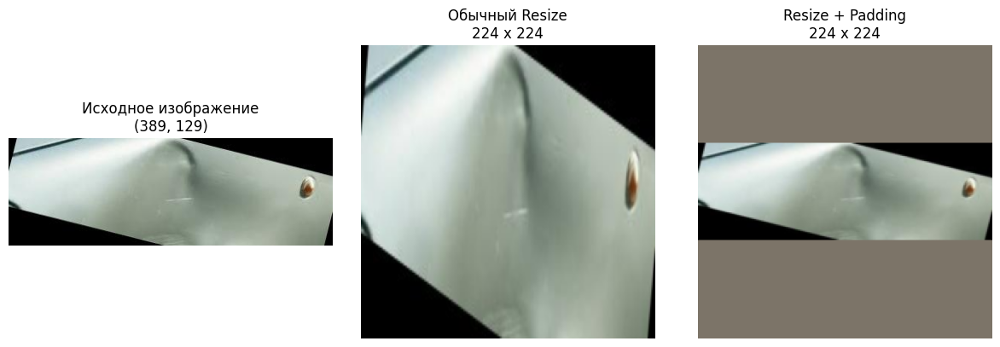

In [105]:
wide_example_path = image_eda_data.sort_values('aspect_ratio', ascending=False).iloc[5]['full_image_path']
compare_resize_and_padding(wide_example_path)

При обычном Resize до 224 на 224 изображение сильно растягивается по вертикали. Из-за этого геометрия автомобиля и деталей меняется: боковая часть машины и зеркало выглядят не так, как в исходном изображении. Для модели это может быть проблемой, потому что она будет видеть искаженные формы объектов

Сравним на вертикальном изображении

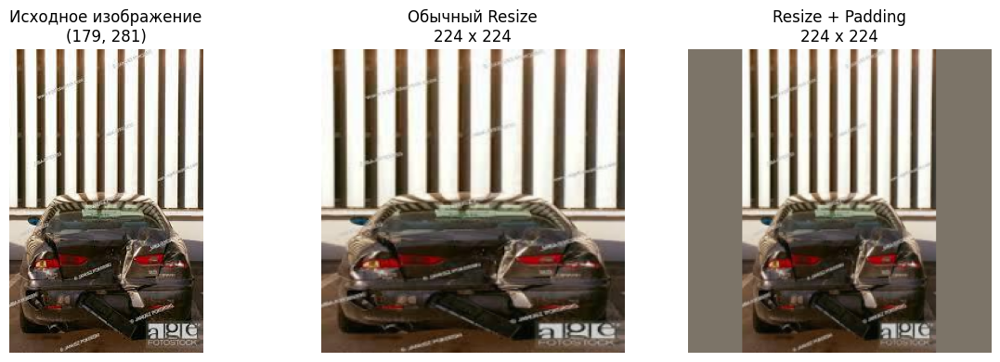

In [106]:
tall_example_path = image_eda_data.sort_values('aspect_ratio', ascending=True).iloc[5]['full_image_path']
compare_resize_and_padding(tall_example_path)

Обычный Resize также приводит фото к квадрату и немного меняет пропорции автомобиля. Resize + Padding сохраняет вертикальную структуру изображения и добавляет рамки по бокам

По визуальному сравнению видно, что обычный Resize и Resize + Padding по-разному обрабатывают изображения с нестандартными пропорциями. Обычный Resize можно оставить как базовый preprocessing, потому что он простой и стандартный для CNN. Но для датасета с нестандартными пропорциями полезно протестировать нам будет Resize + Padding как альтернативный вариант

### Преобразование изображений

Перед обучением CNN изображения необходимо привести к единому формату.

По результатам нпшего анализа все изображения обучающей выборки имеют 3 канала, то есть являются RGB-изображениями. При этом размеры изображений различаются, поэтому перед подачей в модель их нужно привести к одинаковой высоте и ширине. В PyTorch после преобразования `ToTensor()` изображение подается в модель в формате `C на H на W`.

По результатам EDA мы выяснили несколько важных особенностей данных:
- размеры изображений сильно различаются
- большинство фотографий горизонтальные, но встречаются очень широкие и вертикальные изображения
- часть изображений имеет нестандартные пропорции, черные поля, водяные знаки, размытость или низкий контраст
- обычный Resize((224, 224)) может искажать геометрию автомобиля на изображениях с нестандартным aspect ratio

Поэтому для дальнейших экспериментов подготовим два варианта preprocessing:

1. **Стандартный Resize** = базовый вариант, который будет использоваться для baseline модели.  
2. **Resize + Padding** = альтернативный вариант, который сохраняет исходные пропорции изображения и добавляет рамку до размера 224 на 224. Он задан выше

Так мы сможем проверить, влияет ли способ изменения размера изображения на качество классификации.

Для validation и test случайные аугментации не применяются, потому что эти выборки используются для стабильной оценки качества модели

In [107]:
image_size = 224
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

In [108]:
train_transforms = transforms.Compose([transforms.ToPILImage(), transforms.Resize((image_size, image_size)), transforms.RandomHorizontalFlip(p=0.5), transforms.RandomRotation(degrees=10), transforms.ToTensor(), transforms.Normalize(mean=imagenet_mean, std=imagenet_std)])

https://docs.pytorch.org/vision/0.9/transforms.html

https://deepmachinelearning.ru/docs/Neural-networks/Regularization/Augmentation

https://docs.pytorch.org/vision/stable/models/generated/torchvision.models.resnet18.html

Для train используются следующие преобразования:

- `ToPILImage()` = переводит изображение в формат, совместимый с `torchvision.transforms`
- `Resize((224, 224))` - приводит все изображения к единому размеру
- `RandomHorizontalFlip(p=0.5)` - отражает часть изображений по горизонтали, что хорошо для фотографий автомобилей с разных сторон. Т.е. каждое изображение отражается по горизонтали с вероятностью 50%
- `RandomRotation(degrees=10)` - добавляет небольшой поворот, имитируя реальные фотографии, сделанные не строго ровно
- `ToTensor()` - переводит изображение в PyTorch тензор формата
- `Normalize(...)` - нормализует RGB каналы для совместимости с предварительно обученными моделями

Более агрессивные аугментации не используются, потому что они могут исказить признаки повреждений, например царапины, вмятины и деформации кузова

Размер `224 на 224` выбран, т.к. он позволяет формировать батчи одинаковой формы и совместим с типовой предобработкой для предварительно обученных CNN архитектур из torchvision, где например для ResNet используется итоговый размер `224 на 224`

Остальные значения также используются для совместимости с моделями. Такие значения указаны в предоработке для моделей, обученных на ImageNet. Эту же нормализацию применяем ко всем архитектурам, чтобы сравнение моделей было корректным

In [109]:
eval_transforms = transforms.Compose([transforms.ToPILImage(), transforms.Resize((image_size, image_size)), transforms.ToTensor(), transforms.Normalize(mean=imagenet_mean, std=imagenet_std)])

Для validation и test используются только детерминированные преобразования: `ToPILImage`, `Resize`, `ToTensor`, `Normalize`
Случайные преобразования здесь не применяются, чтобы метрики качества не зависели от случайности аугментаций

Проверим работу train_transforms на одном изображении

In [110]:
sample_image_path = image_data.loc[0, 'full_image_path']
sample_image = plt.imread(sample_image_path)

In [111]:
transformed_image = train_transforms(sample_image)

In [112]:
sample_image.shape

(418, 630, 3)

In [113]:
transformed_image.shape

torch.Size([3, 224, 224])

In [114]:
type(transformed_image)

torch.Tensor

сработало

In [115]:
transformed_image.min()

tensor(-2.1179)

In [116]:
transformed_image.max()

tensor(2.6400)

In [117]:
transformed_image.mean()

tensor(0.0450)

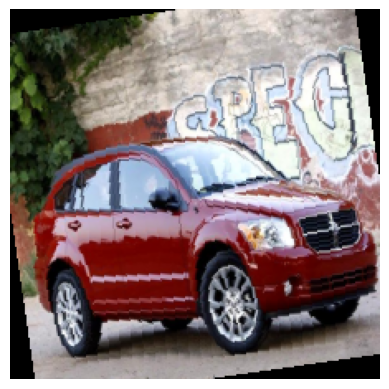

In [118]:
image_to_show = transformed_image.permute(1, 2, 0)
mean = torch.tensor(imagenet_mean)
std = torch.tensor(imagenet_std)
image_to_show = image_to_show*std+mean
image_to_show = image_to_show.clamp(0, 1)
plt.imshow(image_to_show)
plt.axis('off')
plt.show()

Теперь зададим второй вариант преобразований = Resize + Padding. Он будет использоваться как альтернативный preprocessing для последующих экспериментов

In [119]:
train_transforms_padding = transforms.Compose([transforms.ToPILImage(), ResizeWithPadding(size=(image_size, image_size)), transforms.RandomHorizontalFlip(p=0.5), transforms.RandomRotation(degrees=10), transforms.ToTensor(), transforms.Normalize(mean=imagenet_mean, std=imagenet_std)])

In [120]:
eval_transforms_padding = transforms.Compose([transforms.ToPILImage(), ResizeWithPadding(size=(image_size, image_size)), transforms.ToTensor(), transforms.Normalize(mean=imagenet_mean, std=imagenet_std)])

В дальнейшем baseline модель будем обучать на стандартном Resize, чтобы получить простую точку отсчета. Resize + Padding сохраним как отдельный preprocessing вариант для следующих экспериментов с более сильными архитектурами

### Создание собственного Dataset

В нашем датасете изображения и разметка хранятся отдельно, т.е. имена файлов находятся в столбце `Image_path`, целевая переменная в столбце `Condition`, а сами изображения лежат в папке `trainImages`.

Поэтому для обучения в PyTorch создаем собственный класс `Dataset`, который по индексу будет:

1. брать строку из таблицы
2. строить путь к изображению
3. считывать изображение
4. применять transforms
5. возвращать пару `(image, label)`

После этого `Dataset` будет передаваться в `DataLoader`, который будет формировать батчи и позволяет перемешивать train выборку

Входновители:
- https://docs.pytorch.org/tutorials/beginner/data_loading_tutorial.html
- https://docs.pytorch.org/tutorials/beginner/basics/data_tutorial.html
- https://habr.com/ru/articles/553716/
- https://www.learnpytorch.io/04_pytorch_custom_datasets/
- https://docs.pytorch.org/docs/2.12/data.html

In [121]:
class MyDataset(Dataset):
    def __init__(self, data, images_dir, transform=None):
        self.data = data.reset_index(drop=True)
        self.images_dir = images_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]
        image = plt.imread(self.images_dir / row['Image_path'])
        label = row['Condition']
        label = torch.tensor(label, dtype=torch.float32)
        if self.transform is not None:
            image = self.transform(image)
        return image, label

В данном классе

- `data` - таблица с Image_path и Condition
- `images_dir` - папка, где лежат изображения
- `transform` - набор преобразований для изображения
- `__len__` возвращает размер датасета
- `__getitem__` возвращает одно изображение и его метку

Метка переводится в `torch.float32`, потому что далее для бинарной классификации будет использоваться `BCEWithLogitsLoss`, который работает с вещественными таргетами `0.0` и `1.0`

Теперь создаем три датасета:

- `train_dataset` использует train выборку и преобразования с аугментациями
- `val_dataset` использует validation выборку и преобразования без случайных аугментаций
- `test_dataset` использует test выборку и преобразования без случайных аугментаций

In [122]:
train_dataset = MyDataset(data=train_image_data, images_dir=DATA_DIR / 'trainImages', transform=train_transforms)

In [123]:
val_dataset = MyDataset(data=val_image_data, images_dir=DATA_DIR / 'trainImages', transform=eval_transforms)

In [124]:
test_dataset = MyDataset(data=test_image_data, images_dir=DATA_DIR / 'trainImages', transform=eval_transforms)

Проверим один объект

In [125]:
image, label = train_dataset[0]

In [126]:
image.shape

torch.Size([3, 224, 224])

In [127]:
label

tensor(1.)

In [128]:
type(image), type(label)

(torch.Tensor, torch.Tensor)

Добавим padding версии

In [129]:
train_dataset_padding = MyDataset(data=train_image_data, images_dir=DATA_DIR / 'trainImages', transform=train_transforms_padding)
val_dataset_padding = MyDataset(data=val_image_data, images_dir=DATA_DIR / 'trainImages', transform=eval_transforms_padding)
test_dataset_padding = MyDataset(data=test_image_data, images_dir=DATA_DIR / 'trainImages', transform=eval_transforms_padding)

### Создание DataLoader

После создания `Dataset` создадим `DataLoader`

`DataLoader` нужен для формирования батчей. Нейронная сеть обучается на небольших группах объектов.

Для обучающей выборки используем `shuffle=True`, чтобы порядок объектов перемешивался между эпохами. Для validation и test используем `shuffle=False`, так как эти выборки нужны только для оценки качества модели

Выбираем размер батча = 32, он обычно помещается в память при работе с изображениями `224 на 224` и позволяет обучать модель стабильнее, чем при очень маленьком батче

In [130]:
batch_size = 32

In [131]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [132]:
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [133]:
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Проверим один батч

In [134]:
batch_images, batch_labels = next(iter(train_loader))

In [135]:
batch_images.shape

torch.Size([32, 3, 224, 224])

In [136]:
batch_labels.shape

torch.Size([32])

Также создадим отдельные DataLoader для padding варианта. Пока не будем использовать их в baseline, но сохраним для следующих экспериментов

In [137]:
train_loader_padding = DataLoader(train_dataset_padding, batch_size=batch_size, shuffle=True)
val_loader_padding = DataLoader(val_dataset_padding, batch_size=batch_size, shuffle=False)
test_loader_padding = DataLoader(test_dataset_padding, batch_size=batch_size, shuffle=False)

In [138]:
batch_images_padding, batch_labels_padding = next(iter(train_loader_padding))
batch_images_padding.shape

torch.Size([32, 3, 224, 224])

In [139]:
batch_labels_padding.shape

torch.Size([32])

### Настройка устройства для обучения

Перед обучением модели задаем устройство вычислений. Если доступна видеокарта, модель и батчи будут переноситься на cuda, иначе обучение будет выполняться на cpu

In [140]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

- https://docs.pytorch.org/docs/2.12/cuda.html
- https://docs.pytorch.org/docs/2.12/generated/torch.Tensor.to.html

### Модель 1. BaselineCNN

Первой архитектурой будет простая сверточная нейронная сеть, обучаемая с нуля. Она нужна как бейслайн нам. С ней будем сравнивать более сложные архитектуры Базовая CNN строится из последовательности блоков:

`Conv2d -> BatchNorm2d -> ReLU -> MaxPool2d`

После сверточной части используется `AdaptiveAvgPool2d`, затем `Dropout` и финальный линейный слой с одним выходом. Один выход нужен потому, что задача бинарная и модель должна вернуть один logit для каждого изображения

- https://neerc.ifmo.ru/wiki/index.php?title=%D0%A1%D0%B2%D0%B5%D1%80%D1%82%D0%BE%D1%87%D0%BD%D1%8B%D0%B5_%D0%BD%D0%B5%D0%B9%D1%80%D0%BE%D0%BD%D0%BD%D1%8B%D0%B5_%D1%81%D0%B5%D1%82%D0%B8
- https://habr.com/ru/articles/436838/
- https://habr.com/ru/companies/mvideo/articles/782360/
- https://education.yandex.ru/handbook/ml/article/svyortochnye-nejroseti

In [141]:
class BaselineCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
        )
        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.3),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x.squeeze(1)

Проверим, что архитектура в целом норм работает, принимает батч и возвращает выход нужной формы

In [142]:
model = BaselineCNN().to(device)

In [143]:
batch_images = batch_images.to(device)

In [144]:
with torch.no_grad():
    outputs = model(batch_images)

In [145]:
outputs.shape

torch.Size([32])

In [146]:
outputs[:5]

tensor([-0.3798, -0.4663, -0.4850,  0.0354, -1.2648], device='cuda:0')

Все ок. Для каждого изображения из батча модель вернула один logit

https://docs.pytorch.org/docs/2.12/generated/torch.nn.BCEWithLogitsLoss.html

https://docs.pytorch.org/docs/2.12/generated/torch.no_grad.html

Зададим функцию потерь и оптимизатор

In [147]:
criterion = nn.BCEWithLogitsLoss()

BCEWithLogitsLoss используется для бинарной классификации, когда модель возвращает один logit для каждого объекта. Эта функция внутри объединяет sigmoid и binary cross-entropy, поэтому отдельно добавлять sigmoid в модель не нужно

https://docs.pytorch.org/docs/2.12/generated/torch.nn.Sigmoid.html

In [148]:
optimizer = optim.Adam(model.parameters(), lr=1e-3)

https://docs.pytorch.org/docs/2.12/optim.html

Напишем функцию обучения одной эпохи. Функция train_one_epoch выполняет один полный проход по обучающей выборке. Внутри нее модель переводится в режим обучения, считаются предсказания, loss, градиенты и обновляются веса. В конце функция возвращает среднее значение loss за эпоху

https://yassin01.medium.com/understanding-the-difference-between-model-eval-and-model-train-in-pytorch-48e3002ee0a2

In [149]:
def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*images.size(0)
    avg_loss = total_loss/len(dataloader.dataset)
    return avg_loss

Функция evaluate используется для оценки модели без обновления весов. Она переводит модель в режим eval, отключает расчет градиентов и считает loss, accuracy, precision, recall, F1-score и ROC-AUC. Модель возвращает logits, затем они переводятся в вероятности с помощью torch.sigmoid. После этого вероятности преобразуются в классы по порогу 0.5

Добавим еще такие метрики:
- balanced_accuracy = accuracy, скорректированная с учетом дисбаланса классов
- macro_f1 = F1-score, усредненный по двум классам без учета их размера
- precision, recall и F1-score отдельно для класса Condition = 0

In [150]:
def evaluate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    all_labels = []
    all_probs = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            probs = torch.sigmoid(outputs)
            total_loss += loss.item()*images.size(0)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    avg_loss = total_loss/len(dataloader.dataset)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    all_preds = (all_probs>=0.5).astype(int)
    metrics = {
        'loss': avg_loss,
        'accuracy': accuracy_score(all_labels, all_preds),
        'balanced_accuracy': balanced_accuracy_score(all_labels, all_preds),
        'precision': precision_score(all_labels, all_preds, zero_division=0),
        'recall': recall_score(all_labels, all_preds, zero_division=0),
        'f1': f1_score(all_labels, all_preds, zero_division=0),
        'macro_f1': f1_score(all_labels, all_preds, average='macro', zero_division=0),
        'precision_class_0': precision_score(all_labels, all_preds, pos_label=0, zero_division=0),
        'recall_class_0': recall_score(all_labels, all_preds, pos_label=0, zero_division=0),
        'f1_class_0': f1_score(all_labels, all_preds, pos_label=0, zero_division=0),
        'roc_auc': roc_auc_score(all_labels, all_probs)
    }
    return metrics

#### Логирование экспериментов через mlflow и dagshub

Добавим логированин экспериментов. Будем сохранять результаты разных архитектур в едином формате, чтобы нам было дальше удобно сравнивать. Каждый запуск модели будем оформлять как отдельный mlflow run. В run будут логироваться:
- параметры эксперимента: архитектура, размер изображения, batch size, learning rate, optimizer, функция потерь, preprocessing
- метрики по эпохам: train loss, validation loss, accuracy, precision, recall, F1-score, ROC-AUC
- итоговые test метрики
- артефакты: графики обучения, classification report, confusion matrix, предсказания на test выборке и веса модели

Для удаленного хранения экспериментов будем использовать DagsHub. Если DagsHub не будет работать, будем работать локально через SQLite

https://mlflow.org/docs/latest/self-hosting

https://habr.com/ru/companies/digdes/articles/673324

https://habr.com/ru/companies/ods/articles/828458

Настроем подключение к DagsHub, если он доступен

In [151]:
use_dagshub = True

In [152]:
if use_dagshub:
    try:
        dagshub.init(repo_owner='RenataMal', repo_name='GP5', mlflow=True)
        tracking_mode = 'dagshub'
    except Exception as error:
        print('DagsHub недоступен, используем локальный MLflow')
        print(error)
        mlflow.set_tracking_uri('sqlite:///mlflow.db')
        tracking_mode = 'local'
else:
    mlflow.set_tracking_uri('sqlite:///mlflow.db')
    tracking_mode = 'local'

❗❗❗ AUTHORIZATION REQUIRED ❗❗❗

Output()



Open the following link in your browser to authorize the client:
https://dagshub.com/login/oauth/authorize?state=f6edb878-276c-4200-aae6-d6b788055ca4&client_id=32b60ba385aa7cecf24046d8195a71c07dd345d9657977863b52e7748e0f0f28&middleman_request_id=3b20345038d33ce1cc499f3beb04a129173bdc33d4026ab820e376c2afaee1c2




Accessing as RenataMal

Initialized MLflow to track repo "RenataMal/GP5"

Repository RenataMal/GP5 initialized!

In [153]:
mlflow.set_experiment('GP5_car_damage_classification')

<Experiment: artifact_location='mlflow-artifacts:/fbb6f5b0d3254b0f89524f9fdc27a812', creation_time=1781210520116, effective_trace_archival_retention=None, experiment_id='0', last_update_time=1781210520116, lifecycle_stage='active', name='GP5_car_damage_classification', tags={'mlflow.experimentKind': 'custom_model_development'}, trace_location=None, workspace='default'>

In [154]:
tracking_mode

'dagshub'

In [155]:
mlflow.get_tracking_uri()

'https://dagshub.com/RenataMal/GP5.mlflow'

Теперь дальнейшие mlflow запуски будут отправляться в DagsHub репозиторий проекта, либо сохраняться локально через SQLite. После восстановления DagsHub можно будет переключить `use_dagshub = True` и отправлять эксперименты в удаленный репозиторий проекта

Зададим основные параметры эксперимента

https://mlflow.org/docs/latest/ml/tracking

https://mlflow.org/docs/latest/ml/tracking/tracking-api

https://mlflow.org/docs/latest/self-hosting/architecture/backend-store

In [156]:
num_epochs = 10
learning_rate = 1e-3
batch_size = 32
image_size = 224

Также ниже мы будем строить различные артефакты. СоздадИм функцию для построения и сохранения графиков обучения. Она сохраняет два графика: динамику функции потерь и динамику метрик валидации

In [157]:
def save_training_plots(history_data, model_name):
    loss_plot_path = f'{model_name}_loss_plot.png'
    plt.figure(figsize=(6, 4))
    plt.plot(history_data['epoch'], history_data['train_loss'], label='Ошибка на обучении')
    plt.plot(history_data['epoch'], history_data['val_loss'], label='Ошибка на валидации')
    plt.xlabel('Эпоха')
    plt.ylabel('Значение функции потерь')
    plt.title(f'{model_name}: ошибка на обучении и валидации')
    plt.legend()
    plt.savefig(loss_plot_path, bbox_inches='tight')
    plt.show()
    metrics_plot_path = f'{model_name}_metrics_plot.png'
    plt.figure(figsize=(9, 4))
    plt.plot(history_data['epoch'], history_data['val_f1'], label='F1-score на валидации')
    plt.plot(history_data['epoch'], history_data['val_roc_auc'], label='ROC-AUC на валидации')
    plt.xlabel('Эпоха')
    plt.ylabel('Значение метрики')
    plt.title(f'{model_name}: метрики качества на валидации')
    plt.legend()
    plt.savefig(metrics_plot_path, bbox_inches='tight')
    plt.show()
    return loss_plot_path, metrics_plot_path

Также создадим функцию для построения и сохранения матрицы ошибок

In [158]:
def save_confusion_matrix_plot(y_true, y_pred, model_name):
    conf_matrix = confusion_matrix(y_true, y_pred)
    conf_matrix_path = f'{model_name}_confusion_matrix.png'
    plt.figure(figsize=(5, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='PuRd', xticklabels=['Без повреждений', 'С повреждениями'], yticklabels=['Без повреждений', 'С повреждениями'])
    plt.xlabel('Предсказанный класс')
    plt.ylabel('Истинный класс')
    plt.title(f'{model_name}: матрица ошибок')
    plt.savefig(conf_matrix_path, bbox_inches='tight')
    plt.show()
    return conf_matrix_path

Конечно еще создадим функцию для сохранения classification report. Этот отчет показывает precision, recall и F1-score отдельно для каждого класса

In [159]:
def save_classification_report(y_true, y_pred, model_name):
    report_text = classification_report(y_true, y_pred, target_names=['Без повреждений', 'С повреждениями'], zero_division=0)
    report_path = f'{model_name}_classification_report.txt'
    with open(report_path, 'w', encoding='utf-8') as file:
        file.write(report_text)
    print(report_text)
    return report_path

Чтобы было видно качество по каждому классу, напишем отдельную функцию get_predictions. Модель переводится в режим оценки, затем для каждого батча считаются logits, вероятности через sigmoid и итоговые классы по порогу 0.5

In [160]:
def get_predictions(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    all_preds = (all_probs>=0.5).astype(int)
    return all_labels, all_preds, all_probs

Создадим единую функцию run_cv_experiment. Она будет выполнять полный пайплайн обучения для одной модели. Внутри функции будут выполняться основные этапы эксперимента: обучение модели по эпохам, оценка на validation, расчет test метрик, сохранение истории обучения, графиков, classification report, confusion matrix, предсказаний и весов модели. Каждая модель будет опять же логироваться как отдельный mLflow run

https://docs.pytorch.org/tutorials/beginner/saving_loading_models.html

https://docs.pytorch.org/tutorials/beginner/basics/saveloadrun_tutorial.html

In [161]:
def run_cv_experiment(model_name, model, train_loader, val_loader, test_loader, criterion, optimizer, device, num_epochs,params):
    model = model.to(device)
    history = []
    best_val_macro_f1 = -np.inf
    best_epoch = None
    best_model_state_dict = None
    with mlflow.start_run(run_name=model_name):
        mlflow.log_params(params)
        mlflow.set_tag('checkpoint_selection', 'best_val_macro_f1')
        start_training_time = time.time()
        for epoch in range(num_epochs):
            start_epoch_time = time.time()
            train_loss = train_one_epoch(model=model, dataloader=train_loader, criterion=criterion, optimizer=optimizer, device=device)
            val_metrics = evaluate(model=model, dataloader=val_loader, criterion=criterion, device=device)
            epoch_time = time.time()-start_epoch_time
            epoch_result = {'epoch': epoch+1,
                'train_loss': train_loss,
                'val_loss': val_metrics['loss'],
                'val_accuracy': val_metrics['accuracy'],
                'val_balanced_accuracy': val_metrics['balanced_accuracy'],
                'val_precision': val_metrics['precision'],
                'val_recall': val_metrics['recall'],
                'val_f1': val_metrics['f1'],
                'val_macro_f1': val_metrics['macro_f1'],
                'val_precision_class_0': val_metrics['precision_class_0'],
                'val_recall_class_0': val_metrics['recall_class_0'],
                'val_f1_class_0': val_metrics['f1_class_0'],
                'val_roc_auc': val_metrics['roc_auc'],
                'epoch_time_sec': epoch_time}
            history.append(epoch_result)
            if val_metrics['macro_f1'] > best_val_macro_f1:
              best_val_macro_f1 = val_metrics['macro_f1']
              best_epoch = epoch + 1
              best_model_state_dict = {key: value.detach().cpu().clone() for key, value in model.state_dict().items()}
            mlflow.log_metric('train_loss', train_loss, step=epoch+1)
            mlflow.log_metric('val_loss', val_metrics['loss'], step=epoch+1)
            mlflow.log_metric('val_accuracy', val_metrics['accuracy'], step=epoch+1)
            mlflow.log_metric('val_precision', val_metrics['precision'], step=epoch+1)
            mlflow.log_metric('val_recall', val_metrics['recall'], step=epoch+1)
            mlflow.log_metric('val_f1', val_metrics['f1'], step=epoch+1)
            mlflow.log_metric('val_balanced_accuracy', val_metrics['balanced_accuracy'], step=epoch+1)
            mlflow.log_metric('val_macro_f1', val_metrics['macro_f1'], step=epoch+1)
            mlflow.log_metric('val_precision_class_0', val_metrics['precision_class_0'], step=epoch+1)
            mlflow.log_metric('val_recall_class_0', val_metrics['recall_class_0'], step=epoch+1)
            mlflow.log_metric('val_f1_class_0', val_metrics['f1_class_0'], step=epoch+1)
            mlflow.log_metric('val_roc_auc', val_metrics['roc_auc'], step=epoch+1)
            mlflow.log_metric('epoch_time_sec', epoch_time, step=epoch+1)
            print(f"Эпоха {epoch + 1}/{num_epochs} | ошибка на обучении: {train_loss:.4f} | ошибка на валидации: {val_metrics['loss']:.4f} | accuracy: {val_metrics['accuracy']:.4f} | F1: {val_metrics['f1']:.4f} | ROC-AUC: {val_metrics['roc_auc']:.4f} | время эпохи: {epoch_time:.1f} сек")
        total_training_time = time.time()-start_training_time
        mlflow.log_metric('total_training_time_sec', total_training_time)
        mlflow.log_metric('best_val_macro_f1', best_val_macro_f1)
        mlflow.log_param('best_epoch', best_epoch)
        if best_model_state_dict is not None:
            model.load_state_dict(best_model_state_dict)
            best_model_weights_path = f'{model_name}_best_val_macro_f1.pt'
            torch.save(best_model_state_dict, best_model_weights_path)
            mlflow.log_artifact(best_model_weights_path, artifact_path='checkpoints')
        history_data = pd.DataFrame(history)
        history_path = f'{model_name}_history.csv'
        history_data.to_csv(history_path, index=False)
        mlflow.log_artifact(history_path)
        loss_plot_path, metrics_plot_path = save_training_plots(history_data=history_data, model_name=model_name)
        mlflow.log_artifact(loss_plot_path)
        mlflow.log_artifact(metrics_plot_path)
        test_metrics = evaluate(model=model, dataloader=test_loader, criterion=criterion, device=device)
        mlflow.log_metric('test_loss', test_metrics['loss'])
        mlflow.log_metric('test_accuracy', test_metrics['accuracy'])
        mlflow.log_metric('test_precision', test_metrics['precision'])
        mlflow.log_metric('test_recall', test_metrics['recall'])
        mlflow.log_metric('test_f1', test_metrics['f1'])
        mlflow.log_metric('test_balanced_accuracy', test_metrics['balanced_accuracy'])
        mlflow.log_metric('test_macro_f1', test_metrics['macro_f1'])
        mlflow.log_metric('test_precision_class_0', test_metrics['precision_class_0'])
        mlflow.log_metric('test_recall_class_0', test_metrics['recall_class_0'])
        mlflow.log_metric('test_f1_class_0', test_metrics['f1_class_0'])
        mlflow.log_metric('test_roc_auc', test_metrics['roc_auc'])
        test_labels, test_preds, test_probs = get_predictions(model=model, dataloader=test_loader, device=device)
        predictions_data = pd.DataFrame({'true_label': test_labels, 'predicted_label': test_preds, 'predicted_probability': test_probs})
        predictions_path = f'{model_name}_test_predictions.csv'
        predictions_data.to_csv(predictions_path, index=False)
        mlflow.log_artifact(predictions_path)
        report_path = save_classification_report(y_true=test_labels, y_pred=test_preds, model_name=model_name)
        mlflow.log_artifact(report_path)
        conf_matrix_path = save_confusion_matrix_plot(y_true=test_labels, y_pred=test_preds, model_name=model_name)
        mlflow.log_artifact(conf_matrix_path)
        model_weights_path = f'{model_name}.pt'
        torch.save(model.state_dict(), model_weights_path)
        mlflow.log_artifact(model_weights_path)
    return model, history_data, test_metrics

Сохраним и зафиксируем все параметры наши

In [162]:
baseline_params = {'model_name': 'BaselineCNN',
    'architecture': 'custom_cnn',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': num_epochs,
    'learning_rate': learning_rate,
    'optimizer': 'Adam',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': False,
    'train_size': len(train_dataset),
    'val_size': len(val_dataset),
    'test_size': len(test_dataset),
    'random_state': random_state,
    'resize': '224x224',
    'normalization_mean': '[0.485, 0.456, 0.406]',
    'normalization_std': '[0.229, 0.224, 0.225]',
    'train_augmentation': 'RandomHorizontalFlip(p=0.5), RandomRotation(degrees=10)',
    'eval_augmentation': 'None',
    'tracking_mode': tracking_mode}

#### Запуск BaselineCNN через наш пайплайн

Здесь как раз проведем наше основное обучение

In [163]:
baseline_model = BaselineCNN()

In [164]:
baseline_criterion = nn.BCEWithLogitsLoss()

In [165]:
baseline_optimizer = optim.Adam(baseline_model.parameters(), lr=learning_rate)

Перед обучением модели посмотрим ее структуру

In [166]:
summary(baseline_model, input_size=(batch_size, 3, 224, 224), col_names=['input_size', 'output_size', 'num_params', 'trainable'], depth=4)

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
BaselineCNN                              [32, 3, 224, 224]         [32]                      --                        True
├─Sequential: 1-1                        [32, 3, 224, 224]         [32, 128, 28, 28]         --                        True
│    └─Conv2d: 2-1                       [32, 3, 224, 224]         [32, 32, 224, 224]        896                       True
│    └─BatchNorm2d: 2-2                  [32, 32, 224, 224]        [32, 32, 224, 224]        64                        True
│    └─ReLU: 2-3                         [32, 32, 224, 224]        [32, 32, 224, 224]        --                        --
│    └─MaxPool2d: 2-4                    [32, 32, 224, 224]        [32, 32, 112, 112]        --                        --
│    └─Conv2d: 2-5                       [32, 32, 112, 112]        [32, 64, 112, 112]        18,496                    True
│    └─

Эпоха 1/10 | ошибка на обучении: 0.4325 | ошибка на валидации: 0.3507 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5083 | время эпохи: 11.1 сек
Эпоха 2/10 | ошибка на обучении: 0.2630 | ошибка на валидации: 0.2609 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5135 | время эпохи: 11.4 сек
Эпоха 3/10 | ошибка на обучении: 0.2510 | ошибка на валидации: 0.2728 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5575 | время эпохи: 10.9 сек
Эпоха 4/10 | ошибка на обучении: 0.2505 | ошибка на валидации: 0.2506 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.6139 | время эпохи: 10.6 сек
Эпоха 5/10 | ошибка на обучении: 0.2427 | ошибка на валидации: 0.2833 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4953 | время эпохи: 11.6 сек
Эпоха 6/10 | ошибка на обучении: 0.2450 | ошибка на валидации: 0.2558 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.6113 | время эпохи: 11.5 сек
Эпоха 7/10 | ошибка на обучении: 0.2512 | ошибка на валидации: 0.2625 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5502 | время эпохи: 1

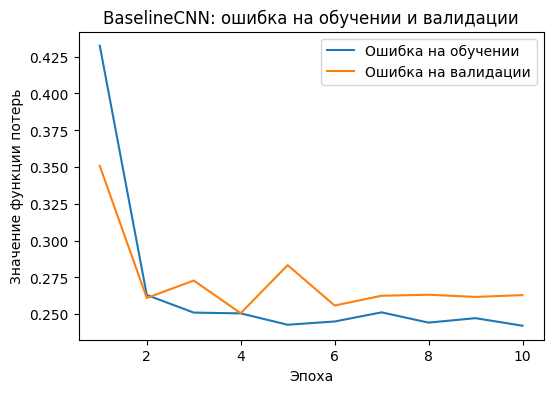

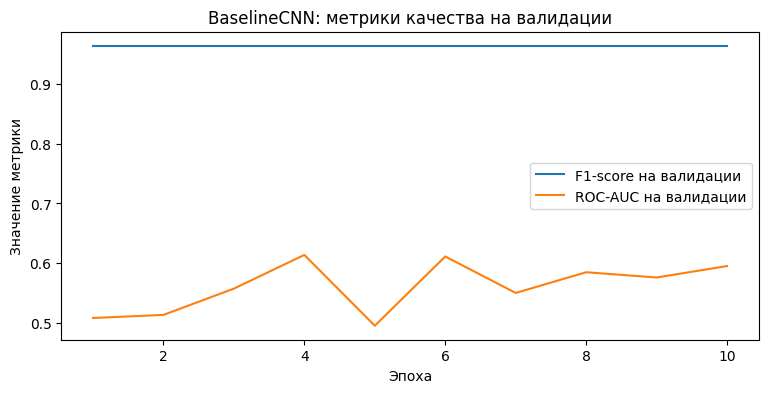

                 precision    recall  f1-score   support

Без повреждений       0.00      0.00      0.00        15
С повреждениями       0.93      1.00      0.96       189

       accuracy                           0.93       204
      macro avg       0.46      0.50      0.48       204
   weighted avg       0.86      0.93      0.89       204



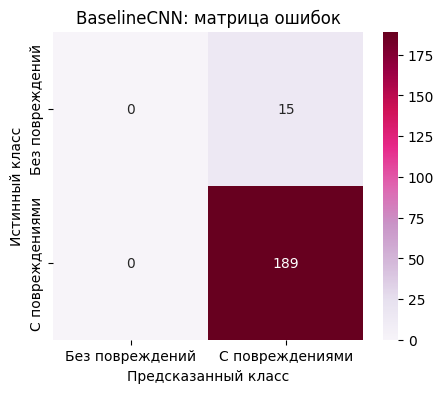

🏃 View run BaselineCNN at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/90969f22d7064167b5109521efd10b77
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [167]:
baseline_model, baseline_history_data, baseline_test_metrics = run_cv_experiment(model_name='BaselineCNN', model=baseline_model, train_loader=train_loader, val_loader=val_loader, test_loader=test_loader, criterion=baseline_criterion, optimizer=baseline_optimizer, device=device, num_epochs=num_epochs, params=baseline_params)

#### Результаты BaselineCNN

Выведим историю обучения модели

In [168]:
baseline_history_data

,epoch,train_loss,val_loss,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_macro_f1,val_precision_class_0,val_recall_class_0,val_f1_class_0,val_roc_auc,epoch_time_sec
0,1,0.432456,0.350707,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.508282,11.055004
1,2,0.262982,0.260942,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.513458,11.429789
2,3,0.250997,0.272811,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.557453,10.903432
3,4,0.250477,0.250594,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.613872,10.628503
4,5,0.242741,0.283266,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.495342,11.604173
5,6,0.244960,0.255812,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.611284,11.457187
6,7,0.251177,0.262463,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.550207,11.346353
7,8,0.244185,0.263147,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.584886,11.435189
8,9,0.247223,0.261671,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.576087,11.475797
9,10,0.242081,0.262893,0.930636,0.5,0.930636,1.0,0.964072,0.482036,0.0,0.0,0.0,0.595238,11.289613


In [169]:
baseline_test_metrics_data = pd.DataFrame([baseline_test_metrics])
baseline_test_metrics_data

,loss,accuracy,balanced_accuracy,precision,recall,f1,macro_f1,precision_class_0,recall_class_0,f1_class_0,roc_auc
0,0.360043,0.926471,0.5,0.926471,1.0,0.961832,0.480916,0.0,0.0,0.0,0.567549


Сохраним результаты в словарик

In [170]:
baseline_results = {'model': 'BaselineCNN', 'test_loss': baseline_test_metrics['loss'],
    'test_accuracy': baseline_test_metrics['accuracy'], 'test_precision': baseline_test_metrics['precision'],
    'test_recall': baseline_test_metrics['recall'], 'test_f1': baseline_test_metrics['f1'], 'test_roc_auc': baseline_test_metrics['roc_auc']}
baseline_results

{'model': 'BaselineCNN',
 'test_loss': 0.36004261643278834,
 'test_accuracy': 0.9264705882352942,
 'test_precision': 0.9264705882352942,
 'test_recall': 1.0,
 'test_f1': 0.9618320610687023,
 'test_roc_auc': np.float64(0.5675485008818342)}

BaselineCNN была использована как первая базовая архитектура, обучаемая с нуля. Она будет епе точка отсчета для сравнения с более сложными CNN моделями. Модель была обучена через общий пайплайн обученич, а параметры, метрики и артефакты эксперимента были сохранены в mlflow. BaselineCNN можно считать корректной стартовой моделью, она обучается, loss снижается, пайплайн работает, метрики и артефакты логируются. Но по качеству эта архитектура недостаточна для практического применения. В следующих экспериментах нужно проверить более сильные архитектуры

### Визуализация фильтров и карт признаков BaselineCNN

После обучения BaselineCNN дополнительно визуализируем, что происходит внутри сверточной сети.Сначала посмотрим на фильтры первого сверточного слоя. В сверточной сети фильтр является набором обучаемых весов, которые применяются к изображению и помогают выделять локальные паттерны. Затем визуализируем карты признаков для одного изображения. Карта признаков показывает, как конкретный фильтр реагирует на разные области входного изображения

https://docs.pytorch.org/docs/2.12/generated/torch.nn.Conv2d.html

У нас первый сверточный слой находится здесь

In [171]:
baseline_model.features[0]

Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

Извлечем веса первого слоя

In [172]:
filters = baseline_model.features[0].weight.data.cpu()

In [173]:
filters.shape

torch.Size([32, 3, 3, 3])

Визуализируем первые 16 фильтров. Напишем функцию для этого. Посмотрим какие низкоуровневые цветовые и локальные паттерны выучила модель в первом сверточном слое

In [174]:
def show_first_layer_filters(model, n_filters=16):
    first_conv_layer = model.features[0]
    filters = first_conv_layer.weight.data.cpu()
    n_filters = min(n_filters, filters.shape[0])
    plt.figure(figsize=(10, 10))
    for i in range(n_filters):
        filter_img = filters[i]
        filter_img = filter_img.permute(1, 2, 0)
        filter_img = filter_img-filter_img.min()
        filter_img = filter_img/filter_img.max()
        plt.subplot(4, 4, i+1)
        plt.imshow(filter_img)
        plt.title(f'Фильтр {i + 1}')
        plt.axis('off')
    plt.suptitle('Фильтры первого сверточного слоя BaselineCNN')
    plt.tight_layout()
    plt.show()

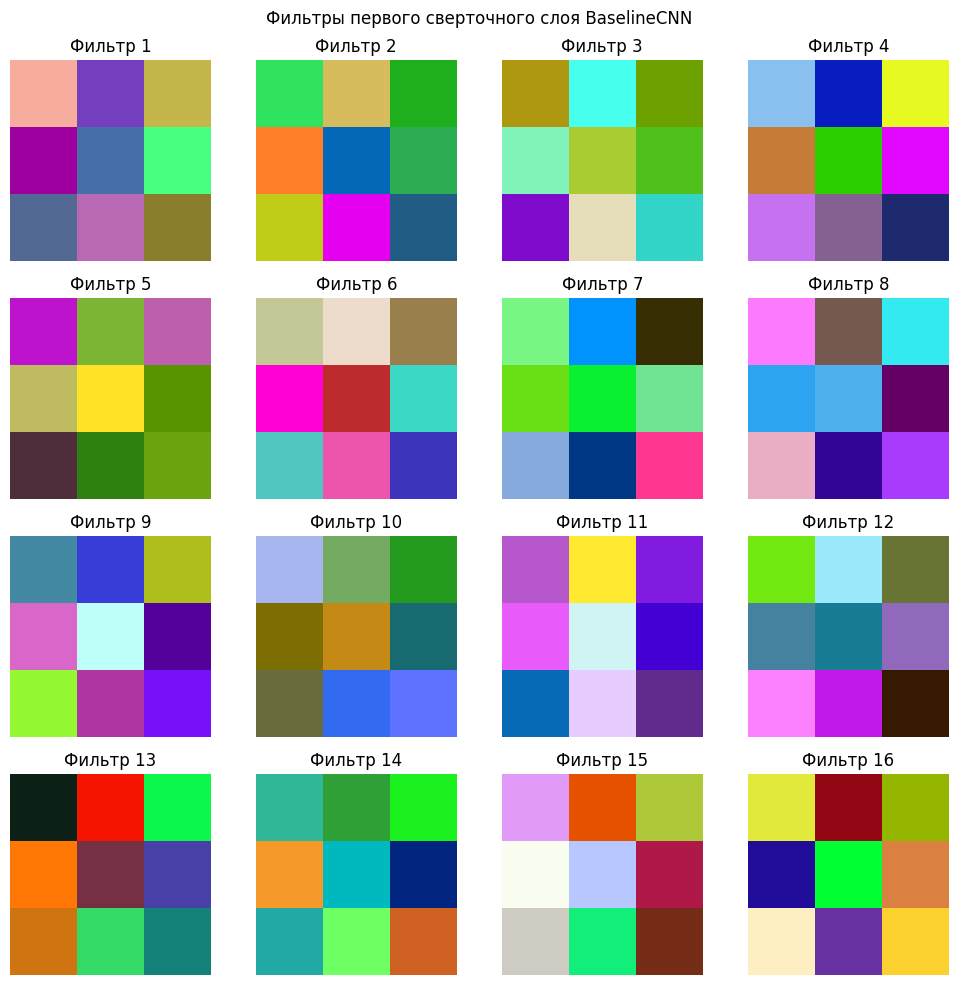

In [175]:
show_first_layer_filters(baseline_model, n_filters=16)

Теперь возьмем одно изображение из `test_dataset`

In [176]:
sample_image, sample_label = test_dataset[0]

In [177]:
sample_image_batch = sample_image.unsqueeze(0).to(device)

In [178]:
sample_image_batch.shape

torch.Size([1, 3, 224, 224])

In [179]:
sample_label

tensor(1.)

In [180]:
baseline_model.eval()
with torch.no_grad():
    first_block_features = baseline_model.features[:4](sample_image_batch)

In [181]:
first_block_features.shape

torch.Size([1, 32, 112, 112])

То есть получили 32 карты признаков после первого блока. Каждая карта показывает, как один фильтр реагирует на разные области изображения

Теперь визуализируем первые 16 карт признаков. Напишем также для этого функцию. Карты признаков показываются в оттенках серого. Более светлые участки соответствуют более сильным активациям, т.е. тем областям изображения, где фильтр нашел свой паттерн

In [182]:
def show_feature_maps(feature_maps, n_maps=16):
    feature_maps = feature_maps.squeeze(0).cpu()
    n_maps = min(n_maps, feature_maps.shape[0])
    plt.figure(figsize=(10, 10))
    for i in range(n_maps):
        feature_map = feature_maps[i]
        plt.subplot(4, 4, i+1)
        plt.imshow(feature_map, cmap='gray')
        plt.title(f'Карта {i+1}')
        plt.axis('off')
    plt.suptitle('Карты признаков после первого сверточного блока')
    plt.tight_layout()
    plt.show()

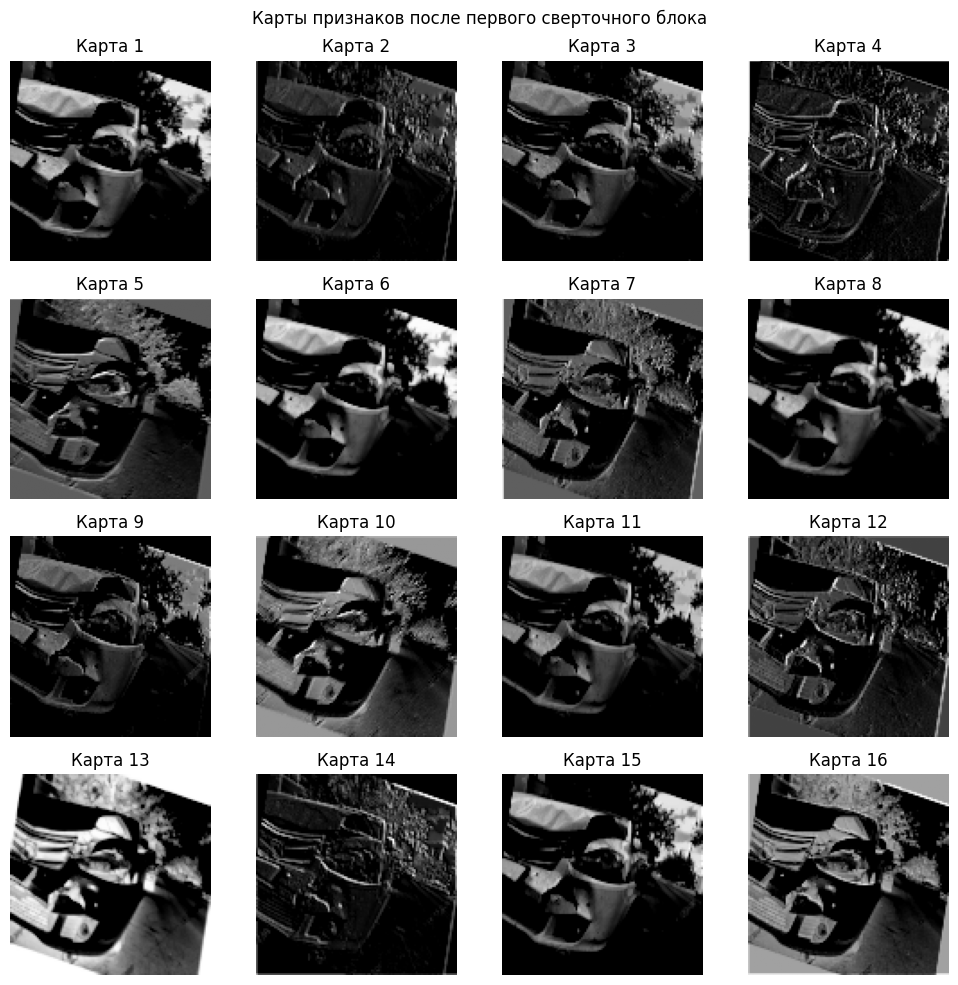

In [183]:
show_feature_maps(first_block_features, n_maps=16)

Напишем функцию для отображения исходного изображения после обратной нормализации

In [184]:
def show_denormalized_image(image_tensor):
    image = image_tensor.cpu().permute(1, 2, 0)
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    image = image*std+mean
    image = image.clamp(0, 1)
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.title('Исходное изображение после обратной нормализации')
    plt.axis('off')
    plt.show()

Покажем исходное изображение, для которого строили карты признаков

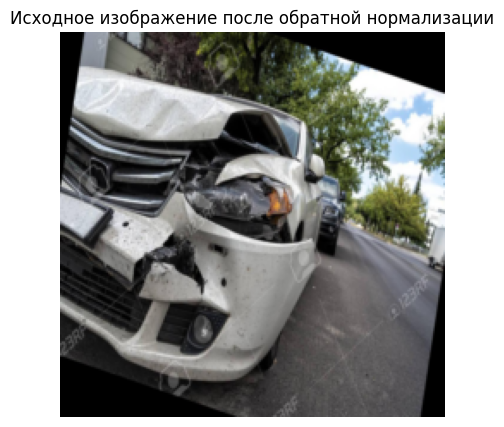

In [185]:
show_denormalized_image(sample_image)

### Baseline + Padding

После baseline модели со стандартным Resize дополнительно проверим тот же BaselineCNN, но с другим способом preprocessing = Resize + Padding. Меняем только способ приведения изображения к размеру 224 на 224. Нам интересно отдельно оценить влияние preprocessing. Если качество изменится, это будет означать, что найденная на EDA проблема нестандартных пропорций действительно влияет на обучение модели

In [186]:
baseline_padding_model = BaselineCNN().to(device)

In [187]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(baseline_padding_model.parameters(), lr=0.001)

In [188]:
baseline_padding_params = {'architecture': 'BaselineCNN', 'preprocessing': 'ResizeWithPadding', 'image_size': image_size, 'batch_size': batch_size, 'optimizer': 'Adam', 'learning_rate': 0.001, 'loss_function': 'BCEWithLogitsLoss', 'num_epochs': 10}

Эпоха 1/10 | ошибка на обучении: 0.3467 | ошибка на валидации: 0.4245 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5171 | время эпохи: 11.6 сек
Эпоха 2/10 | ошибка на обучении: 0.2571 | ошибка на валидации: 0.2638 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4757 | время эпохи: 11.6 сек
Эпоха 3/10 | ошибка на обучении: 0.2552 | ошибка на валидации: 0.2851 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4896 | время эпохи: 11.6 сек
Эпоха 4/10 | ошибка на обучении: 0.2509 | ошибка на валидации: 0.2708 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4462 | время эпохи: 11.7 сек
Эпоха 5/10 | ошибка на обучении: 0.2502 | ошибка на валидации: 0.2745 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4436 | время эпохи: 11.6 сек
Эпоха 6/10 | ошибка на обучении: 0.2446 | ошибка на валидации: 0.2784 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.4710 | время эпохи: 11.1 сек
Эпоха 7/10 | ошибка на обучении: 0.2514 | ошибка на валидации: 0.2765 | accuracy: 0.9306 | F1: 0.9641 | ROC-AUC: 0.5212 | время эпохи: 1

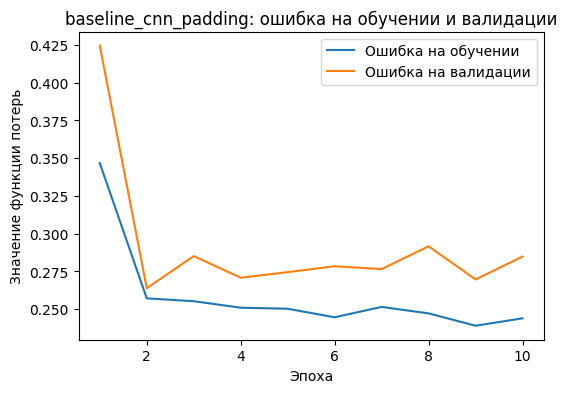

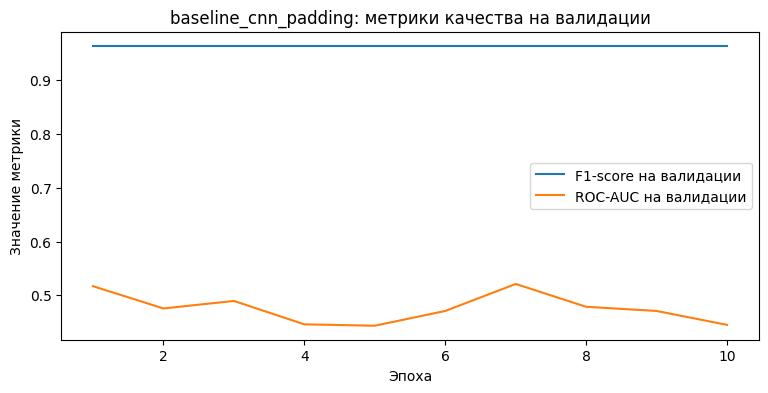

                 precision    recall  f1-score   support

Без повреждений       0.00      0.00      0.00        15
С повреждениями       0.93      1.00      0.96       189

       accuracy                           0.93       204
      macro avg       0.46      0.50      0.48       204
   weighted avg       0.86      0.93      0.89       204



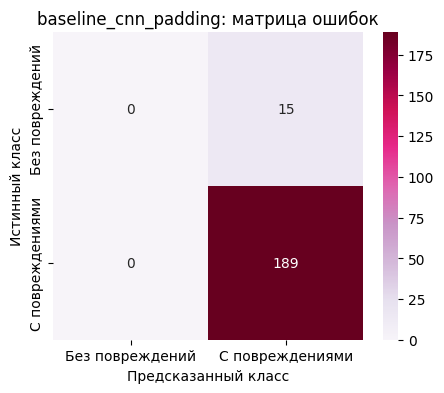

🏃 View run baseline_cnn_padding at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/b7d1b53c082b4a40b0f9fd82594cfb5d
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [189]:
baseline_padding_model, baseline_padding_history, baseline_padding_test_metrics = run_cv_experiment(model=baseline_padding_model, train_loader=train_loader_padding, val_loader=val_loader_padding, test_loader=test_loader_padding, criterion=criterion, optimizer=optimizer, device=device, num_epochs=10, model_name='baseline_cnn_padding', params=baseline_padding_params)

BaselineCNN с Resize + Padding не решил проблему дисбаланса классов. Cамо сохранение пропорций изображения через Padding не помогло baseline модели справиться с дисбалансом. Проблема качества baseline связана прежде всего с сильным дисбалансом классов и слабостью простой CNN архитектуры

In [190]:
train_data.duplicated(subset=['Image_path']).sum()

np.int64(0)

In [191]:
train_data['Image_path'].unique()

array(['img_4513976.jpg', 'img_7764995.jpg', 'img_451308.jpg', ...,
       'img_4637503.jpg', 'img_4515101.jpg', 'img_4636333.jpg'],
      dtype=object)

### Baseline + WeightedRandomSampler

В предыдущих экспериментах BaselineCNN со стандартным Resize и BaselineCNN с Resize + Padding показали похожую проблему: модель почти всегда предсказывает мажоритарный класс Condition = 1. Это связано с сильным дисбалансом классов. В обучающей выборке изображений с повреждениями значительно больше, чем изображений без повреждений. Поэтому простая CNN находит слишком простую стратегию, чаще выбирать класс 1 и получать высокую accuracy. Padding не решил эту проблему, потому что он меняет только способ обработки изображения, но не меняет распределение классов в обучающих батчах. Поэтому следующим шагом проверим WeightedRandomSampler. Это стратегия формирования батчей. WeightedRandomSampler чаще выбирает объекты редкого класса Condition = 0, чтобы модель во время обучения чаще видела примеры без повреждений

Создаем веса классов

In [192]:
class_counts = train_image_data['Condition'].value_counts().sort_index()
class_counts

,count
Condition,
0,71
1,908


In [193]:
class_weights = 1/class_counts
class_weights

,count
Condition,
0,0.014085
1,0.001101


Идея простая: чем реже класс встречается в train, тем больший вес он получает. Поэтому изображения класса Condition = 0 будут чаще попадать в обучающие батчи

Создаем веса для каждого объекта

In [194]:
sample_weights = train_image_data['Condition'].map(class_weights).values
sample_weights = torch.DoubleTensor(sample_weights)
sample_weights[:10]

tensor([0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0141,
        0.0011], dtype=torch.float64)

In [195]:
len(sample_weights), len(train_dataset)

(979, 979)

Создаем WeightedRandomSampler

In [196]:
sampler = torch.utils.data.WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

Параметр `replacement=True` означает, что один и тот же объект может быть выбран несколько раз за эпоху. Это нормально для oversampling редкого класса, так модель чаще видит изображения Condition = 0. Что нам и надо

Создаем отдельный DataLoader с sampler

In [197]:
train_loader_sampler = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, shuffle=False)

При использовании sampler нельзя одновременно использовать `shuffle=True`, потому что порядок объектов уже задается самим sampler

Проверим, как изменился состав батча

In [198]:
batch_images_sampler, batch_labels_sampler = next(iter(train_loader_sampler))
batch_images_sampler.shape, batch_labels_sampler.shape

(torch.Size([32, 3, 224, 224]), torch.Size([32]))

In [199]:
pd.Series(batch_labels_sampler.numpy()).value_counts(normalize=True)

,proportion
1.0,0.59375
0.0,0.40625


Запускаем BaselineCNN с WeightedRandomSampler

In [200]:
baseline_sampler_model = BaselineCNN().to(device)
baseline_sampler_criterion = nn.BCEWithLogitsLoss()
baseline_sampler_optimizer = optim.Adam(baseline_sampler_model.parameters(), lr=learning_rate)

In [201]:
baseline_sampler_params = {'model_name': 'BaselineCNN_sampler_clean',
    'architecture': 'custom_cnn',
    'preprocessing': 'Resize',
    'imbalance_strategy': 'WeightedRandomSampler',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': num_epochs,
    'learning_rate': learning_rate,
    'optimizer': 'Adam',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': False,
    'train_size': len(train_dataset),
    'val_size': len(val_dataset),
    'test_size': len(test_dataset),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/10 | ошибка на обучении: 0.6766 | ошибка на валидации: 0.7187 | accuracy: 0.5202 | F1: 0.6745 | ROC-AUC: 0.4213 | время эпохи: 15.8 сек
Эпоха 2/10 | ошибка на обучении: 0.6503 | ошибка на валидации: 0.9515 | accuracy: 0.2486 | F1: 0.3299 | ROC-AUC: 0.5481 | время эпохи: 11.2 сек
Эпоха 3/10 | ошибка на обучении: 0.6169 | ошибка на валидации: 0.8661 | accuracy: 0.3410 | F1: 0.4623 | ROC-AUC: 0.6278 | время эпохи: 11.4 сек
Эпоха 4/10 | ошибка на обучении: 0.5863 | ошибка на валидации: 0.5823 | accuracy: 0.6879 | F1: 0.8138 | ROC-AUC: 0.4788 | время эпохи: 12.0 сек
Эпоха 5/10 | ошибка на обучении: 0.5936 | ошибка на валидации: 0.7117 | accuracy: 0.5665 | F1: 0.7012 | ROC-AUC: 0.7076 | время эпохи: 10.8 сек
Эпоха 6/10 | ошибка на обучении: 0.5619 | ошибка на валидации: 0.8993 | accuracy: 0.3815 | F1: 0.5069 | ROC-AUC: 0.6817 | время эпохи: 11.1 сек
Эпоха 7/10 | ошибка на обучении: 0.5597 | ошибка на валидации: 0.3575 | accuracy: 0.9017 | F1: 0.9480 | ROC-AUC: 0.5932 | время эпохи: 1

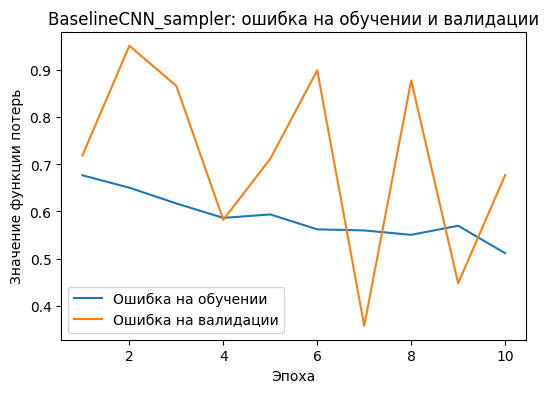

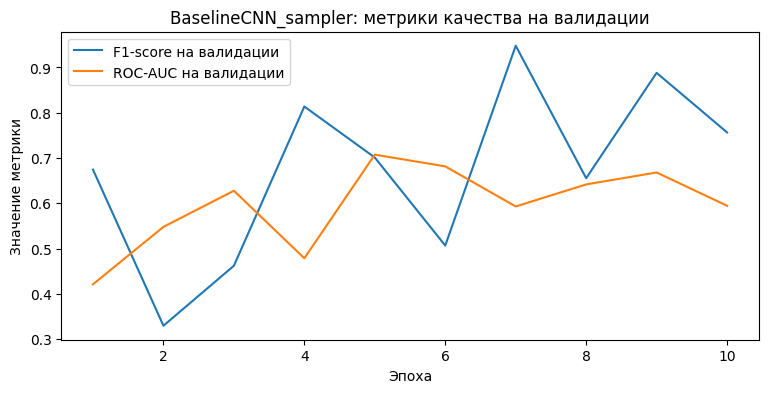

                 precision    recall  f1-score   support

Без повреждений       0.04      0.13      0.06        15
С повреждениями       0.92      0.75      0.83       189

       accuracy                           0.71       204
      macro avg       0.48      0.44      0.44       204
   weighted avg       0.85      0.71      0.77       204



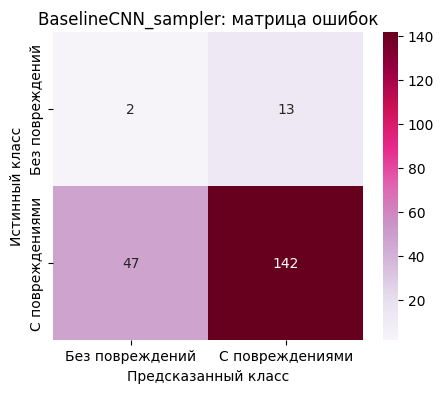

🏃 View run BaselineCNN_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/17a90a4e986e441b831c6f6d9ef9b983
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [202]:
baseline_sampler_model, baseline_sampler_history_data, baseline_sampler_test_metrics = run_cv_experiment(model_name='BaselineCNN_sampler',
    model=baseline_sampler_model,
    train_loader=train_loader_sampler,
    val_loader=val_loader,
    test_loader=test_loader,
    criterion=baseline_sampler_criterion,
    optimizer=baseline_sampler_optimizer,
    device=device,
    num_epochs=num_epochs,
    params=baseline_sampler_params)

Сравним baseline эксперименты

In [203]:
baseline_comparison = pd.DataFrame([
    {'experiment': 'BaselineCNN + Resize',
    'test_accuracy': baseline_test_metrics['accuracy'],
    'test_balanced_accuracy': baseline_test_metrics['balanced_accuracy'],
    'test_macro_f1': baseline_test_metrics['macro_f1'],
    'test_f1_class_0': baseline_test_metrics['f1_class_0'],
    'test_roc_auc': baseline_test_metrics['roc_auc']},
    {'experiment': 'BaselineCNN + Padding',
    'test_accuracy': baseline_padding_test_metrics['accuracy'],
    'test_balanced_accuracy': baseline_padding_test_metrics['balanced_accuracy'],
    'test_macro_f1': baseline_padding_test_metrics['macro_f1'],
    'test_f1_class_0': baseline_padding_test_metrics['f1_class_0'],
    'test_roc_auc': baseline_padding_test_metrics['roc_auc']},
    {'experiment': 'BaselineCNN + WeightedRandomSampler',
    'test_accuracy': baseline_sampler_test_metrics['accuracy'],
    'test_balanced_accuracy': baseline_sampler_test_metrics['balanced_accuracy'],
    'test_macro_f1': baseline_sampler_test_metrics['macro_f1'],
    'test_f1_class_0': baseline_sampler_test_metrics['f1_class_0'],
    'test_roc_auc': baseline_sampler_test_metrics['roc_auc']}])
baseline_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,BaselineCNN + Resize,0.926471,0.500000,0.480916,0.0000,0.567549
1,BaselineCNN + Padding,0.926471,0.500000,0.480916,0.0000,0.445855
2,BaselineCNN + WeightedRandomSampler,0.705882,0.442328,0.444041,0.0625,0.536155


BaselineCNN показала высокую accuracy около 0.93, но это связано с сильным дисбалансом классов. Модель почти всегда предсказывает класс Condition = 1 и не распознает класс Condition = 0. Precision, recall и F1-score для класса “Без повреждений” равны 0.

Эксперимент с Resize + Padding дал такой же результат, поэтому сохранение пропорций изображения само по себе не решило проблему.

WeightedRandomSampler помог модели начать находить редкий класс, recall для класса “Без повреждений” вырос до 0.4. Однако precision остался низким, а accuracy снизилась до 0.53. Это означает, что простая BaselineCNN даже с балансировкой батчей недостаточна для качественного решения задачи.

Далее нужно перейти к более сильным предобученным CNN-архитектурам


### Модель 2. ConvNeXT

In [204]:
import timm

In [205]:
class SqueezeModel(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        x = self.model(x)
        return x.squeeze(1)

In [206]:
def create_convnext_atto_model():
    base_model = timm.create_model('convnext_atto', pretrained=True, num_classes=1)
    model = SqueezeModel(base_model)
    return model

In [207]:
def freeze_convnext_backbone(model):
    for param in model.parameters():
        param.requires_grad = False
    for param in model.model.head.parameters():
        param.requires_grad = True

In [208]:
def unfreeze_model(model):
    for param in model.parameters():
        param.requires_grad = True

In [209]:
convnext_atto_model = create_convnext_atto_model().to(device)
test_batch_images, test_batch_labels = next(iter(train_loader_sampler))

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/14.8M [00:00<?, ?B/s]

In [210]:
with torch.no_grad():
    test_outputs = convnext_atto_model(test_batch_images.to(device))
test_outputs.shape

torch.Size([32])

обучаем только head

In [211]:
convnext_atto_model = create_convnext_atto_model().to(device)
freeze_convnext_backbone(convnext_atto_model)
convnext_stage1_criterion = nn.BCEWithLogitsLoss()
convnext_stage1_optimizer = optim.AdamW(filter(lambda param: param.requires_grad, convnext_atto_model.parameters()), lr=1e-3, weight_decay=1e-5)

In [212]:
convnext_stage1_params = {'model_name': 'ConvNeXtAtto_stage1_head_sampler',
    'architecture': 'convnext_atto',
    'preprocessing': 'Resize',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'head_only',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 2,
    'learning_rate': 1e-3,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset),
    'val_size': len(val_dataset),
    'test_size': len(test_dataset),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/2 | ошибка на обучении: 0.6258 | ошибка на валидации: 0.6231 | accuracy: 0.6474 | F1: 0.7698 | ROC-AUC: 0.8416 | время эпохи: 14.2 сек
Эпоха 2/2 | ошибка на обучении: 0.4711 | ошибка на валидации: 0.5740 | accuracy: 0.6936 | F1: 0.8073 | ROC-AUC: 0.8742 | время эпохи: 10.0 сек


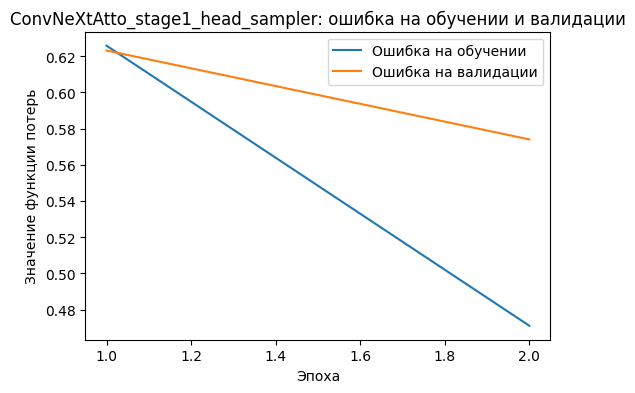

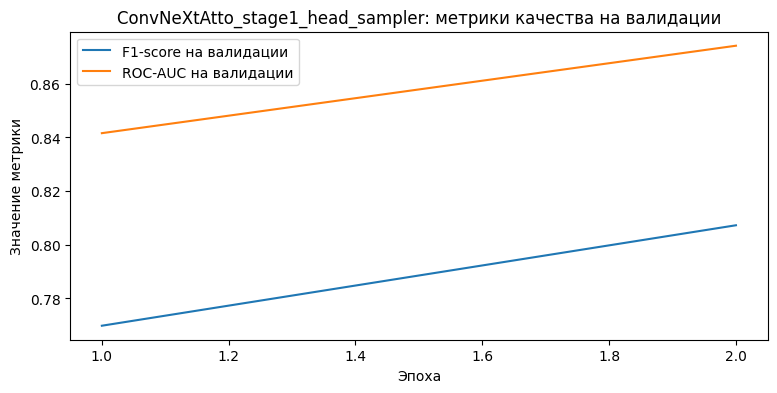

                 precision    recall  f1-score   support

Без повреждений       0.18      0.80      0.30        15
С повреждениями       0.98      0.72      0.83       189

       accuracy                           0.73       204
      macro avg       0.58      0.76      0.56       204
   weighted avg       0.92      0.73      0.79       204



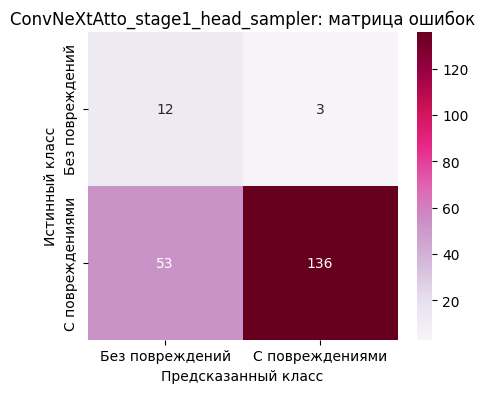

🏃 View run ConvNeXtAtto_stage1_head_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/bb661f72bc6241ef9b5668754e59871b
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [213]:
convnext_atto_model, convnext_stage1_history_data, convnext_stage1_test_metrics = run_cv_experiment(model_name='ConvNeXtAtto_stage1_head_sampler',
    model=convnext_atto_model,
    train_loader=train_loader_sampler,
    val_loader=val_loader,
    test_loader=test_loader,
    criterion=convnext_stage1_criterion,
    optimizer=convnext_stage1_optimizer,
    device=device,
    num_epochs=2,
    params=convnext_stage1_params)

размораживаем всю модель

In [214]:
unfreeze_model(convnext_atto_model)
convnext_stage2_criterion = nn.BCEWithLogitsLoss()
convnext_stage2_optimizer = optim.AdamW(convnext_atto_model.parameters(), lr=1e-5, weight_decay=1e-5)

In [215]:
convnext_stage2_params = {'model_name': 'ConvNeXtAtto_stage2_finetune_sampler',
    'architecture': 'convnext_atto',
    'preprocessing': 'Resize',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'fine_tuning_all_layers',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 4,
    'learning_rate': 1e-5,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset),
    'val_size': len(val_dataset),
    'test_size': len(test_dataset),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/4 | ошибка на обучении: 0.3827 | ошибка на валидации: 0.4678 | accuracy: 0.7746 | F1: 0.8660 | ROC-AUC: 0.8354 | время эпохи: 17.7 сек
Эпоха 2/4 | ошибка на обучении: 0.2583 | ошибка на валидации: 0.3947 | accuracy: 0.8266 | F1: 0.9000 | ROC-AUC: 0.8427 | время эпохи: 13.7 сек
Эпоха 3/4 | ошибка на обучении: 0.1882 | ошибка на валидации: 0.3496 | accuracy: 0.8382 | F1: 0.9073 | ROC-AUC: 0.8416 | время эпохи: 15.3 сек
Эпоха 4/4 | ошибка на обучении: 0.1605 | ошибка на валидации: 0.3040 | accuracy: 0.8728 | F1: 0.9286 | ROC-AUC: 0.8385 | время эпохи: 13.8 сек


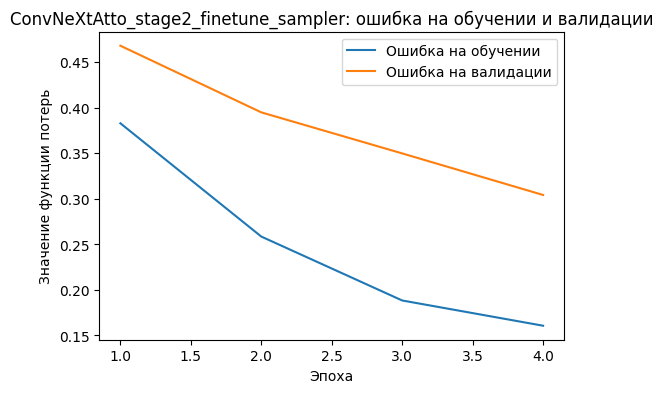

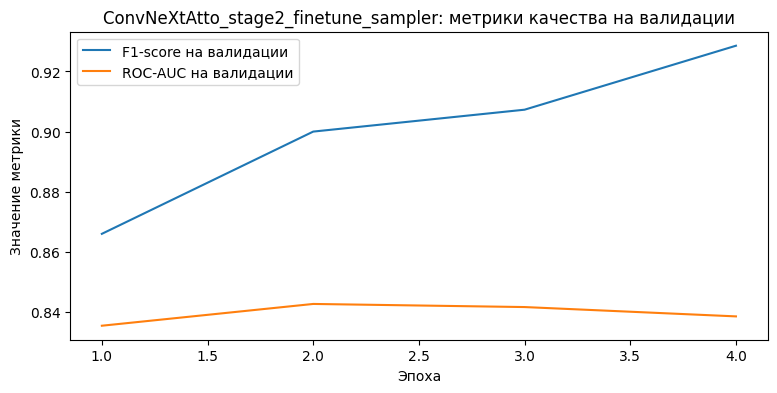

                 precision    recall  f1-score   support

Без повреждений       0.35      0.73      0.48        15
С повреждениями       0.98      0.89      0.93       189

       accuracy                           0.88       204
      macro avg       0.67      0.81      0.71       204
   weighted avg       0.93      0.88      0.90       204



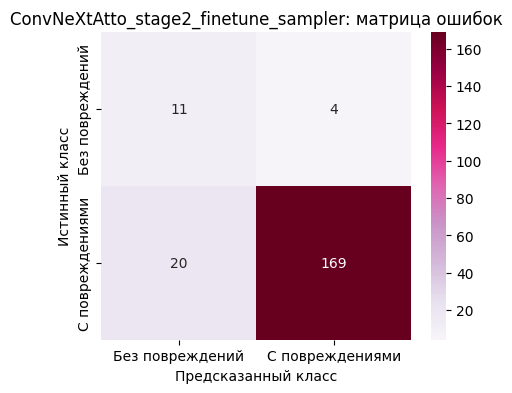

🏃 View run ConvNeXtAtto_stage2_finetune_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/154365d0741a44d6b71a60b65e4483aa
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [216]:
convnext_atto_model, convnext_atto_history_data, convnext_atto_test_metrics = run_cv_experiment(model_name='ConvNeXtAtto_stage2_finetune_sampler',
    model=convnext_atto_model,
    train_loader=train_loader_sampler,
    val_loader=val_loader,
    test_loader=test_loader,
    criterion=convnext_stage2_criterion,
    optimizer=convnext_stage2_optimizer,
    device=device,
    num_epochs=4,
    params=convnext_stage2_params)

### ConvNeXt + Resize with Padding

После эксперимента ConvNeXt Atto со стандартным Resize дополнительно проверим ту же архитектуру, но с альтернативной предобработкой Resize + Padding

Создаем sampler для padding dataset

In [217]:
class_counts = train_image_data['Condition'].value_counts().sort_index()
class_weights = 1 / class_counts
sample_weights_padding = train_image_data['Condition'].map(class_weights).values
sample_weights_padding = torch.DoubleTensor(sample_weights_padding)
sample_weights_padding[:10]

tensor([0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0141,
        0.0011], dtype=torch.float64)

In [218]:
sampler_padding = torch.utils.data.WeightedRandomSampler(weights=sample_weights_padding, num_samples=len(sample_weights_padding), replacement=True)

In [219]:
train_loader_padding_sampler = DataLoader(train_dataset_padding, batch_size=batch_size, sampler=sampler_padding, shuffle=False)

In [220]:
batch_images_padding_sampler, batch_labels_padding_sampler = next(iter(train_loader_padding_sampler))
batch_images_padding_sampler.shape, batch_labels_padding_sampler.shape

(torch.Size([32, 3, 224, 224]), torch.Size([32]))

In [221]:
pd.Series(batch_labels_padding_sampler.numpy()).value_counts(normalize=True)

,proportion
1.0,0.53125
0.0,0.46875


WeightedRandomSampler используется и для padding версии, чтобы сравнение с ConvNeXt Atto + Resize было честным. В обоих случаях модель обучается с учетом дисбаланса классов, а меняется только способ preprocessing

На первом этапе обучаем только классификационный слой

In [222]:
convnext_atto_padding_model = create_convnext_atto_model().to(device)

In [223]:
freeze_convnext_backbone(convnext_atto_padding_model)

In [224]:
summary(convnext_atto_padding_model, input_size=(batch_size, 3, image_size, image_size), col_names=['input_size', 'output_size', 'num_params', 'trainable'], depth=3, device=device)

Layer (type:depth-idx)                             Input Shape               Output Shape              Param #                   Trainable
SqueezeModel                                       [32, 3, 224, 224]         [32]                      --                        Partial
├─ConvNeXt: 1-1                                    [32, 3, 224, 224]         [32, 1]                   --                        Partial
│    └─Sequential: 2-1                             [32, 3, 224, 224]         [32, 40, 56, 56]          --                        False
│    │    └─Conv2d: 3-1                            [32, 3, 224, 224]         [32, 40, 56, 56]          (1,960)                   False
│    │    └─LayerNorm2d: 3-2                       [32, 40, 56, 56]          [32, 40, 56, 56]          (80)                      False
│    └─Sequential: 2-2                             [32, 40, 56, 56]          [32, 320, 7, 7]           --                        False
│    │    └─ConvNeXtStage: 3-3                 

In [225]:
convnext_padding_stage1_criterion = nn.BCEWithLogitsLoss()
convnext_padding_stage1_optimizer = optim.AdamW(filter(lambda param: param.requires_grad, convnext_atto_padding_model.parameters()), lr=1e-3, weight_decay=1e-5)

In [226]:
convnext_padding_stage1_params = {'model_name': 'ConvNeXtAtto_padding_stage1_head_sampler',
    'architecture': 'convnext_atto',
    'preprocessing': 'ResizeWithPadding',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'head_only',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 2,
    'learning_rate': 1e-3,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset_padding),
    'val_size': len(val_dataset_padding),
    'test_size': len(test_dataset_padding),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/2 | ошибка на обучении: 0.5745 | ошибка на валидации: 0.6217 | accuracy: 0.6243 | F1: 0.7510 | ROC-AUC: 0.8323 | время эпохи: 10.1 сек
Эпоха 2/2 | ошибка на обучении: 0.4646 | ошибка на валидации: 0.5579 | accuracy: 0.7052 | F1: 0.8145 | ROC-AUC: 0.8561 | время эпохи: 9.7 сек


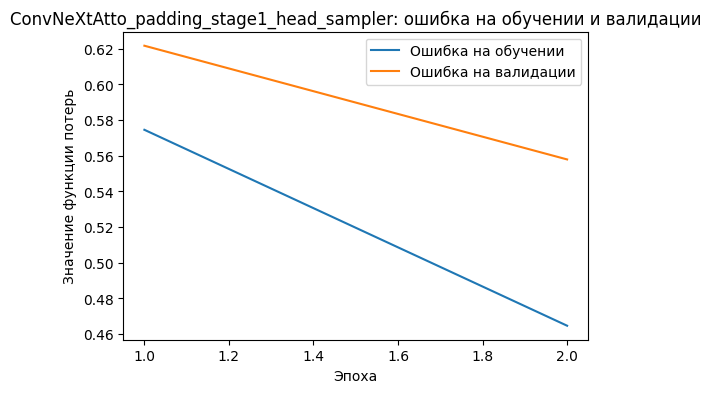

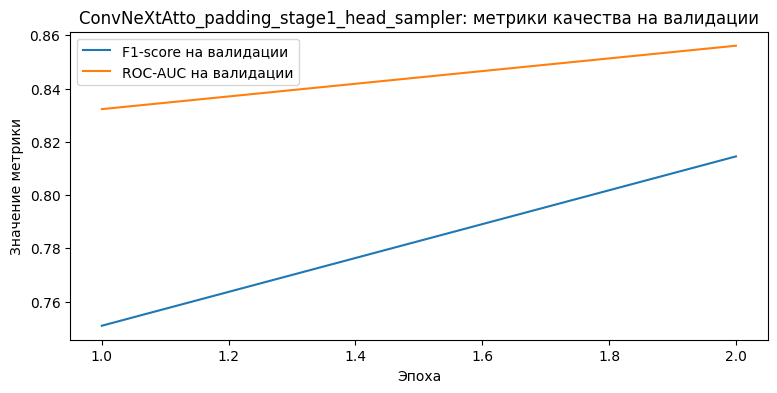

                 precision    recall  f1-score   support

Без повреждений       0.17      0.80      0.29        15
С повреждениями       0.98      0.70      0.81       189

       accuracy                           0.71       204
      macro avg       0.58      0.75      0.55       204
   weighted avg       0.92      0.71      0.78       204



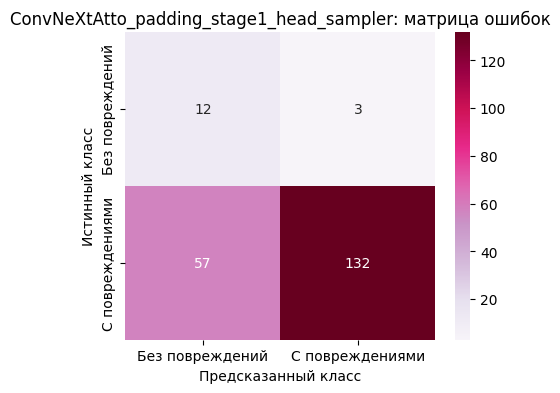

🏃 View run ConvNeXtAtto_padding_stage1_head_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/1b5347eb65964068bb4f157d634d0cbb
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [227]:
convnext_atto_padding_model, convnext_padding_stage1_history_data, convnext_padding_stage1_test_metrics = run_cv_experiment(model_name='ConvNeXtAtto_padding_stage1_head_sampler',
    model=convnext_atto_padding_model,
    train_loader=train_loader_padding_sampler,
    val_loader=val_loader_padding,
    test_loader=test_loader_padding,
    criterion=convnext_padding_stage1_criterion,
    optimizer=convnext_padding_stage1_optimizer,
    device=device,
    num_epochs=2,
    params=convnext_padding_stage1_params)

Теперь размораживаем всю модель и делаем fine-tuning с меньшим learning rate

In [228]:
unfreeze_model(convnext_atto_padding_model)

In [229]:
summary(convnext_atto_padding_model, input_size=(batch_size, 3, image_size, image_size), col_names=['input_size', 'output_size', 'num_params', 'trainable'], depth=3, device=device)

Layer (type:depth-idx)                             Input Shape               Output Shape              Param #                   Trainable
SqueezeModel                                       [32, 3, 224, 224]         [32]                      --                        True
├─ConvNeXt: 1-1                                    [32, 3, 224, 224]         [32, 1]                   --                        True
│    └─Sequential: 2-1                             [32, 3, 224, 224]         [32, 40, 56, 56]          --                        True
│    │    └─Conv2d: 3-1                            [32, 3, 224, 224]         [32, 40, 56, 56]          1,960                     True
│    │    └─LayerNorm2d: 3-2                       [32, 40, 56, 56]          [32, 40, 56, 56]          80                        True
│    └─Sequential: 2-2                             [32, 40, 56, 56]          [32, 320, 7, 7]           --                        True
│    │    └─ConvNeXtStage: 3-3                     [32, 4

In [230]:
convnext_padding_stage2_criterion = nn.BCEWithLogitsLoss()
convnext_padding_stage2_optimizer = optim.AdamW(convnext_atto_padding_model.parameters(), lr=1e-5, weight_decay=1e-5)

In [231]:
convnext_padding_stage2_params = {'model_name': 'ConvNeXtAtto_padding_stage2_finetune_sampler',
    'architecture': 'convnext_atto',
    'preprocessing': 'ResizeWithPadding',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'fine_tuning_all_layers',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 4,
    'learning_rate': 1e-5,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset_padding),
    'val_size': len(val_dataset_padding),
    'test_size': len(test_dataset_padding),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/4 | ошибка на обучении: 0.3698 | ошибка на валидации: 0.4902 | accuracy: 0.7341 | F1: 0.8380 | ROC-AUC: 0.8520 | время эпохи: 14.3 сек
Эпоха 2/4 | ошибка на обучении: 0.2485 | ошибка на валидации: 0.3662 | accuracy: 0.8382 | F1: 0.9073 | ROC-AUC: 0.8530 | время эпохи: 13.6 сек
Эпоха 3/4 | ошибка на обучении: 0.2034 | ошибка на валидации: 0.3646 | accuracy: 0.8382 | F1: 0.9073 | ROC-AUC: 0.8509 | время эпохи: 14.3 сек
Эпоха 4/4 | ошибка на обучении: 0.1425 | ошибка на валидации: 0.2955 | accuracy: 0.8671 | F1: 0.9251 | ROC-AUC: 0.8551 | время эпохи: 14.4 сек


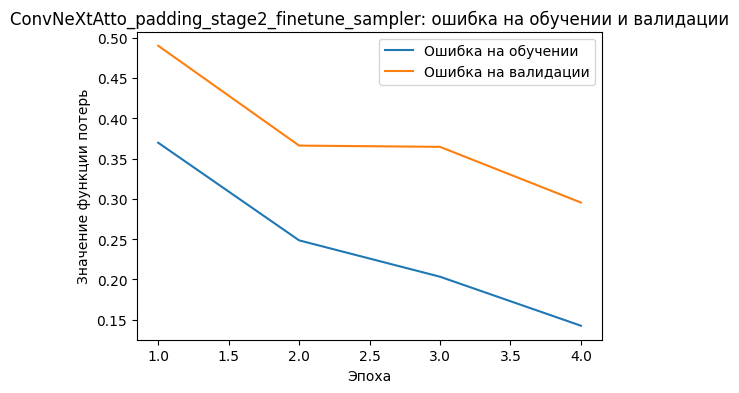

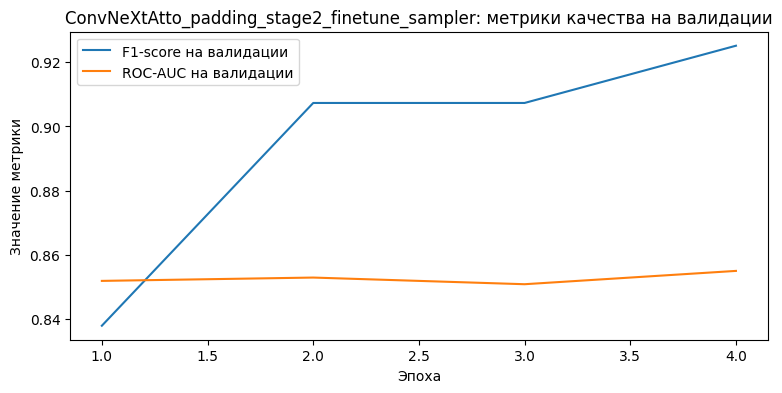

                 precision    recall  f1-score   support

Без повреждений       0.38      0.67      0.49        15
С повреждениями       0.97      0.92      0.94       189

       accuracy                           0.90       204
      macro avg       0.68      0.79      0.72       204
   weighted avg       0.93      0.90      0.91       204



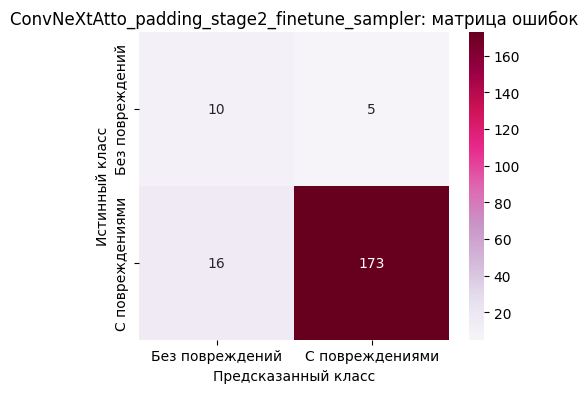

🏃 View run ConvNeXtAtto_padding_stage2_finetune_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/b804d9d888ab49169ea910481a8e17db
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [232]:
convnext_atto_padding_model, convnext_atto_padding_history_data, convnext_atto_padding_test_metrics = run_cv_experiment(model_name='ConvNeXtAtto_padding_stage2_finetune_sampler',
    model=convnext_atto_padding_model,
    train_loader=train_loader_padding_sampler,
    val_loader=val_loader_padding,
    test_loader=test_loader_padding,
    criterion=convnext_padding_stage2_criterion,
    optimizer=convnext_padding_stage2_optimizer,
    device=device,
    num_epochs=4,
    params=convnext_padding_stage2_params)

In [233]:
convnext_preprocessing_comparison = pd.DataFrame([{'experiment': 'ConvNeXt Atto + Resize + Sampler',
        'test_accuracy': convnext_atto_test_metrics['accuracy'],
        'test_balanced_accuracy': convnext_atto_test_metrics['balanced_accuracy'],
        'test_macro_f1': convnext_atto_test_metrics['macro_f1'],
        'test_f1_class_0': convnext_atto_test_metrics['f1_class_0'],
        'test_roc_auc': convnext_atto_test_metrics['roc_auc']},
    {'experiment': 'ConvNeXt Atto + Padding + Sampler',
        'test_accuracy': convnext_atto_padding_test_metrics['accuracy'],
        'test_balanced_accuracy': convnext_atto_padding_test_metrics['balanced_accuracy'],
        'test_macro_f1': convnext_atto_padding_test_metrics['macro_f1'],
        'test_f1_class_0': convnext_atto_padding_test_metrics['f1_class_0'],
        'test_roc_auc': convnext_atto_padding_test_metrics['roc_auc']}])
convnext_preprocessing_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,ConvNeXt Atto + Resize + Sampler,0.882353,0.813757,0.705981,0.478261,0.859612
1,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423


Resize + Padding дал лучший результат, чем обычный Resize. У padding версии выше accuracy, balanced accuracy, macro F1, F1-score для класса “Без повреждений” и ROC-AUC. Главное улучшение видно по редкому классу Condition = 0: F1-score вырос с 0.48 до 0.51. Сохранение пропорций изображения помогло модели немного лучше различать автомобили без повреждений и снизить число ошибок по редкому классу

### Модель 3. EfficientNet-B0 + Padding + WeightedRandomSampler

Следующей моделью протестируем EfficientNet-B0. Это отдельная предобученная CNN архитектура, поэтому она хорошо подходит для сравнения с BaselineCNN и ConvNeXt Atto. Используем тот же preprocessing, который оказался лучшим для ConvNeXt Atto: Resize + Padding. Также оставляем WeightedRandomSampler, потому что проблема дисбаланса классов сохраняется. Обучение проведем в два этапа: сначала заморозим backbone и обучим только классификационный слой, затем разморозим всю модель и сделаем короткий fine-tuning с меньшим learning rate

Создаем EfficientNet-B0

In [234]:
def create_efficientnet_b0_model():
    weights = models.EfficientNet_B0_Weights.DEFAULT
    base_model = models.efficientnet_b0(weights=weights)
    in_features = base_model.classifier[-1].in_features
    base_model.classifier[-1] = nn.Linear(in_features, 1)
    model = SqueezeModel(base_model)
    return model

In [235]:
def freeze_efficientnet_backbone(model):
    for param in model.parameters():
        param.requires_grad = False
    for param in model.model.classifier.parameters():
        param.requires_grad = True

Проверим, что выход модели имеет нужную форму

In [236]:
efficientnet_b0_model = create_efficientnet_b0_model().to(device)
test_batch_images, test_batch_labels = next(iter(train_loader_padding_sampler))
with torch.no_grad():
    test_outputs = efficientnet_b0_model(test_batch_images.to(device))
test_outputs.shape

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 124MB/s]


torch.Size([32])

обучаем только classifier

In [237]:
efficientnet_b0_model = create_efficientnet_b0_model().to(device)

In [238]:
freeze_efficientnet_backbone(efficientnet_b0_model)

In [239]:
summary(efficientnet_b0_model, input_size=(batch_size, 3, image_size, image_size), col_names=['input_size', 'output_size', 'num_params', 'trainable'], depth=3, device=device)

Layer (type:depth-idx)                                       Input Shape               Output Shape              Param #                   Trainable
SqueezeModel                                                 [32, 3, 224, 224]         [32]                      --                        Partial
├─EfficientNet: 1-1                                          [32, 3, 224, 224]         [32, 1]                   --                        Partial
│    └─Sequential: 2-1                                       [32, 3, 224, 224]         [32, 1280, 7, 7]          --                        False
│    │    └─Conv2dNormActivation: 3-1                        [32, 3, 224, 224]         [32, 32, 112, 112]        (928)                     False
│    │    └─Sequential: 3-2                                  [32, 32, 112, 112]        [32, 16, 112, 112]        (1,448)                   False
│    │    └─Sequential: 3-3                                  [32, 16, 112, 112]        [32, 24, 56, 56]          (16,714) 

In [240]:
efficientnet_stage1_criterion = nn.BCEWithLogitsLoss()
efficientnet_stage1_optimizer = optim.AdamW(filter(lambda param: param.requires_grad, efficientnet_b0_model.parameters()), lr=1e-3, weight_decay=1e-5)

In [241]:
efficientnet_stage1_params = {'model_name': 'EfficientNetB0_padding_stage1_classifier_sampler',
    'architecture': 'efficientnet_b0',
    'preprocessing': 'ResizeWithPadding',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'classifier_only',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 2,
    'learning_rate': 1e-3,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset_padding),
    'val_size': len(val_dataset_padding),
    'test_size': len(test_dataset_padding),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/2 | ошибка на обучении: 0.6174 | ошибка на валидации: 0.5402 | accuracy: 0.8092 | F1: 0.8889 | ROC-AUC: 0.8582 | время эпохи: 10.4 сек
Эпоха 2/2 | ошибка на обучении: 0.5129 | ошибка на валидации: 0.5121 | accuracy: 0.7803 | F1: 0.8690 | ROC-AUC: 0.8737 | время эпохи: 11.0 сек


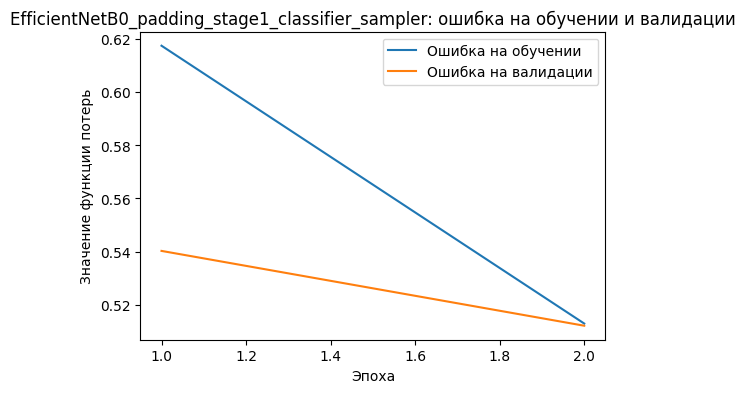

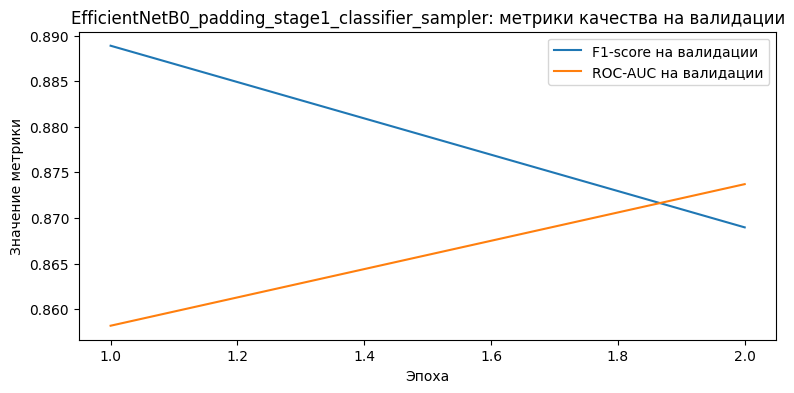

                 precision    recall  f1-score   support

Без повреждений       0.23      0.67      0.34        15
С повреждениями       0.97      0.83      0.89       189

       accuracy                           0.81       204
      macro avg       0.60      0.75      0.62       204
   weighted avg       0.91      0.81      0.85       204



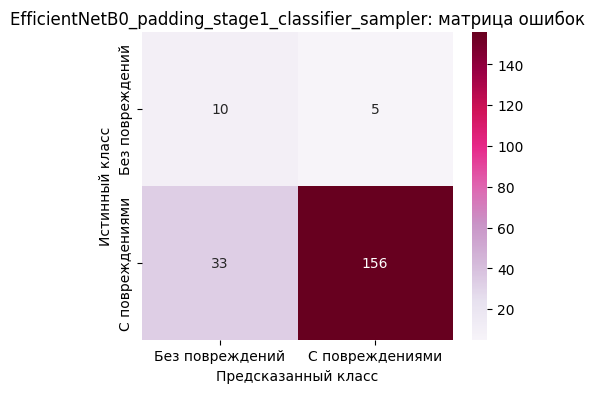

🏃 View run EfficientNetB0_padding_stage1_classifier_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/792f72521bdb412eb2ffdba1bf783033
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [242]:
efficientnet_b0_model, efficientnet_stage1_history_data, efficientnet_stage1_test_metrics = run_cv_experiment(model_name='EfficientNetB0_padding_stage1_classifier_sampler',
    model=efficientnet_b0_model,
    train_loader=train_loader_padding_sampler,
    val_loader=val_loader_padding,
    test_loader=test_loader_padding,
    criterion=efficientnet_stage1_criterion,
    optimizer=efficientnet_stage1_optimizer,
    device=device,
    num_epochs=2,
    params=efficientnet_stage1_params)

fine-tuning всей модели

In [243]:
unfreeze_model(efficientnet_b0_model)

In [244]:
summary(efficientnet_b0_model, input_size=(batch_size, 3, image_size, image_size), col_names=['input_size', 'output_size', 'num_params', 'trainable'], depth=3, device=device)

Layer (type:depth-idx)                                       Input Shape               Output Shape              Param #                   Trainable
SqueezeModel                                                 [32, 3, 224, 224]         [32]                      --                        True
├─EfficientNet: 1-1                                          [32, 3, 224, 224]         [32, 1]                   --                        True
│    └─Sequential: 2-1                                       [32, 3, 224, 224]         [32, 1280, 7, 7]          --                        True
│    │    └─Conv2dNormActivation: 3-1                        [32, 3, 224, 224]         [32, 32, 112, 112]        928                       True
│    │    └─Sequential: 3-2                                  [32, 32, 112, 112]        [32, 16, 112, 112]        1,448                     True
│    │    └─Sequential: 3-3                                  [32, 16, 112, 112]        [32, 24, 56, 56]          16,714            

In [245]:
efficientnet_stage2_criterion = nn.BCEWithLogitsLoss()
efficientnet_stage2_optimizer = optim.AdamW(efficientnet_b0_model.parameters(), lr=1e-5, weight_decay=1e-5)

In [246]:
efficientnet_stage2_params = {'model_name': 'EfficientNetB0_padding_stage2_finetune_sampler',
    'architecture': 'efficientnet_b0',
    'preprocessing': 'ResizeWithPadding',
    'imbalance_strategy': 'WeightedRandomSampler',
    'training_stage': 'fine_tuning_all_layers',
    'image_size': image_size,
    'batch_size': batch_size,
    'num_epochs': 4,
    'learning_rate': 1e-5,
    'optimizer': 'AdamW',
    'loss_function': 'BCEWithLogitsLoss',
    'use_pretrained': True,
    'train_size': len(train_dataset_padding),
    'val_size': len(val_dataset_padding),
    'test_size': len(test_dataset_padding),
    'random_state': random_state,
    'tracking_mode': tracking_mode}

Эпоха 1/4 | ошибка на обучении: 0.5310 | ошибка на валидации: 0.5073 | accuracy: 0.7919 | F1: 0.8776 | ROC-AUC: 0.8727 | время эпохи: 13.6 сек
Эпоха 2/4 | ошибка на обучении: 0.4903 | ошибка на валидации: 0.4931 | accuracy: 0.8150 | F1: 0.8926 | ROC-AUC: 0.8778 | время эпохи: 13.1 сек
Эпоха 3/4 | ошибка на обучении: 0.4627 | ошибка на валидации: 0.4718 | accuracy: 0.8266 | F1: 0.9000 | ROC-AUC: 0.8778 | время эпохи: 13.9 сек
Эпоха 4/4 | ошибка на обучении: 0.4373 | ошибка на валидации: 0.4355 | accuracy: 0.8497 | F1: 0.9145 | ROC-AUC: 0.8835 | время эпохи: 13.2 сек


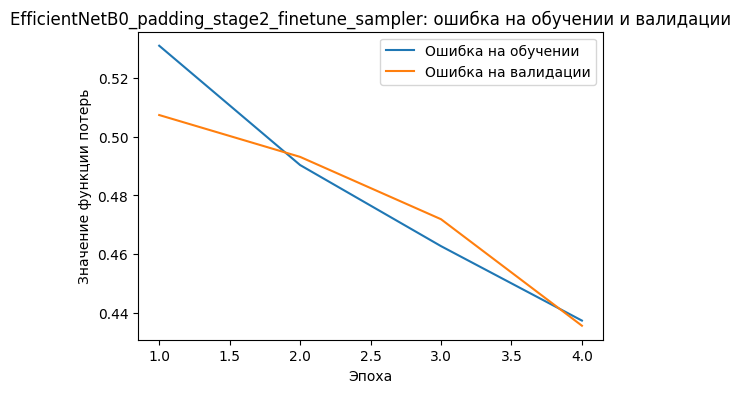

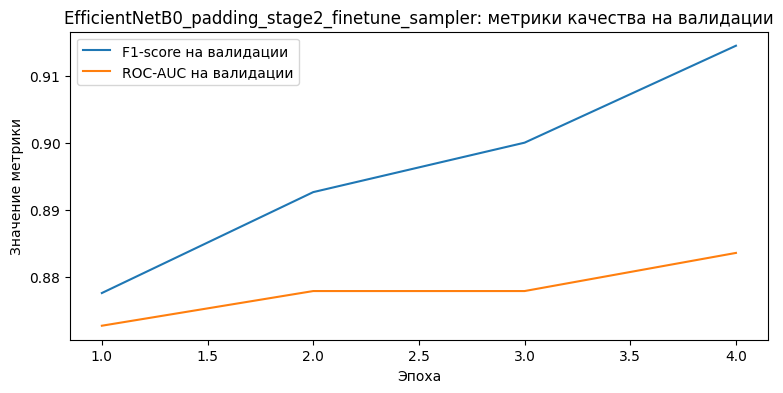

                 precision    recall  f1-score   support

Без повреждений       0.26      0.67      0.38        15
С повреждениями       0.97      0.85      0.91       189

       accuracy                           0.84       204
      macro avg       0.62      0.76      0.64       204
   weighted avg       0.92      0.84      0.87       204



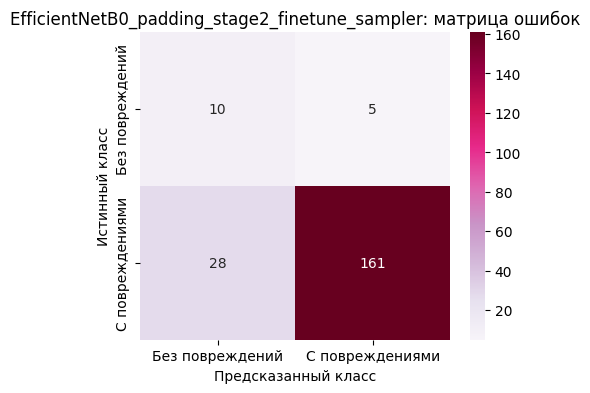

🏃 View run EfficientNetB0_padding_stage2_finetune_sampler at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/dae7490f3b7944d6893ea65c66c17e27
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


In [247]:
efficientnet_b0_model, efficientnet_b0_history_data, efficientnet_b0_test_metrics = run_cv_experiment(model_name='EfficientNetB0_padding_stage2_finetune_sampler',
    model=efficientnet_b0_model,
    train_loader=train_loader_padding_sampler,
    val_loader=val_loader_padding,
    test_loader=test_loader_padding,
    criterion=efficientnet_stage2_criterion,
    optimizer=efficientnet_stage2_optimizer,
    device=device,
    num_epochs=4,
    params=efficientnet_stage2_params)

финалочка для сравнения

In [248]:
advanced_models_comparison = pd.DataFrame([{'experiment': 'ConvNeXt Atto + Padding + Sampler',
        'test_accuracy': convnext_atto_padding_test_metrics['accuracy'],
        'test_balanced_accuracy': convnext_atto_padding_test_metrics['balanced_accuracy'],
        'test_macro_f1': convnext_atto_padding_test_metrics['macro_f1'],
        'test_f1_class_0': convnext_atto_padding_test_metrics['f1_class_0'],
        'test_roc_auc': convnext_atto_padding_test_metrics['roc_auc']},
    {'experiment': 'EfficientNet-B0 + Padding + Sampler',
        'test_accuracy': efficientnet_b0_test_metrics['accuracy'],
        'test_balanced_accuracy': efficientnet_b0_test_metrics['balanced_accuracy'],
        'test_macro_f1': efficientnet_b0_test_metrics['macro_f1'],
        'test_f1_class_0': efficientnet_b0_test_metrics['f1_class_0'],
        'test_roc_auc': efficientnet_b0_test_metrics['roc_auc']}])
advanced_models_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423
1,EfficientNet-B0 + Padding + Sampler,0.838235,0.759259,0.642200,0.377358,0.796120


EfficientNet-B0 была протестирована как отдельная CNN-архитектура в тех же условиях, что и ConvNeXt Atto: Resize + Padding, WeightedRandomSampler и двухэтапное обучение.

После fine-tuning качество EfficientNet-B0 улучшилось по сравнению с первым этапом, accuracy выросла до 0.84, macro F1 до 0.64, а F1-score для класса “Без повреждений” до 0.36. Fine-tuning помог модели уменьшить количество ложных предсказаний класса “Без повреждений”.

Однако EfficientNet-B0 уступила ConvNeXt Atto + Padding. У ConvNeXt выше accuracy, balanced accuracy, macro F1, ROC-AUC и F1-score для редкого класса Condition = 0. Поэтому лучшей моделью на текущем этапе является ConvNeXt Atto + Padding + WeightedRandomSampler + fine-tuning

### Финальная таблица

In [249]:
all_model_comparison = pd.concat([baseline_comparison, convnext_preprocessing_comparison, advanced_models_comparison], ignore_index=True)
all_model_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,BaselineCNN + Resize,0.926471,0.500000,0.480916,0.000000,0.567549
1,BaselineCNN + Padding,0.926471,0.500000,0.480916,0.000000,0.445855
2,BaselineCNN + WeightedRandomSampler,0.705882,0.442328,0.444041,0.062500,0.536155
3,ConvNeXt Atto + Resize + Sampler,0.882353,0.813757,0.705981,0.478261,0.859612
4,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423
5,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423
6,EfficientNet-B0 + Padding + Sampler,0.838235,0.759259,0.642200,0.377358,0.796120


In [250]:
all_model_comparison = all_model_comparison.drop_duplicates(subset='experiment', keep='last').reset_index(drop=True)
all_model_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,BaselineCNN + Resize,0.926471,0.500000,0.480916,0.000000,0.567549
1,BaselineCNN + Padding,0.926471,0.500000,0.480916,0.000000,0.445855
2,BaselineCNN + WeightedRandomSampler,0.705882,0.442328,0.444041,0.062500,0.536155
3,ConvNeXt Atto + Resize + Sampler,0.882353,0.813757,0.705981,0.478261,0.859612
4,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423
5,EfficientNet-B0 + Padding + Sampler,0.838235,0.759259,0.642200,0.377358,0.796120


In [251]:
all_model_comparison = all_model_comparison.sort_values('test_macro_f1', ascending=False).reset_index(drop=True)
all_model_comparison

,experiment,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,ConvNeXt Atto + Padding + Sampler,0.897059,0.791005,0.715292,0.487805,0.880423
1,ConvNeXt Atto + Resize + Sampler,0.882353,0.813757,0.705981,0.478261,0.859612
2,EfficientNet-B0 + Padding + Sampler,0.838235,0.759259,0.642200,0.377358,0.796120
3,BaselineCNN + Resize,0.926471,0.500000,0.480916,0.000000,0.567549
4,BaselineCNN + Padding,0.926471,0.500000,0.480916,0.000000,0.445855
5,BaselineCNN + WeightedRandomSampler,0.705882,0.442328,0.444041,0.062500,0.536155


По итогам сравнения лучшей моделью стала ConvNeXt Atto + Padding + WeightedRandomSampler. Она показала наилучшие значения macro F1, balanced accuracy, ROC-AUC и F1-score для редкого класса Condition = 0.

BaselineCNN показала высокую accuracy, но практически не распознавала класс “Без повреждений”. WeightedRandomSampler помог простой CNN начать находить редкий класс, но качество осталось нестабильным. EfficientNet-B0 улучшила качество относительно baseline, но уступила ConvNeXt Atto

### Подбор порога для лучшей модели

По итогам сравнения лучшей моделью стала ConvNeXt Atto + Padding + WeightedRandomSampler + fine-tuning. Однако до этого все модели переводили вероятности в классы по стандартному порогу 0.5.

При сильном дисбалансе классов такой порог не всегда оптимален. Поэтому дополнительно подберем порог на validation выборке. Test выборку не используем для подбора порога, чтобы не допустить утечку информации из финальной оценки.

Основная метрика для выбора порога = macro F1, т. к. она учитывает качество по обоим классам и не дает мажоритарному классу полностью доминировать в оценке

Получаем вероятности лучшей модели на validation

In [252]:
val_labels, val_preds, val_probs = get_predictions(model=convnext_atto_padding_model, dataloader=val_loader_padding, device=device)
val_labels = np.array(val_labels).reshape(-1)
val_probs = np.array(val_probs).reshape(-1)
val_labels.shape, val_probs.shape

((173,), (173,))

Функцию  оценки при заданном пороге напишем

In [253]:
def evaluate_predictions_at_threshold(y_true, y_probs, threshold):
    y_pred = (y_probs>=threshold).astype(int)
    metrics = {'threshold': threshold,
        'accuracy': accuracy_score(y_true, y_pred),
        'balanced_accuracy': balanced_accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, zero_division=0),
        'recall': recall_score(y_true, y_pred, zero_division=0),
        'f1': f1_score(y_true, y_pred, zero_division=0),
        'macro_f1': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'precision_class_0': precision_score(y_true, y_pred, pos_label=0, zero_division=0),
        'recall_class_0': recall_score(y_true, y_pred, pos_label=0, zero_division=0),
        'f1_class_0': f1_score(y_true, y_pred, pos_label=0, zero_division=0)}

    return metrics

Перебираем пороги на validation

In [254]:
threshold_results = []
for threshold in np.arange(0.05, 0.96, 0.01):
    threshold_metrics = evaluate_predictions_at_threshold(y_true=val_labels, y_probs=val_probs, threshold=threshold)
    threshold_results.append(threshold_metrics)

In [255]:
threshold_results = pd.DataFrame(threshold_results)
threshold_results.head()

,threshold,accuracy,balanced_accuracy,precision,recall,f1,macro_f1,precision_class_0,recall_class_0,f1_class_0
0,0.05,0.942197,0.583333,0.941520,1.000000,0.969880,0.627797,1.000000,0.166667,0.285714
1,0.06,0.947977,0.663561,0.952381,0.993789,0.972644,0.721616,0.800000,0.333333,0.470588
2,0.07,0.947977,0.702122,0.957831,0.987578,0.972477,0.749396,0.714286,0.416667,0.526316
3,0.08,0.947977,0.702122,0.957831,0.987578,0.972477,0.749396,0.714286,0.416667,0.526316
4,0.09,0.947977,0.702122,0.957831,0.987578,0.972477,0.749396,0.714286,0.416667,0.526316


In [256]:
threshold_results.sort_values('macro_f1', ascending=False).head(10)

,threshold,accuracy,balanced_accuracy,precision,recall,f1,macro_f1,precision_class_0,recall_class_0,f1_class_0
26,0.31,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593
28,0.33,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593
27,0.32,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593
30,0.35,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593
29,0.34,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593
16,0.21,0.947977,0.740683,0.963415,0.981366,0.972308,0.771868,0.666667,0.500000,0.571429
15,0.20,0.947977,0.740683,0.963415,0.981366,0.972308,0.771868,0.666667,0.500000,0.571429
14,0.19,0.947977,0.740683,0.963415,0.981366,0.972308,0.771868,0.666667,0.500000,0.571429
17,0.22,0.947977,0.740683,0.963415,0.981366,0.972308,0.771868,0.666667,0.500000,0.571429
10,0.15,0.947977,0.740683,0.963415,0.981366,0.972308,0.771868,0.666667,0.500000,0.571429


Выбираем лучший порог по macro F1

In [257]:
best_threshold = threshold_results.sort_values('macro_f1', ascending=False).iloc[0]['threshold']
best_threshold

np.float64(0.31000000000000005)

In [258]:
best_threshold_metrics = threshold_results[threshold_results['threshold'] == best_threshold]
best_threshold_metrics

,threshold,accuracy,balanced_accuracy,precision,recall,f1,macro_f1,precision_class_0,recall_class_0,f1_class_0
26,0.31,0.936416,0.811594,0.974684,0.956522,0.965517,0.779055,0.533333,0.666667,0.592593


Визуализируем влияние порога

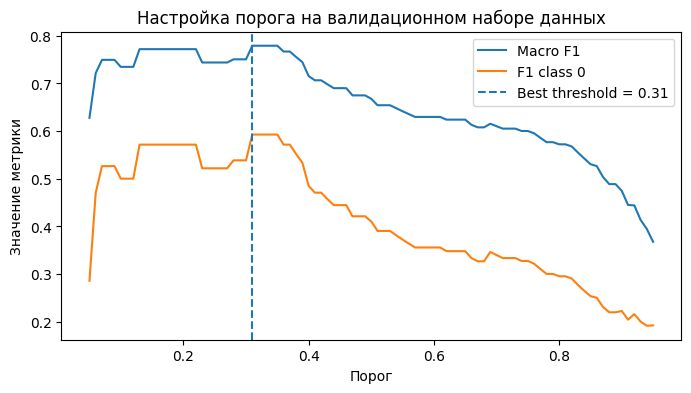

In [259]:
plt.figure(figsize=(8, 4))
plt.plot(threshold_results['threshold'], threshold_results['macro_f1'], label='Macro F1')
plt.plot(threshold_results['threshold'], threshold_results['f1_class_0'], label='F1 class 0')
plt.axvline(best_threshold, linestyle='--', label=f'Best threshold = {best_threshold:.2f}')
plt.xlabel('Порог')
plt.ylabel('Значение метрики')
plt.title('Настройка порога на валидационном наборе данных')
plt.legend()
plt.show()

Финальная проверка на test с найденным порогом

In [260]:
test_labels, test_preds, test_probs = get_predictions(model=convnext_atto_padding_model, dataloader=test_loader_padding, device=device)

In [261]:
test_labels = np.array(test_labels).reshape(-1)
test_probs = np.array(test_probs).reshape(-1)
test_preds_tuned = (test_probs>=best_threshold).astype(int)

In [262]:
print(classification_report(test_labels, test_preds_tuned, target_names=['Без повреждений', 'С повреждениями'], zero_division=0))

                 precision    recall  f1-score   support

Без повреждений       0.62      0.67      0.65        15
С повреждениями       0.97      0.97      0.97       189

       accuracy                           0.95       204
      macro avg       0.80      0.82      0.81       204
   weighted avg       0.95      0.95      0.95       204



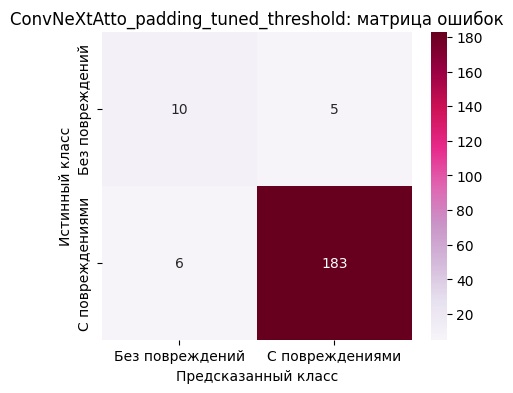

'ConvNeXtAtto_padding_tuned_threshold_confusion_matrix.png'

In [263]:
save_confusion_matrix_plot(y_true=test_labels, y_pred=test_preds_tuned, model_name='ConvNeXtAtto_padding_tuned_threshold')

In [264]:
convnext_tuned_metrics = evaluate_predictions_at_threshold(y_true=test_labels, y_probs=test_probs, threshold=best_threshold)
convnext_tuned_metrics

{'threshold': np.float64(0.31000000000000005),
 'accuracy': 0.946078431372549,
 'balanced_accuracy': np.float64(0.8174603174603174),
 'precision': 0.973404255319149,
 'recall': 0.9682539682539683,
 'f1': 0.9708222811671088,
 'macro_f1': 0.8079917857448446,
 'precision_class_0': 0.625,
 'recall_class_0': 0.6666666666666666,
 'f1_class_0': 0.6451612903225806}

Сравниваем

In [265]:
convnext_threshold_comparison = pd.DataFrame([{'experiment': 'ConvNeXt Atto + Padding, threshold=0.5',
        'threshold': 0.5,
        'test_accuracy': convnext_atto_padding_test_metrics['accuracy'],
        'test_balanced_accuracy': convnext_atto_padding_test_metrics['balanced_accuracy'],
        'test_macro_f1': convnext_atto_padding_test_metrics['macro_f1'],
        'test_f1_class_0': convnext_atto_padding_test_metrics['f1_class_0'],
        'test_roc_auc': convnext_atto_padding_test_metrics['roc_auc']},
    {'experiment': 'ConvNeXt Atto + Padding, tuned threshold',
        'threshold': best_threshold,
        'test_accuracy': convnext_tuned_metrics['accuracy'],
        'test_balanced_accuracy': convnext_tuned_metrics['balanced_accuracy'],
        'test_macro_f1': convnext_tuned_metrics['macro_f1'],
        'test_f1_class_0': convnext_tuned_metrics['f1_class_0'],
        'test_roc_auc': convnext_atto_padding_test_metrics['roc_auc']}])
convnext_threshold_comparison

,experiment,threshold,test_accuracy,test_balanced_accuracy,test_macro_f1,test_f1_class_0,test_roc_auc
0,"ConvNeXt Atto + Padding, threshold=0.5",0.50,0.897059,0.791005,0.715292,0.487805,0.880423
1,"ConvNeXt Atto + Padding, tuned threshold",0.31,0.946078,0.817460,0.807992,0.645161,0.880423


In [266]:
if mlflow.active_run() is not None:
    mlflow.end_run()

In [267]:
threshold_results_path = 'ConvNeXtAtto_padding_threshold_results.csv'
threshold_comparison_path = 'ConvNeXtAtto_padding_threshold_comparison.csv'
tuned_predictions_path = 'ConvNeXtAtto_padding_tuned_threshold_predictions.csv'

In [268]:
threshold_results.to_csv(threshold_results_path, index=False)
convnext_threshold_comparison.to_csv(threshold_comparison_path, index=False)

In [269]:
tuned_predictions_data = pd.DataFrame({'true_label': test_labels, 'predicted_label': test_preds_tuned, 'predicted_probability_damage': test_probs})
tuned_predictions_data.to_csv(tuned_predictions_path, index=False)

                 precision    recall  f1-score   support

Без повреждений       0.62      0.67      0.65        15
С повреждениями       0.97      0.97      0.97       189

       accuracy                           0.95       204
      macro avg       0.80      0.82      0.81       204
   weighted avg       0.95      0.95      0.95       204



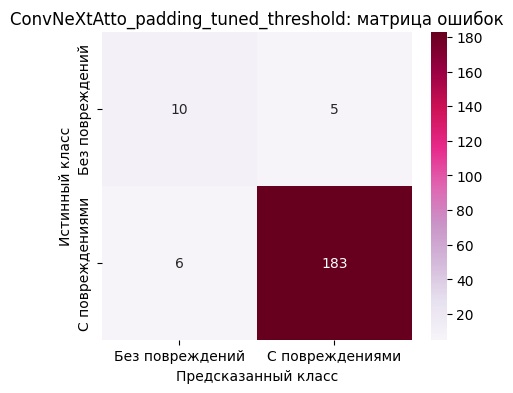

In [270]:
tuned_report_path = save_classification_report(y_true=test_labels, y_pred=test_preds_tuned, model_name='ConvNeXtAtto_padding_tuned_threshold')
tuned_conf_matrix_path = save_confusion_matrix_plot(y_true=test_labels, y_pred=test_preds_tuned, model_name='ConvNeXtAtto_padding_tuned_threshold')

In [271]:
final_model_package = {'model_state_dict': {key: value.detach().cpu() for key, value in convnext_atto_padding_model.state_dict().items()},
    'architecture': 'convnext_atto',
    'preprocessing': 'ResizeWithPadding',
    'image_size': image_size,
    'imagenet_mean': imagenet_mean,
    'imagenet_std': imagenet_std,
    'threshold': float(best_threshold),
    'class_names': ['Без повреждений', 'С повреждениями'],
    'positive_class': 1,
    'model_description': 'ConvNeXt Atto + Padding + WeightedRandomSampler + fine-tuning + tuned threshold'}
final_model_path = 'ConvNeXtAtto_padding_final_model_package.pt'
torch.save(final_model_package, final_model_path)

In [272]:
with mlflow.start_run(run_name='ConvNeXtAtto_padding_threshold_tuning'):
    mlflow.set_tag('run_type', 'threshold_tuning_and_final_model_package')
    mlflow.set_tag('base_model', 'ConvNeXtAtto_padding_stage2_finetune_sampler')
    mlflow.set_tag('final_model', 'true')
    mlflow.log_param('model_name', 'ConvNeXtAtto_padding_tuned_threshold')
    mlflow.log_param('base_architecture', 'convnext_atto')
    mlflow.log_param('preprocessing', 'ResizeWithPadding')
    mlflow.log_param('imbalance_strategy', 'WeightedRandomSampler')
    mlflow.log_param('training_stage', 'fine_tuning_all_layers')
    mlflow.log_param('threshold_selection_metric', 'validation_macro_f1')
    mlflow.log_param('best_threshold', float(best_threshold))
    mlflow.log_param('image_size', image_size)
    mlflow.log_param('positive_class', 1)
    mlflow.log_metric('test_accuracy', convnext_tuned_metrics['accuracy'])
    mlflow.log_metric('test_balanced_accuracy', convnext_tuned_metrics['balanced_accuracy'])
    mlflow.log_metric('test_precision', convnext_tuned_metrics['precision'])
    mlflow.log_metric('test_recall', convnext_tuned_metrics['recall'])
    mlflow.log_metric('test_f1', convnext_tuned_metrics['f1'])
    mlflow.log_metric('test_macro_f1', convnext_tuned_metrics['macro_f1'])
    mlflow.log_metric('test_precision_class_0', convnext_tuned_metrics['precision_class_0'])
    mlflow.log_metric('test_recall_class_0', convnext_tuned_metrics['recall_class_0'])
    mlflow.log_metric('test_f1_class_0', convnext_tuned_metrics['f1_class_0'])
    mlflow.log_metric('test_roc_auc', convnext_atto_padding_test_metrics['roc_auc'])
    mlflow.log_artifact(threshold_results_path, artifact_path='threshold_tuning')
    mlflow.log_artifact(threshold_comparison_path, artifact_path='threshold_tuning')
    mlflow.log_artifact(tuned_predictions_path, artifact_path='predictions')
    mlflow.log_artifact(tuned_report_path, artifact_path='reports')
    mlflow.log_artifact(tuned_conf_matrix_path, artifact_path='plots')
    mlflow.log_artifact(train_split_path, artifact_path='data_splits')
    mlflow.log_artifact(val_split_path, artifact_path='data_splits')
    mlflow.log_artifact(test_split_path, artifact_path='data_splits')
    mlflow.log_artifact(final_model_path, artifact_path='final_model')

🏃 View run ConvNeXtAtto_padding_threshold_tuning at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0/runs/7378483a1f9742ecb566ae8d9c3918bd
🧪 View experiment at: https://dagshub.com/RenataMal/GP5.mlflow/#/experiments/0


Для лучшей модели ConvNeXt Atto + Padding + WeightedRandomSampler был выполнен подбор порога

### Анализ ошибок лучшей модели

После выбора финальной модели дополнительно проанализируем ошибки на test выборке. Нужно понять, какие изображения модель путает и насколько эти ошибки критичны для бизнес-задачи.

Для страхового сценария особенно опасна ошибка, когда поврежденный автомобиль классифицируется как автомобиль без повреждений. В этом случае страховой случай может быть пропущен. Обратная ошибка, когда автомобиль без повреждений классифицируется как поврежденный, менее опасна ведь такой объект можно отправить на ручную проверку

Собираем таблицу с предсказаниями

In [273]:
error_analysis_data = test_image_data.reset_index(drop=True)[['Image_path', 'Condition']].copy()

In [274]:
error_analysis_data['predicted_label'] = test_preds_tuned
error_analysis_data['predicted_probability_damage'] = test_probs

In [275]:
error_analysis_data.head()

,Image_path,Condition,predicted_label,predicted_probability_damage
0,img_7767995.jpg,1,1,0.989476
1,img_4518994.jpg,0,0,0.081198
2,img_4535755.jpg,1,1,0.793594
3,img_4538751.jpg,1,1,0.702753
4,img_4517147.jpg,1,1,0.983126


In [276]:
def get_error_type(row):
    if row['Condition'] == row['predicted_label']:
        return 'correct'
    elif row['Condition'] == 0 and row['predicted_label']==1:
        return 'clean_predicted_damaged'
    elif row['Condition'] == 1 and row['predicted_label']==0:
        return 'damaged_predicted_clean'

In [277]:
error_analysis_data['error_type'] = error_analysis_data.apply(get_error_type, axis=1)
error_analysis_data['error_type'].value_counts()

,count
error_type,
correct,193
damaged_predicted_clean,6
clean_predicted_damaged,5


Смотрим таблицы ошибок

In [278]:
clean_predicted_damaged = error_analysis_data[error_analysis_data['error_type']=='clean_predicted_damaged'].copy()
clean_predicted_damaged

,Image_path,Condition,predicted_label,predicted_probability_damage,error_type
46,img_4536339.jpg,0,1,0.722526,clean_predicted_damaged
109,img_4638141.jpg,0,1,0.977867,clean_predicted_damaged
162,img_7765970.jpg,0,1,0.561739,clean_predicted_damaged
173,img_7761263.jpg,0,1,0.683832,clean_predicted_damaged
191,img_4637947.jpg,0,1,0.935886,clean_predicted_damaged


In [279]:
damaged_predicted_clean = error_analysis_data[error_analysis_data['error_type']=='damaged_predicted_clean'].copy()
damaged_predicted_clean

,Image_path,Condition,predicted_label,predicted_probability_damage,error_type
11,img_4635123.jpg,1,0,0.271568,damaged_predicted_clean
39,img_4536902.jpg,1,0,0.229162,damaged_predicted_clean
57,img_4535296.jpg,1,0,0.209655,damaged_predicted_clean
68,img_4535632.jpg,1,0,0.237657,damaged_predicted_clean
110,img_7768446.jpg,1,0,0.296136,damaged_predicted_clean
120,img_4538798.jpg,1,0,0.203064,damaged_predicted_clean


Функция для показа ошибок

In [280]:
def show_error_examples(data, title, n_images=6):
    sample_data = data.head(n_images)
    image_paths = sample_data['Image_path'].tolist()
    if len(image_paths) == 0:
        print('Нет изображений для отображения')
        return
    plt.figure(figsize=(12, 8))
    for i in range(len(image_paths)):
        row = sample_data.iloc[i]
        image = plt.imread(DATA_DIR / 'trainImages' / image_paths[i])
        plt.subplot(2, 3, i+1)
        plt.imshow(image)
        plt.title(
            f"{row['Image_path']}\n"
            f"true={row['Condition']}, pred={row['predicted_label']}\n"
            f"prob_damage={row['predicted_probability_damage']:.3f}"
        )
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

Показываем менее критичные ошибки. Это автомобили без повреждений, которые модель отправила в класс “С повреждениями”

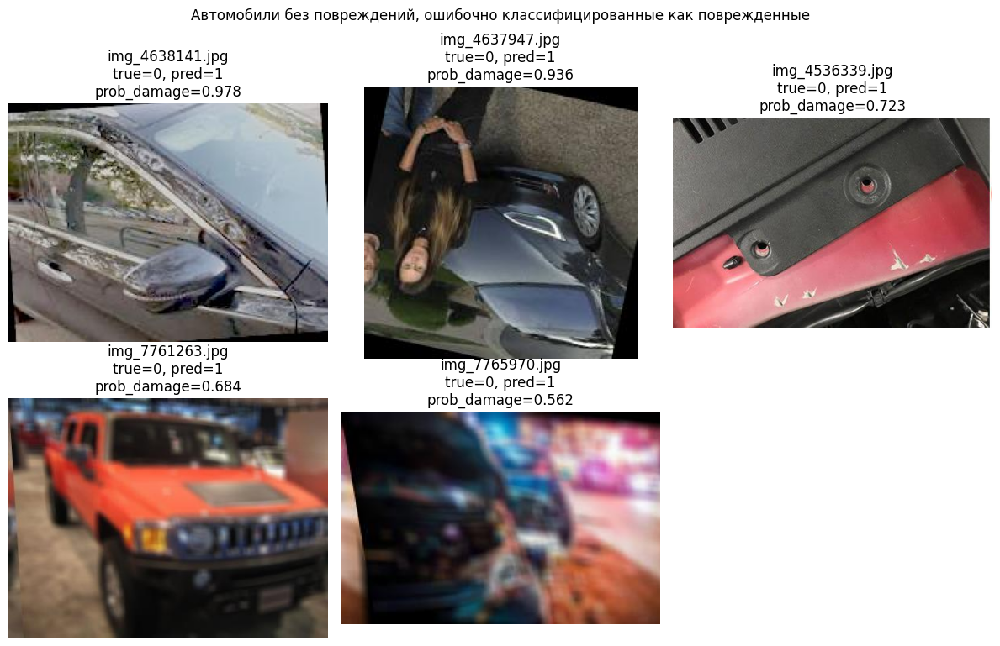

In [281]:
clean_predicted_damaged = clean_predicted_damaged.sort_values('predicted_probability_damage', ascending=False)
show_error_examples(data=clean_predicted_damaged, title='Автомобили без повреждений, ошибочно классифицированные как поврежденные', n_images=6)

Это поврежденные автомобили, которые модель ошибочно посчитала неповрежденными

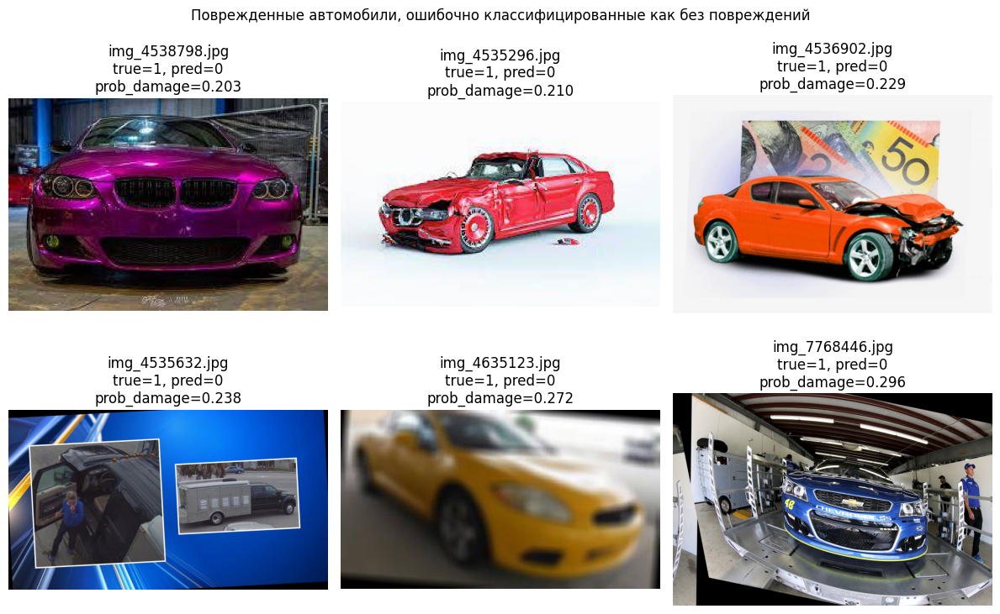

In [282]:
damaged_predicted_clean = damaged_predicted_clean.sort_values('predicted_probability_damage', ascending=True)
show_error_examples(data=damaged_predicted_clean, title='Поврежденные автомобили, ошибочно классифицированные как без повреждений', n_images=6)

### Проверка финальной модели на отдельном изображении

Загрузим отдельную папку с новыми jpg-фотографиями автомобилей. Эти изображения не использовались при обучении, валидации и подборе порога

Для демонстрации на защите добавим функцию инференса. Она загружает изображение, применяет ту же предобработку, считает вероятность повреждения и переводит ее в класс по сохраненному порогу

In [283]:
def predict_single_car_image(image_path, model, transform, device, threshold):
    model.eval()
    image = Image.open(image_path)
    image = ImageOps.exif_transpose(image)
    image = image.convert('RGB')
    image_np = np.array(image)
    image_tensor = transform(image_np).unsqueeze(0).to(device)
    with torch.no_grad():
        logit = model(image_tensor)
        probability_damage = torch.sigmoid(logit).item()
    predicted_label = int(probability_damage>=threshold)
    predicted_class = 'С повреждениями' if predicted_label == 1 else 'Без повреждений'
    return {'image_path': str(image_path), 'probability_damage': probability_damage, 'threshold': float(threshold), 'predicted_label': predicted_label, 'predicted_class': predicted_class}

In [284]:
if IN_COLAB:
    new_images_dir = Path('/content/drive/MyDrive/new_car_photos')
else:
    new_images_dir = Path('new_car_photos')

In [285]:
new_image_paths = sorted(list(new_images_dir.rglob('*.jpg')))

In [286]:
print(f'Найдено изображений: {len(new_image_paths)}')

Найдено изображений: 4


In [287]:
new_predictions = []

In [288]:
for image_path in new_image_paths:
    pred = predict_single_car_image(image_path=image_path, model=convnext_atto_padding_model, transform=eval_transforms_padding, device=device, threshold=best_threshold)
    new_predictions.append(pred)

In [289]:
new_predictions_df = pd.DataFrame(new_predictions)
new_predictions_df.to_csv('new_images_predictions.csv', index=False)
new_predictions_df

,image_path,probability_damage,threshold,predicted_label,predicted_class
0,/content/drive/MyDrive/new_car_photos/img_4512...,0.061690,0.31,0,Без повреждений
1,/content/drive/MyDrive/new_car_photos/img_4514...,0.966696,0.31,1,С повреждениями
2,/content/drive/MyDrive/new_car_photos/img_4514...,0.987573,0.31,1,С повреждениями
3,/content/drive/MyDrive/new_car_photos/img_4514...,0.012590,0.31,0,Без повреждений


In [290]:
n_images = min(4, len(new_predictions_df))

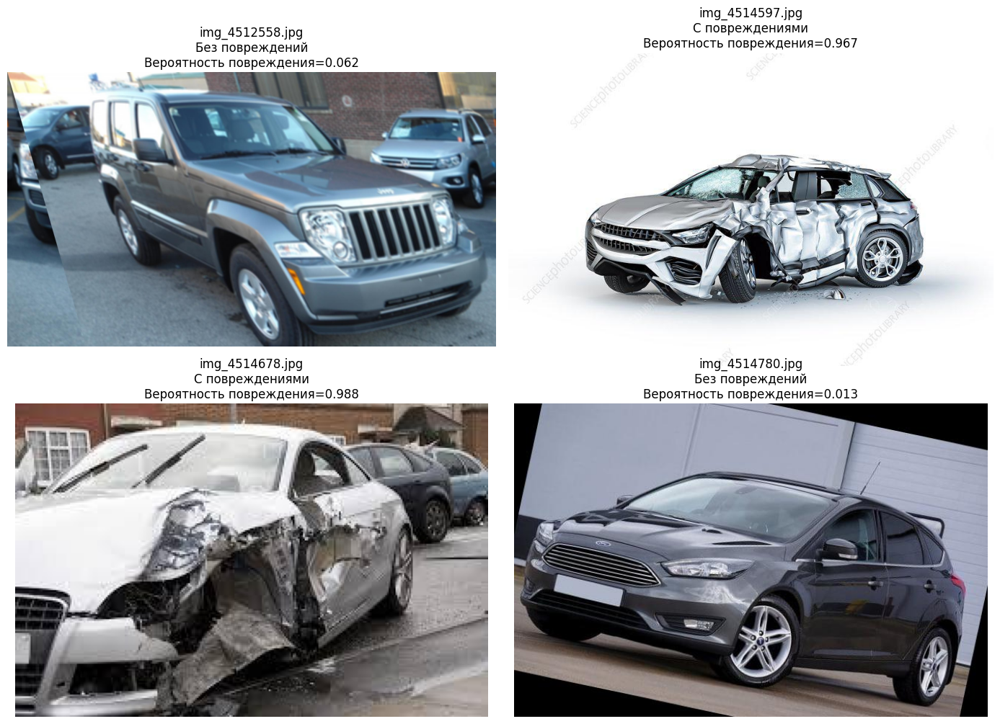

In [291]:
plt.figure(figsize=(14, 10))
for i in range(n_images):
    row = new_predictions_df.iloc[i]
    image = Image.open(row['image_path'])
    image = ImageOps.exif_transpose(image).convert('RGB')
    plt.subplot(2, 2, i+1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"{Path(row['image_path']).name}\n{row['predicted_class']}\nВероятность повреждения={row['probability_damage']:.3f}")
plt.tight_layout()
plt.show()

### Источники и ссылки

Добавим остальные использованные материалы

- Balanced accuracy, метрика при дисбалансе классов - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.balanced_accuracy_score.html
-F1-score и macro F1 для оценки качества по обоим классам - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html
- ConvNeXt CNN-архитектура для image classification - https://arxiv.org/abs/2201.03545, https://docs.pytorch.org/vision/main/models/convnext.html, https://medium.com/@xiaxiami/convnext-and-its-competitors-a-deep-technical-review-for-sota-convolution-networks-91ebfcae9e9a
-EfficientNet - https://proceedings.mlr.press/v97/tan19a.html
- `timm` библиотека предобученных моделей компьютерного зрения - https://huggingface.co/docs/timm/index
- Использование `timm.create_model` для загрузки предобученных CV-моделей - https://huggingface.co/docs/hub/timm
- Transfer Learning и fine-tuning предобученной CNN модели в PyTorch - https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html
- Нормализация изображений под ImageNet mean std для предобученных моделей - https://docs.pytorch.org/vision/stable/models.html
- WeightedRandomSampler для учета дисбаланса классов на этапе формирования батчей - https://docs.pytorch.org/docs/stable/data.html#torch.utils.data.WeightedRandomSampler
- Dropout регуляризация против переобучения нейронных сетей - https://medium.com/@vishnuam/dropout-in-convolutional-neural-networks-cnn-422a4a17da41
- Корректная обработка EXIF ориентации изображений через `ImageOps.exif_transpose` - https://pillow.readthedocs.io/en/stable/reference/ImageOps.html
- Проверка точных дубликатов изображений через хеширование файлов - https://docs.python.org/3/library/hashlib.html
- Laplacian operator в OpenCV для выделения резких изменений интенсивности на изображении - https://docs.opencv.org/4.x/d5/db5/tutorial_laplace_operator.html
- Variance of Laplacian, простая оценка размытия изображения - https://pyimagesearch.com/2015/09/07/blur-detection-with-opencv/
- Метрика colorfulness для оценки цветовой насыщенности изображений - https://infoscience.epfl.ch/bitstreams/77f5adab-e825-4995-92db-c9ff4cd8bf5a/download
- `pathlib.Path.rglob` для поиска новых `.jpg` изображений в папке при демонстрации - https://docs.python.org/3/library/pathlib.html